In [1]:
from utils import *
import utils as ut

In [2]:
whos

Variable                 Type        Data/Info
----------------------------------------------
ADASYN                   ABCMeta     <class 'imblearn.over_sampling._adasyn.ADASYN'>
BaseEstimator            type        <class 'sklearn.base.BaseEstimator'>
BorderlineSMOTE          ABCMeta     <class 'imblearn.over_sam<...>.filter.BorderlineSMOTE'>
ClfSwitcher              type        <class 'utils.ClfSwitcher'>
DecisionTreeClassifier   ABCMeta     <class 'sklearn.tree._cla<...>.DecisionTreeClassifier'>
GridSearchCV             ABCMeta     <class 'sklearn.model_sel<...>on._search.GridSearchCV'>
KFold                    ABCMeta     <class 'sklearn.model_selection._split.KFold'>
KMeansSMOTE              ABCMeta     <class 'imblearn.over_sam<...>ote.cluster.KMeansSMOTE'>
LGBMClassifier           type        <class 'lightgbm.sklearn.LGBMClassifier'>
LinearSVC                type        <class 'sklearn.svm._classes.LinearSVC'>
LogisticRegression       type        <class 'sklearn.linear_mo<...>st

# < 전처리 경우의 수 > 


### 이상 index  삭제 16가지

- 원핫인코딩 적용 8가지
    - NULL값 적용 4가지 (스케일링 - MinMax, Standard, Robuster, 없음)
    - NULL값 미적용 4가지 (스케일링 - MinMax, Standard, Robuster, 없음)
        
- 원핫인코딩 미적용 8가지
    - NULL값 적용 4가지 (스케일링 - MinMax, Standard, Robuster, 없음)
    - NULL값 미적용 4가지 (스케일링 - MinMax, Standard, Robuster, 없음)
    
----------------------------------------------------------------------------------------------

## 총 16가지

# < 순서 >

### 1. 원핫인코딩 쓰지 않는 경우 - 8가지 
### 2. 원핫인코딩 쓰는 경우 - 8가지 

## 총 16가지



##  import

In [3]:
# scaler 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler


# resampling
from imblearn.over_sampling import SMOTE


## 데이터 불러오기

## 1. 이상 index 삭제, 원핫인코딩 쓰지 않는 경우 - 8가지 

### 이상치 인덱스(대여시간, 사고시간, 대여기간 각각 맞지 않는 경우)

In [6]:
strange = [43, 1504, 1762, 11706, 12031, 12665, 480, 4515, 4651, 8596, 9904, 10635, 11104, 11120, 11994, 12956, 12972, 14533, 14792, 15242, 209, 268, 12132, 8477, 12705, 8514, 532, 4158, 5401, 13077, 4595, 6839, 11710, 12377, 15080, 1115, 5398, 5790, 9523, 9528, 12050]
len(strange)

41

### 이상 index drop

In [7]:
socar_strange_index = socar_df.drop(strange)
socar_strange_index

,fraud_YN,car_model,sharing_type,age_group,has_previous_accident,cumulative_use_count,b2b,accident_ratio,pf_type,socarpass,...,insure_cost,accident_location,car_part1,car_part2,repair_cnt,acc_type1,insurance_site_aid_YN,police_site_aid_YN,total_prsn_cnt,test_set
0,0,2,1,3,0,2,0,100,2,0,...,0,1,0,0,1,0,0,0,-1,0
1,0,1,0,4,0,4,0,0,3,1,...,0,1,1,1,2,1,1,1,0,1
2,0,1,0,4,1,4,0,100,3,1,...,12925040,3,1,0,2,1,1,1,0,1
3,0,3,1,3,0,4,0,0,2,0,...,0,3,1,0,1,0,0,0,-1,0
4,0,1,0,1,0,1,0,100,1,0,...,1209410,1,0,0,2,0,0,0,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,0,2,0,2,0,2,0,100,2,0,...,0,1,1,0,1,0,0,0,-1,0
15996,0,2,0,2,1,4,0,100,1,1,...,0,2,1,0,1,0,0,0,-1,0
15997,0,2,1,2,0,4,0,100,1,0,...,0,0,0,0,1,0,0,0,-1,1
15998,0,2,0,2,0,2,0,100,2,0,...,0,4,1,0,1,0,0,0,-1,0


## 첫째

### (1) NULL 값 유지,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 없음 

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


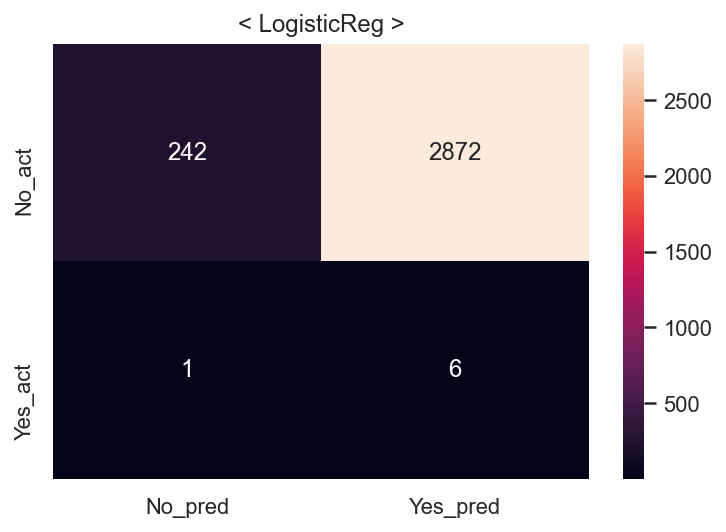

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


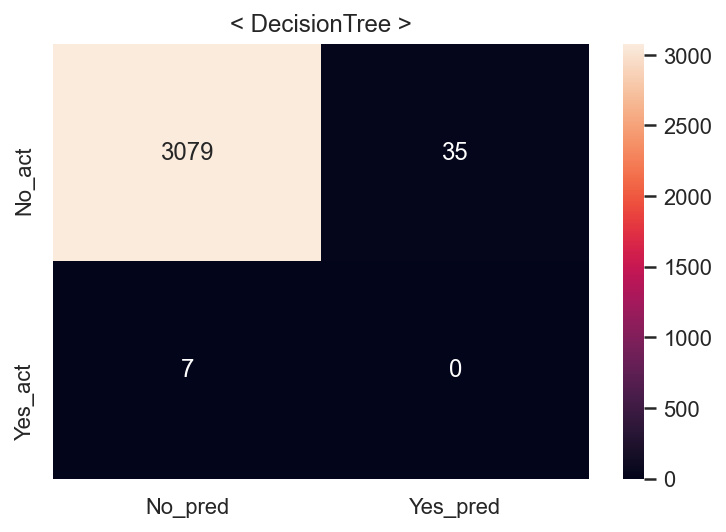

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


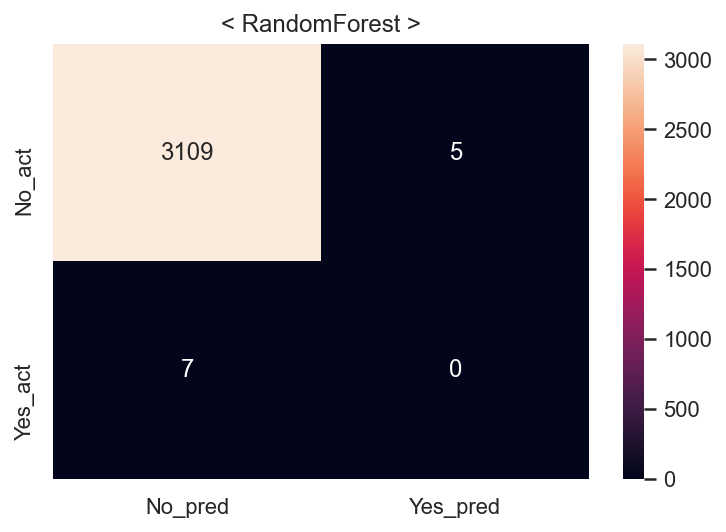

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


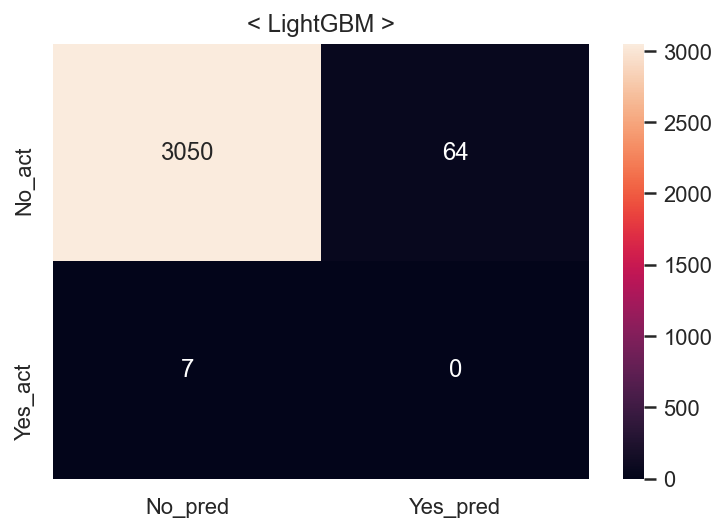

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


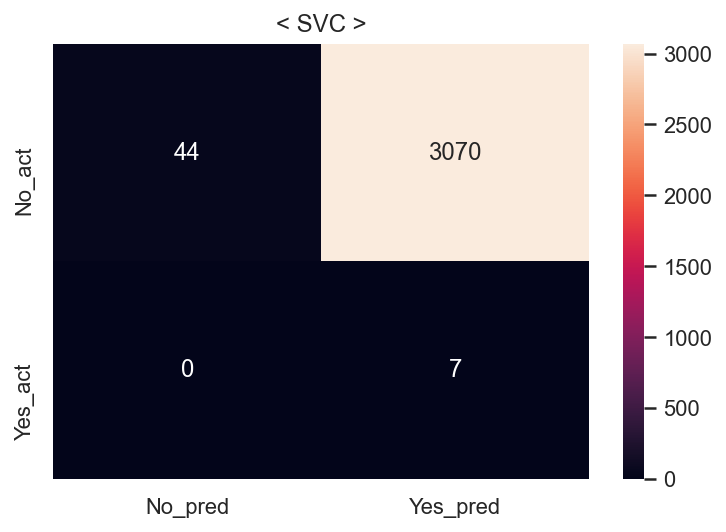

Fit time : 9.13 min


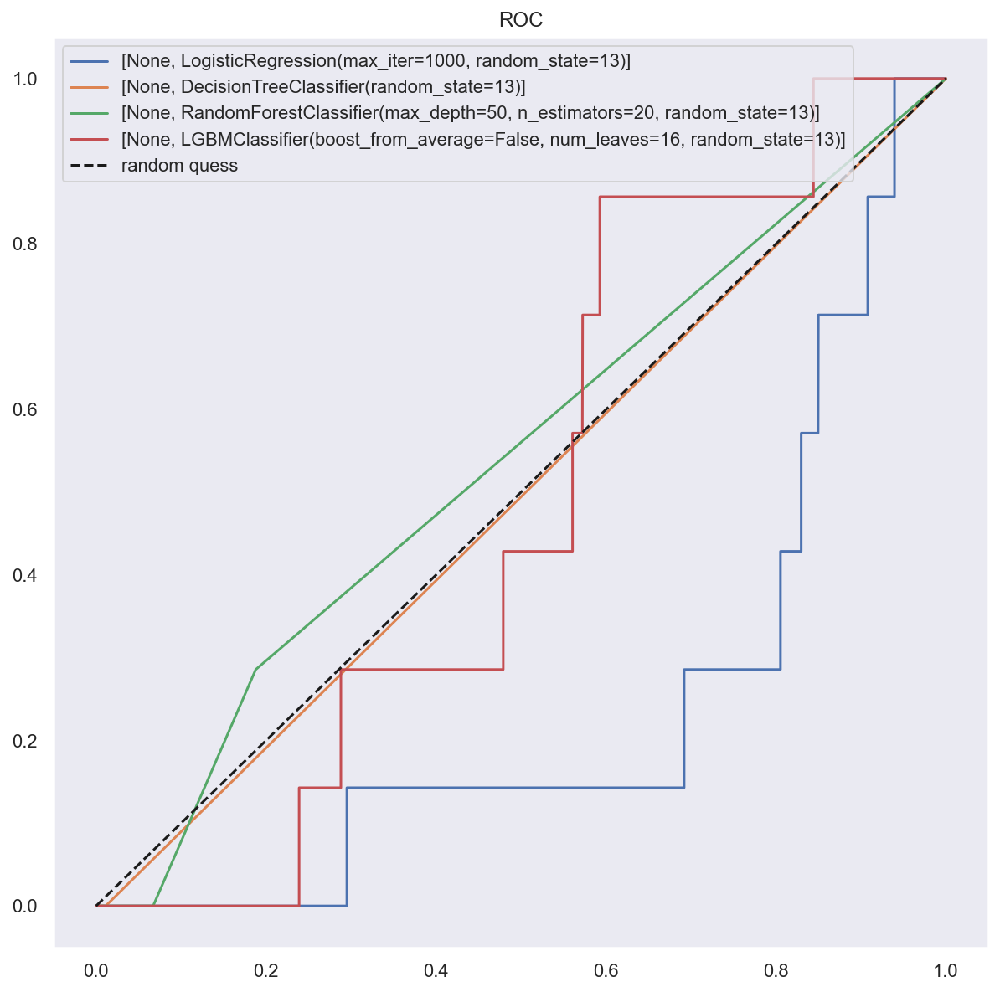

In [13]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_index)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list, result_df = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [83]:
result_df["null_del"] = [0]  * len(result_df)
result_df["encoded"] = [0]  * len(result_df)
result_df["scaler"] = ["None"]  * len(result_df)
result_df["sampler"] = ["SMOTE"]  * len(result_df)
result_df = result_df[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,None,SMOTE,LogisticReg,0.536317,0.518843,1.000000,0.683208,0.536317,0.079462,0.002085,0.857143,0.004159,0.467428
1,0,0,None,SMOTE,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.986543,0.000000,0.000000,0.000000,0.494380
2,0,0,None,SMOTE,RandomForest,0.999844,1.000000,0.999688,0.999844,0.999844,0.996155,0.000000,0.000000,0.000000,0.499197
3,0,0,None,SMOTE,LightGBM,0.990394,0.982703,0.998360,0.990470,0.990394,0.977251,0.000000,0.000000,0.000000,0.489724
4,0,0,None,SMOTE,SVC,0.505037,0.502531,1.000000,0.668913,0.505037,0.016341,0.002275,1.000000,0.004540,0.507065


## 둘째

### (1) NULL 값 유지,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 없음 

In [14]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_index)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.4s
====Done Evaluation====
====Done Evaluation====


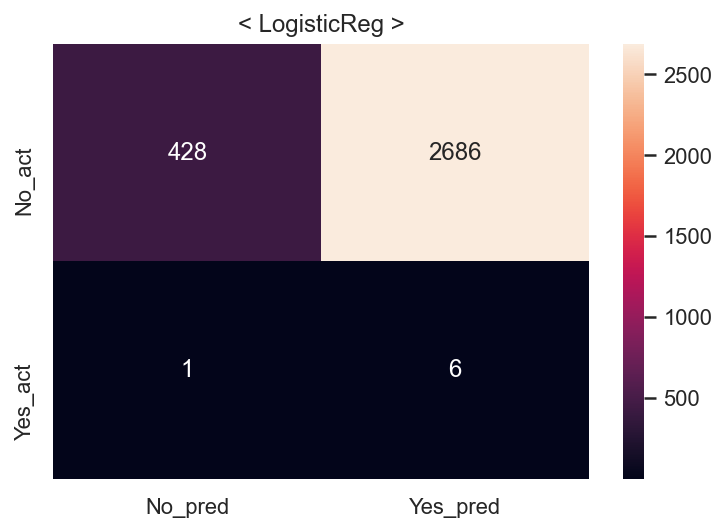

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


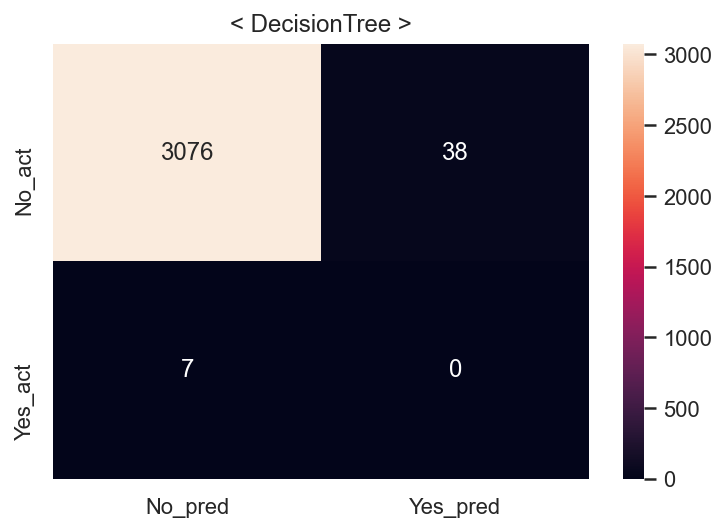

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


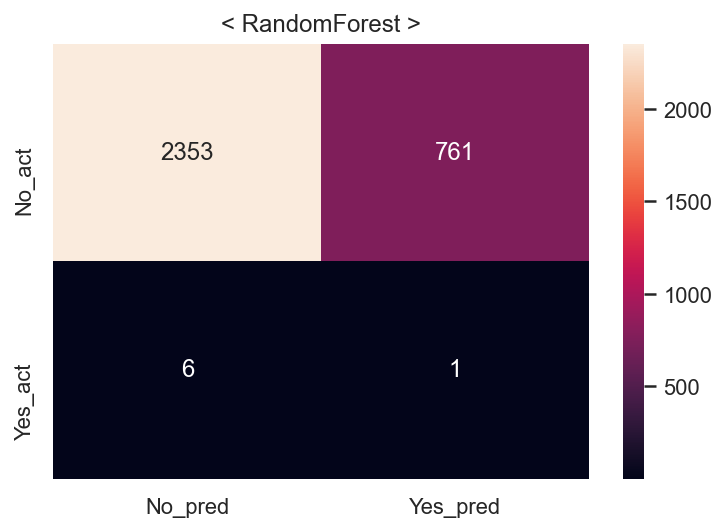

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


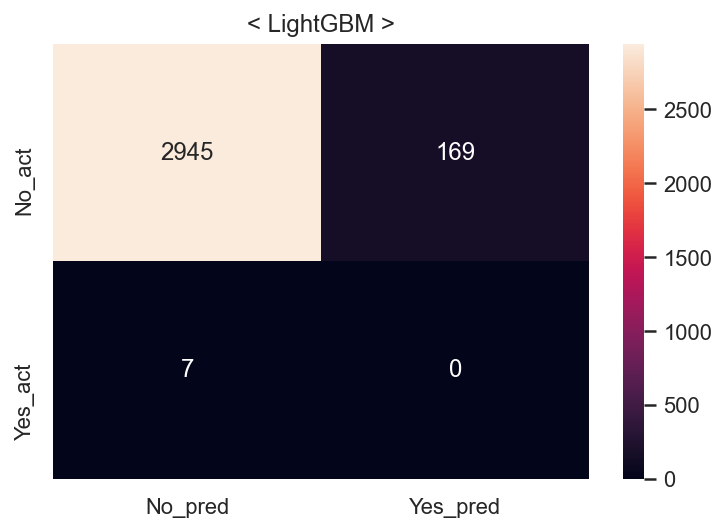

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


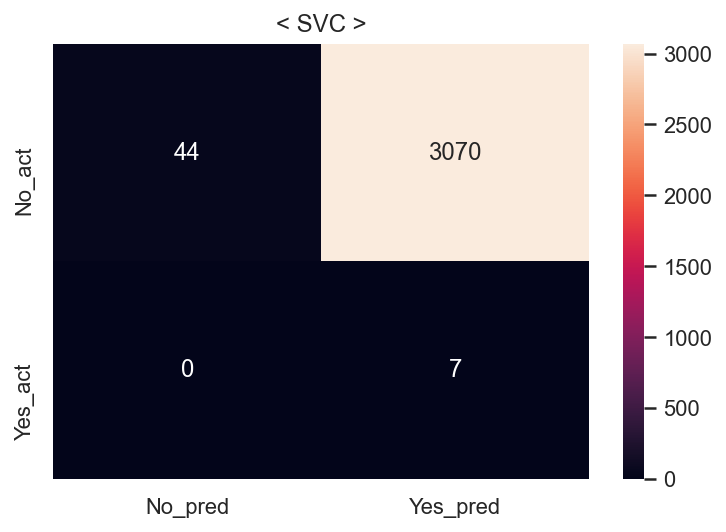

Fit time : 20.68 min


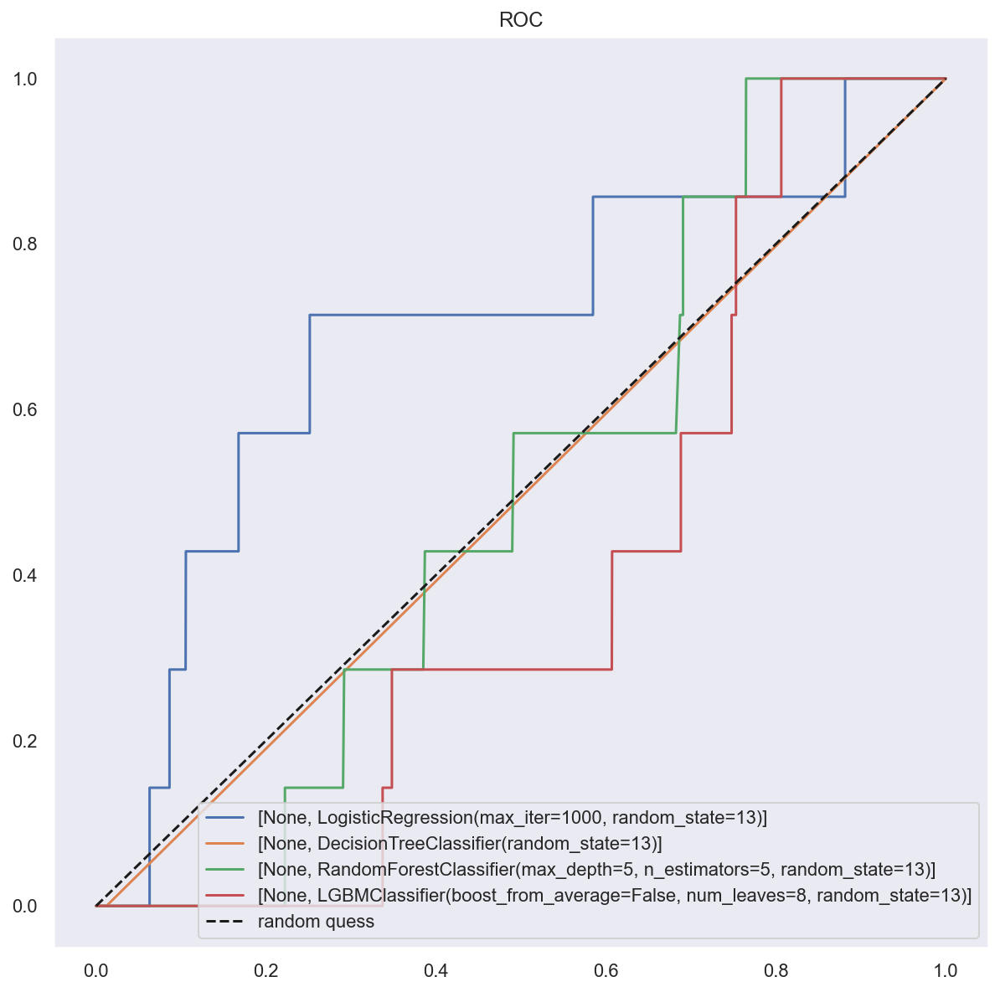

In [15]:
# evaluation
cv_list2, result_df2 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [84]:
result_df2["null_del"] = [0]  * len(result_df2)
result_df2["encoded"] = [0]  * len(result_df2)
result_df2["scaler"] = ["None"]  * len(result_df2)
result_df2["sampler"] = ["ADASYN"]  * len(result_df2)
result_df2 = result_df2[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df2

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,None,ADASYN,LogisticReg,0.535438,0.519623,0.945155,0.670578,0.535214,0.139058,0.002229,0.857143,0.004446,0.497293
1,0,0,None,ADASYN,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.985582,0.000000,0.000000,0.000000,0.493899
2,0,0,None,ADASYN,RandomForest,0.871439,0.806593,0.977376,0.883810,0.871381,0.754245,0.001312,0.142857,0.002601,0.449238
3,0,0,None,ADASYN,LightGBM,0.973421,0.953584,0.995319,0.974005,0.973409,0.943608,0.000000,0.000000,0.000000,0.472864
4,0,0,None,ADASYN,SVC,0.505113,0.502706,1.000000,0.669068,0.504842,0.016341,0.002275,1.000000,0.004540,0.507065


## 셋째
### (1) NULL 값 유지,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


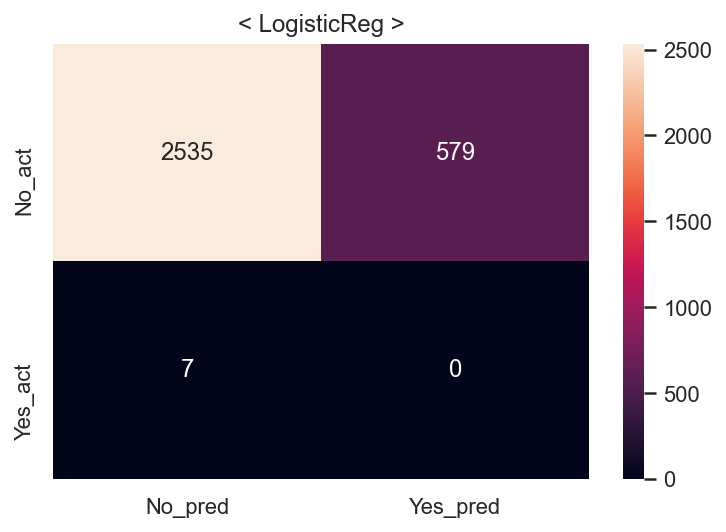

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


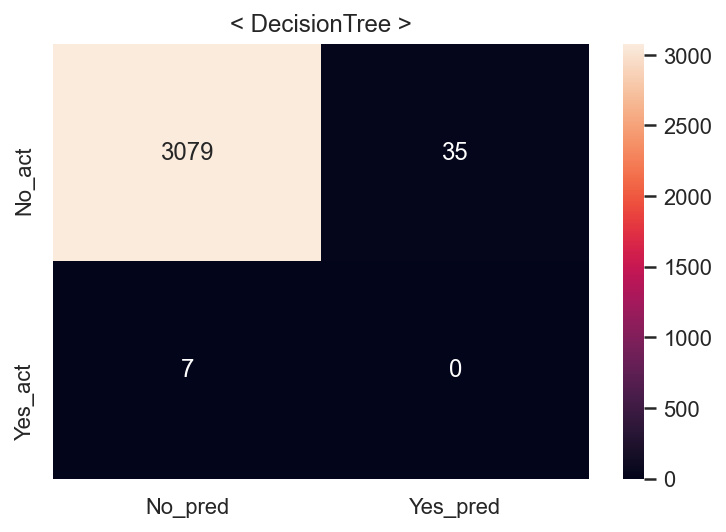

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


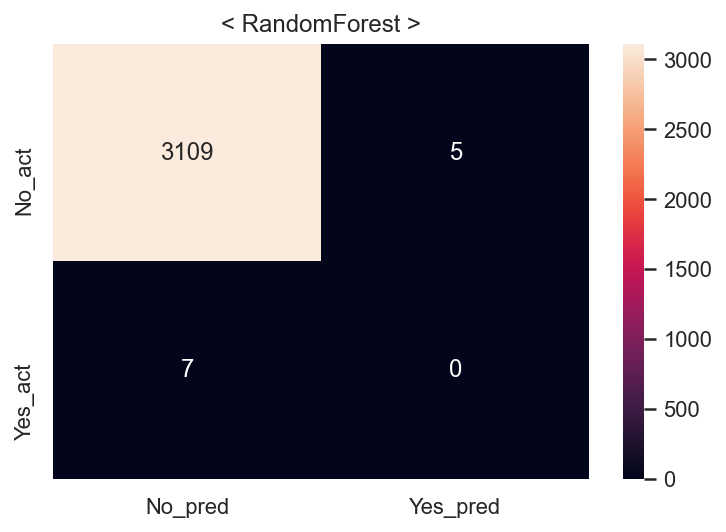

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


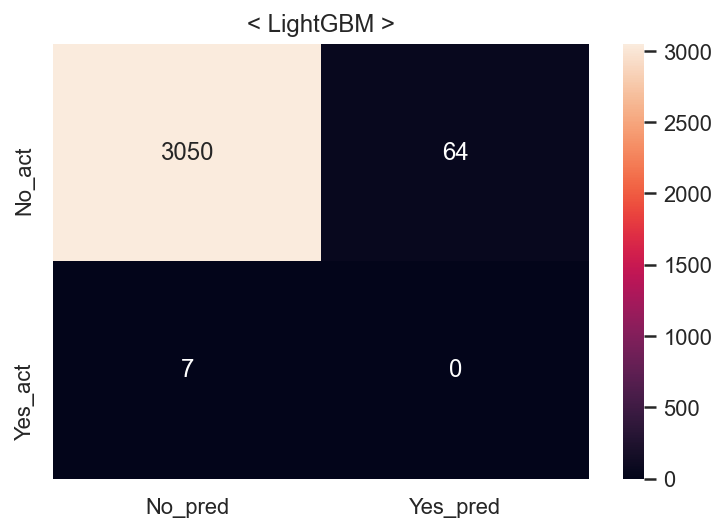

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


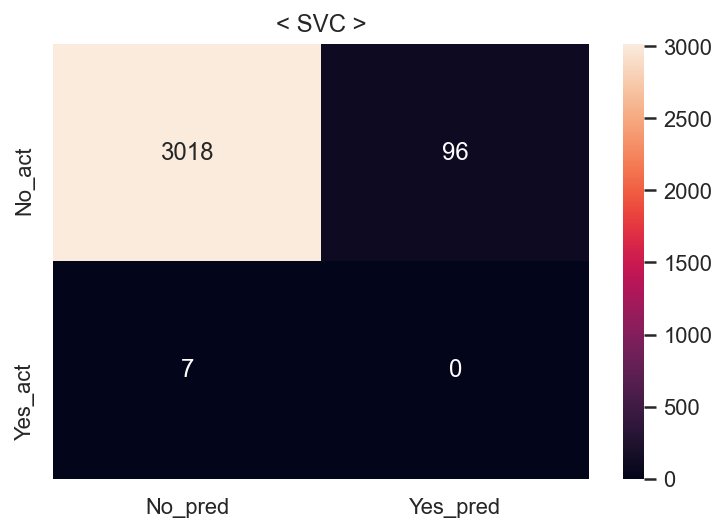

Fit time : 0.46 min


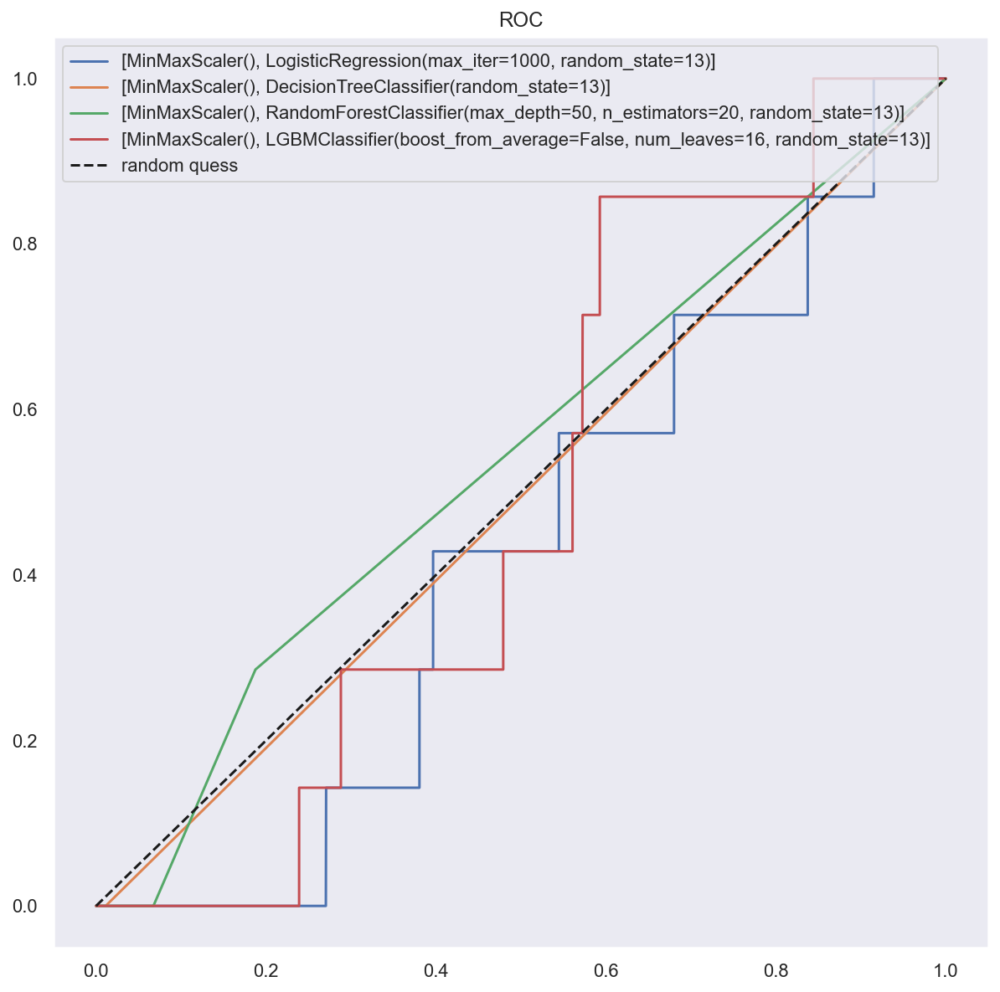

In [18]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_index)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list3, result_df3 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [85]:
result_df3["null_del"] = [0]  * len(result_df3)
result_df3["encoded"] = [0]  * len(result_df3)
result_df3["scaler"] = ["MM"]  * len(result_df3)
result_df3["sampler"] = ["SMOTE"]  * len(result_df3)
result_df3 = result_df3[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df3

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,MM,SMOTE,LogisticReg,0.833216,0.814384,0.863168,0.838066,0.833216,0.812240,0.0,0.0,0.0,0.407033
1,0,0,MM,SMOTE,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.986543,0.0,0.0,0.0,0.494380
2,0,0,MM,SMOTE,RandomForest,0.999844,1.000000,0.999688,0.999844,0.999844,0.996155,0.0,0.0,0.0,0.499197
3,0,0,MM,SMOTE,LightGBM,0.990394,0.982703,0.998360,0.990470,0.990394,0.977251,0.0,0.0,0.0,0.489724
4,0,0,MM,SMOTE,SVC,0.982271,0.966813,0.998828,0.982560,0.982271,0.966998,0.0,0.0,0.0,0.484586


## 넷째
### (1) NULL 값 유지,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


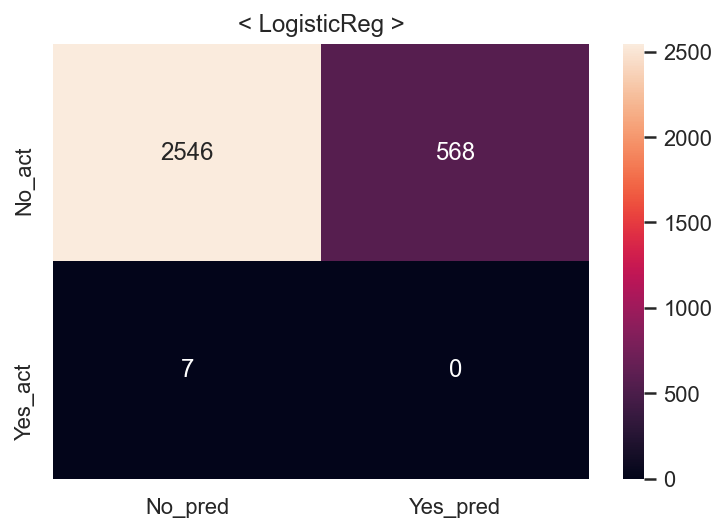

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


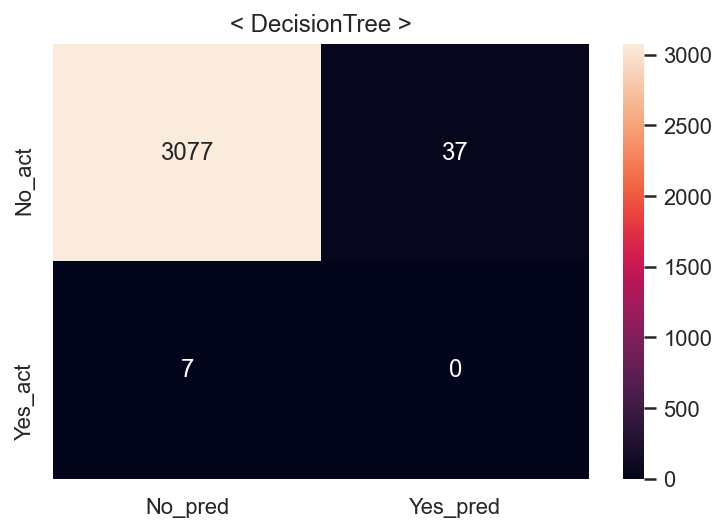

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


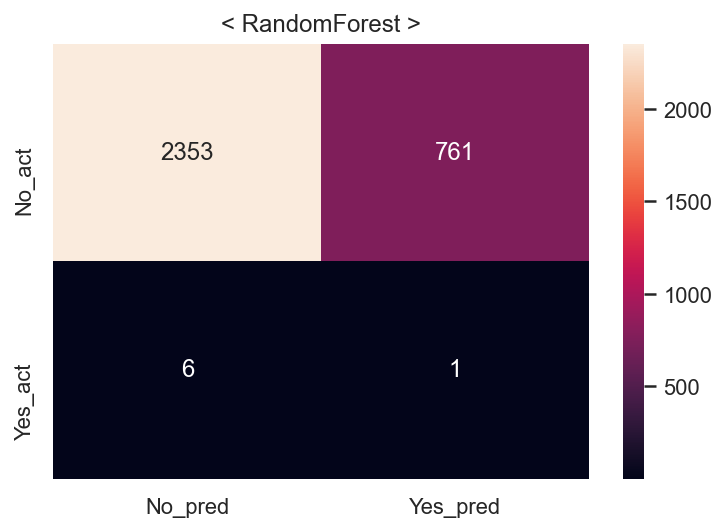

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


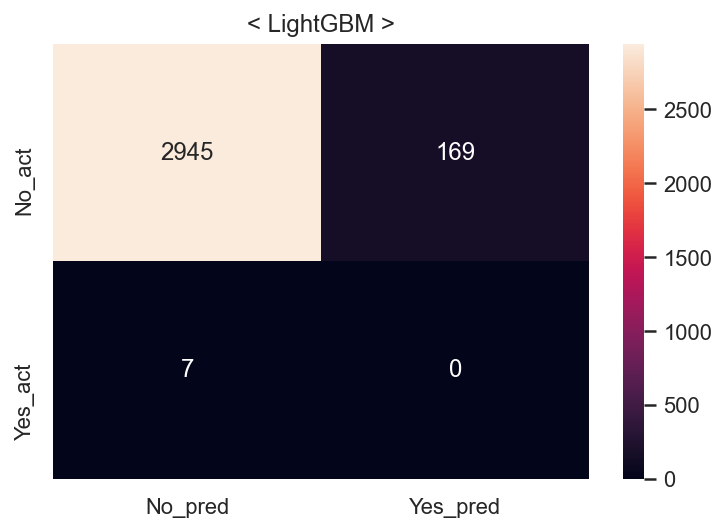

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


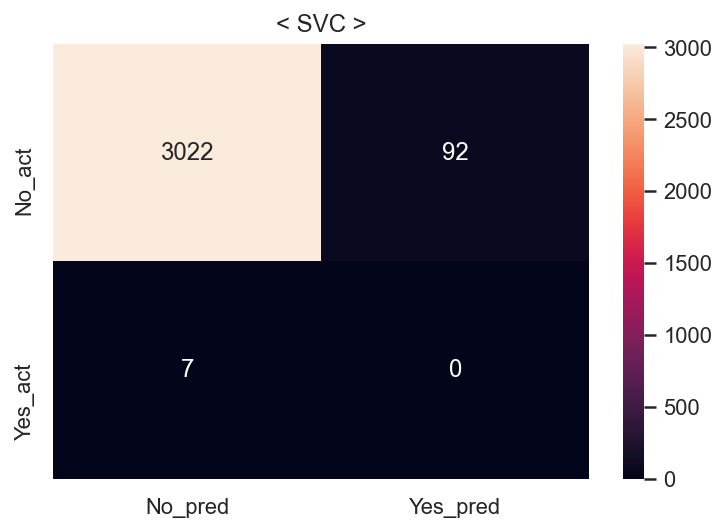

Fit time : 0.62 min


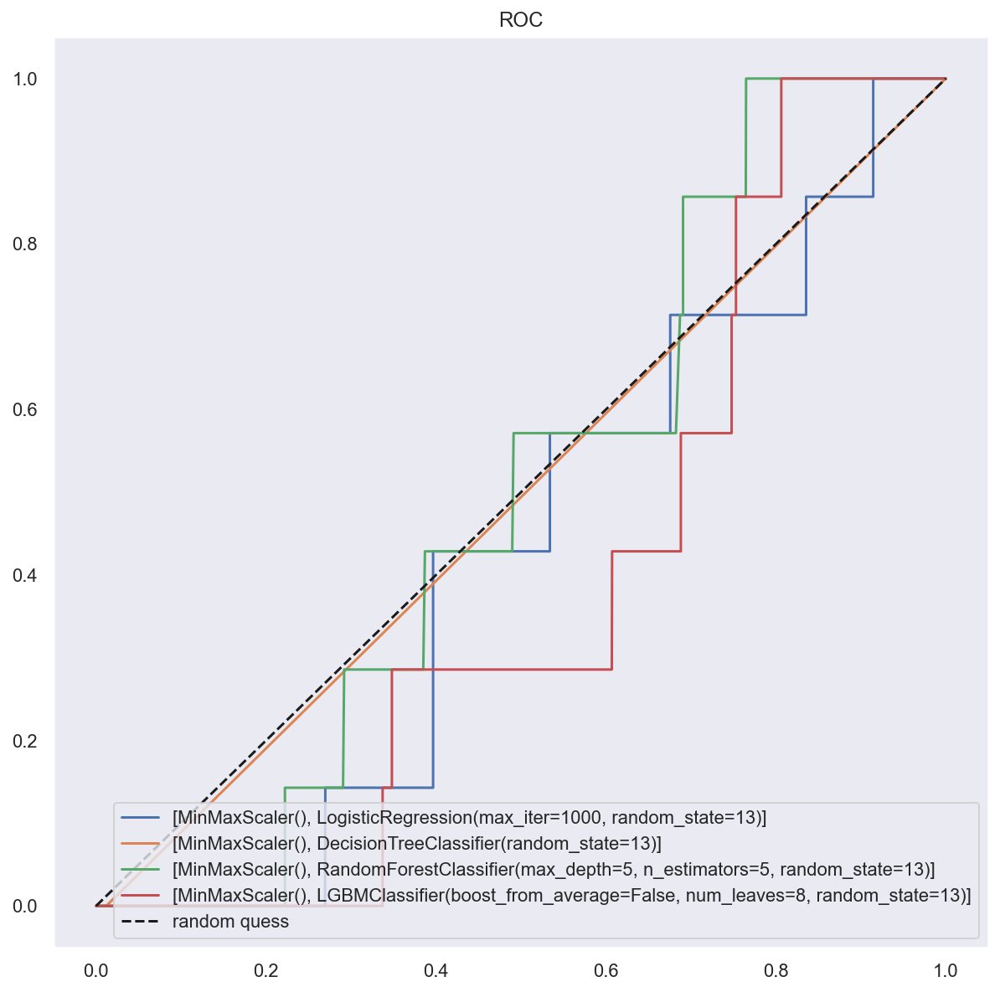

In [19]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_index)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list4, result_df4 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [86]:
result_df4["null_del"] = [0]  * len(result_df4)
result_df4["encoded"] = [0]  * len(result_df4)
result_df4["scaler"] = ["MM"]  * len(result_df4)
result_df4["sampler"] = ["ADASYN"]  * len(result_df4)
result_df4 = result_df4[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df4

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,MM,ADASYN,LogisticReg,0.836781,0.817127,0.867998,0.841795,0.836764,0.815764,0.000000,0.000000,0.000000,0.408799
1,0,0,MM,ADASYN,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.985902,0.000000,0.000000,0.000000,0.494059
2,0,0,MM,ADASYN,RandomForest,0.871439,0.806593,0.977376,0.883810,0.871381,0.754245,0.001312,0.142857,0.002601,0.449238
3,0,0,MM,ADASYN,LightGBM,0.973421,0.953584,0.995319,0.974005,0.973409,0.943608,0.000000,0.000000,0.000000,0.472864
4,0,0,MM,ADASYN,SVC,0.982554,0.967430,0.998752,0.982841,0.982545,0.968279,0.000000,0.000000,0.000000,0.485228


## 다섯번째
### (1) NULL 값 유지,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


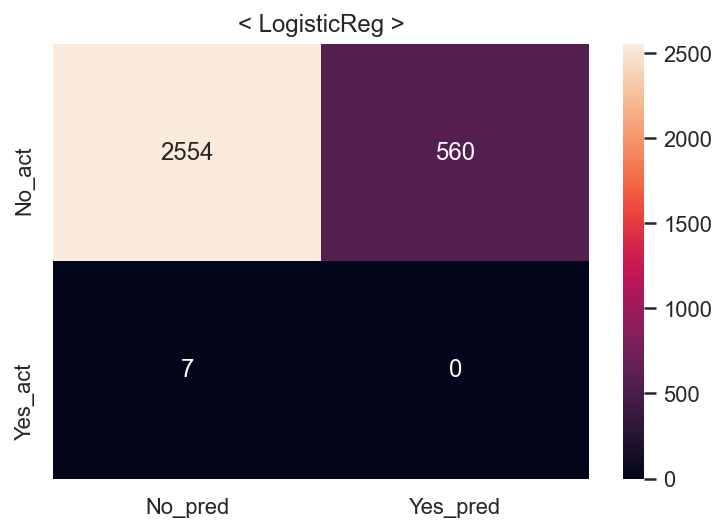

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


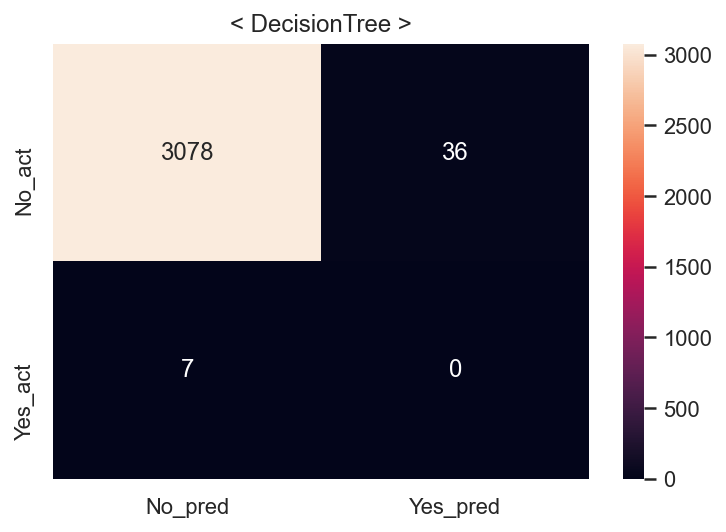

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


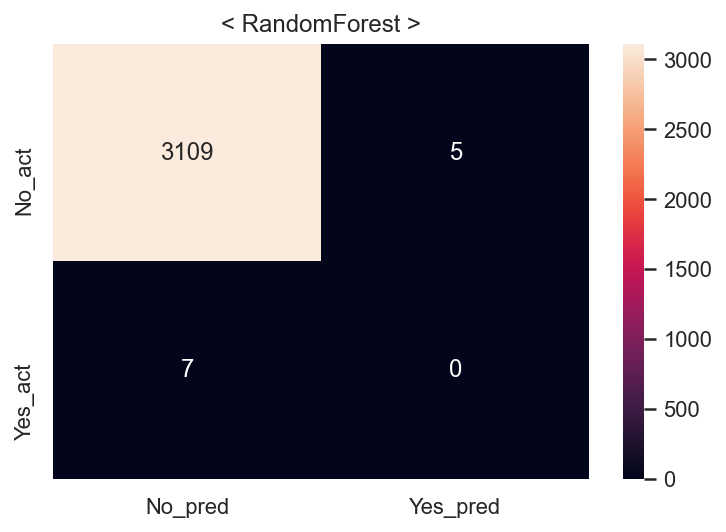

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


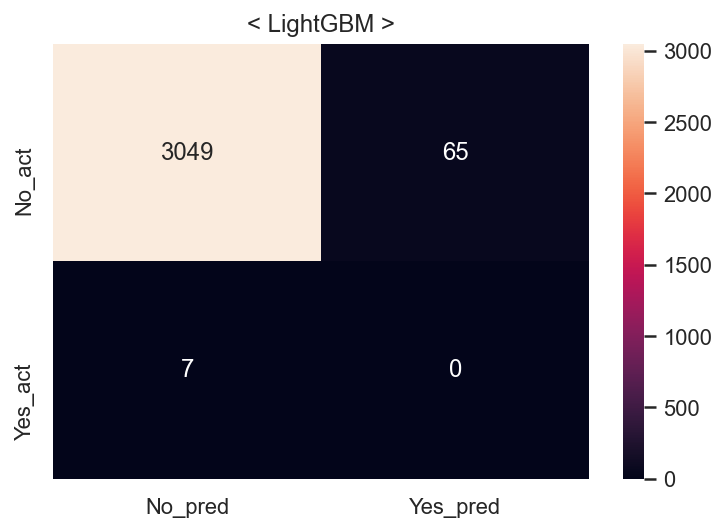

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


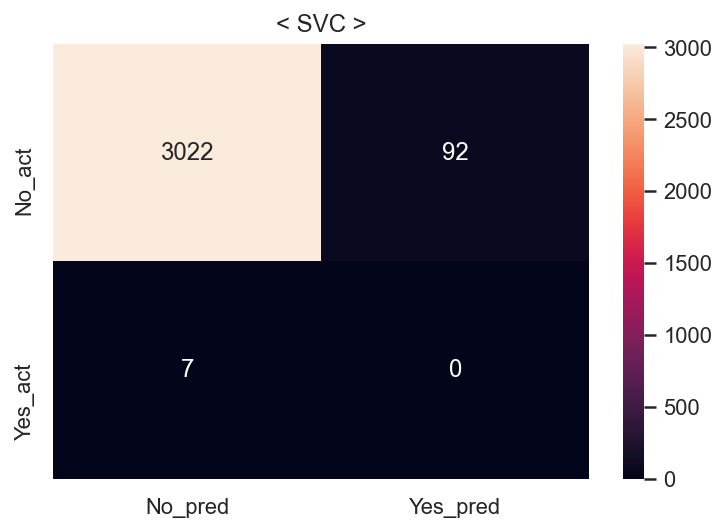

Fit time : 0.47 min


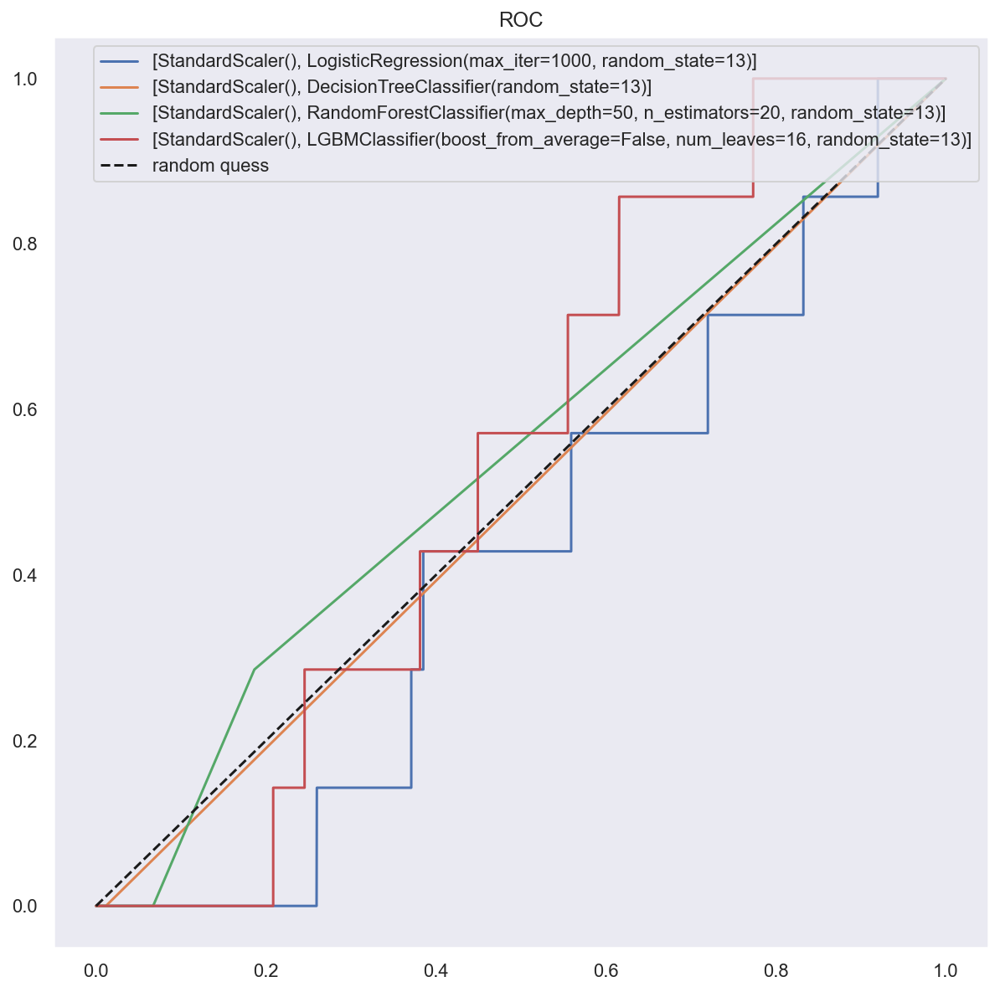

In [20]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_index)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list5, result_df5 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [87]:
result_df5["null_del"] = [0]  * len(result_df5)
result_df5["encoded"] = [0]  * len(result_df5)
result_df5["scaler"] = ["SD"]  * len(result_df5)
result_df5["sampler"] = ["SMOTE"]  * len(result_df5)
result_df5 = result_df5[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df5

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,SD,SMOTE,LogisticReg,0.836028,0.817177,0.865745,0.840760,0.836028,0.818327,0.0,0.0,0.0,0.410083
1,0,0,SD,SMOTE,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.986222,0.0,0.0,0.0,0.494220
2,0,0,SD,SMOTE,RandomForest,0.999844,1.000000,0.999688,0.999844,0.999844,0.996155,0.0,0.0,0.0,0.499197
3,0,0,SD,SMOTE,LightGBM,0.990901,0.983760,0.998282,0.990968,0.990901,0.976930,0.0,0.0,0.0,0.489563
4,0,0,SD,SMOTE,SVC,0.989613,0.980383,0.999219,0.989711,0.989613,0.968279,0.0,0.0,0.0,0.485228


## 여섯번째
### (1) NULL 값 유지,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


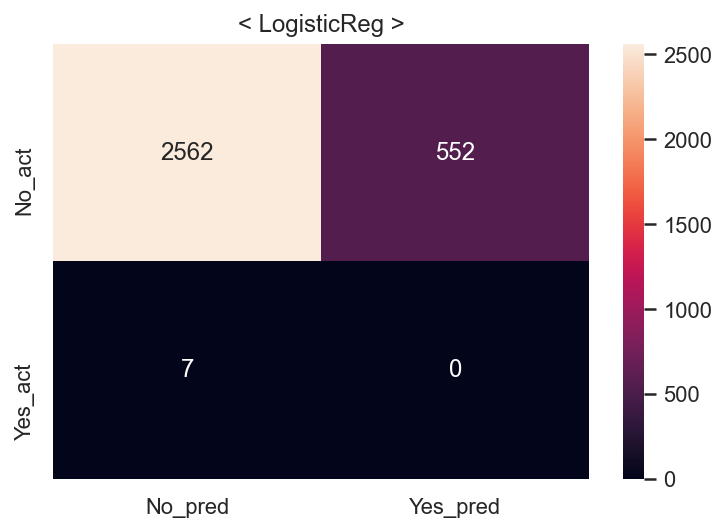

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


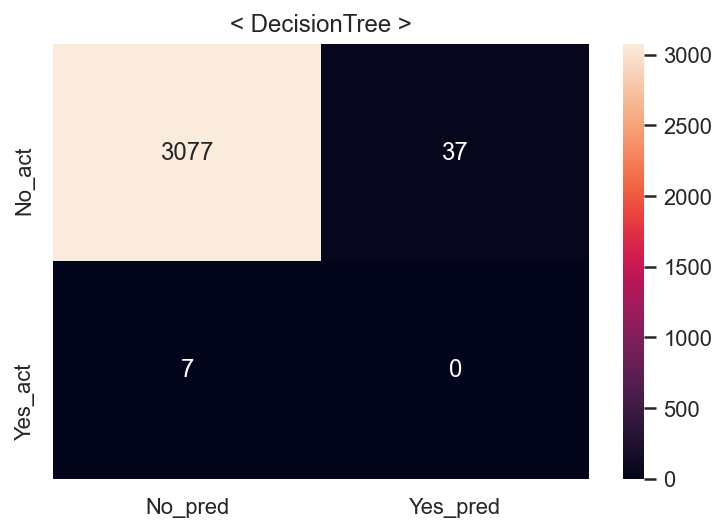

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


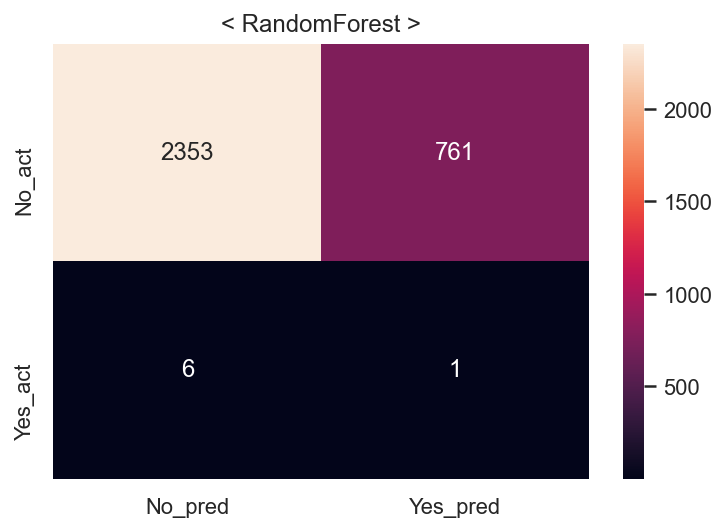

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


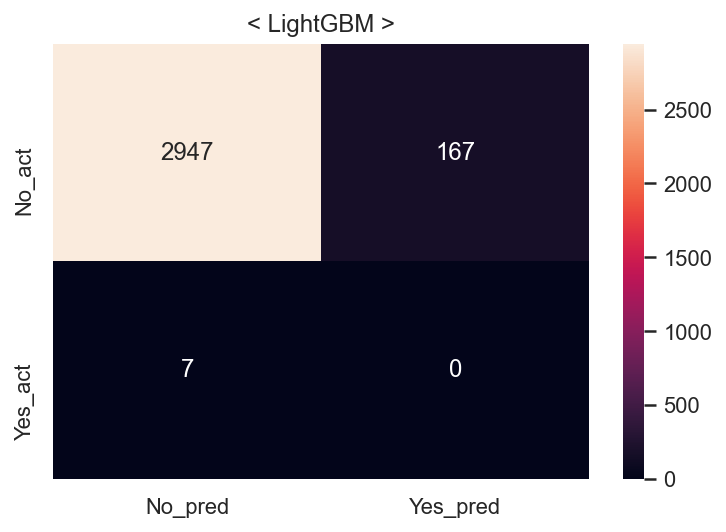

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


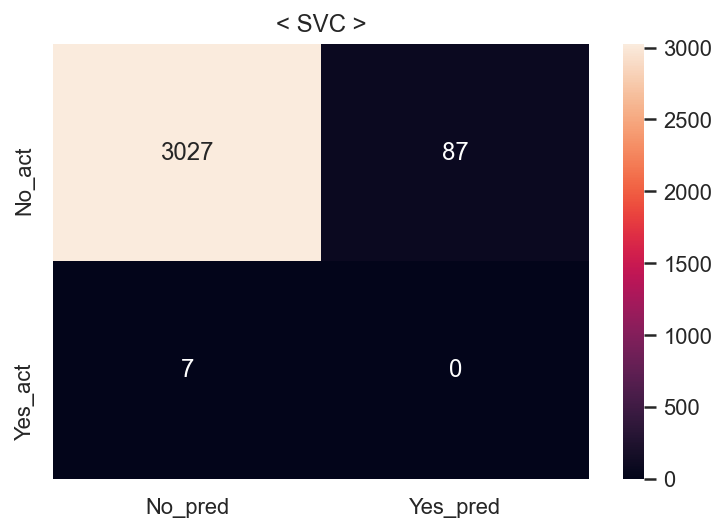

Fit time : 0.45 min


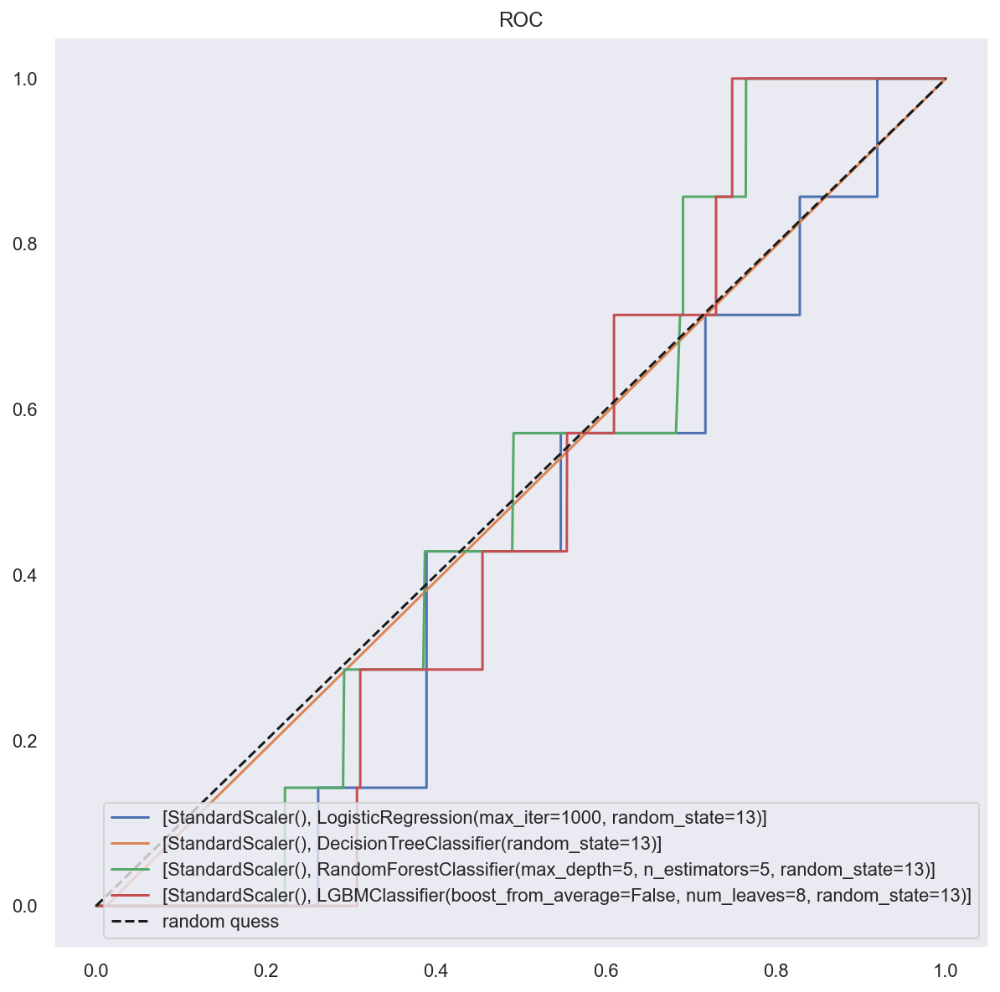

In [21]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_index)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list6, result_df6 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [88]:
result_df6["null_del"] = [0]  * len(result_df6)
result_df6["encoded"] = [0]  * len(result_df6)
result_df6["scaler"] = ["SD"]  * len(result_df6)
result_df6["sampler"] = ["ADASYN"]  * len(result_df6)
result_df6 = result_df6[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df6

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,SD,ADASYN,LogisticReg,0.842830,0.820722,0.877516,0.848170,0.842811,0.820891,0.000000,0.000000,0.000000,0.411368
1,0,0,SD,ADASYN,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.985902,0.000000,0.000000,0.000000,0.494059
2,0,0,SD,ADASYN,RandomForest,0.871439,0.806593,0.977376,0.883810,0.871381,0.754245,0.001312,0.142857,0.002601,0.449238
3,0,0,SD,ADASYN,LightGBM,0.972133,0.952587,0.993759,0.972738,0.972122,0.944249,0.000000,0.000000,0.000000,0.473186
4,0,0,SD,ADASYN,SVC,0.989696,0.980481,0.999298,0.989800,0.989691,0.969881,0.000000,0.000000,0.000000,0.486031


## 일곱번째
### (1) NULL 값 유지,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.8s
====Done Evaluation====
====Done Evaluation====


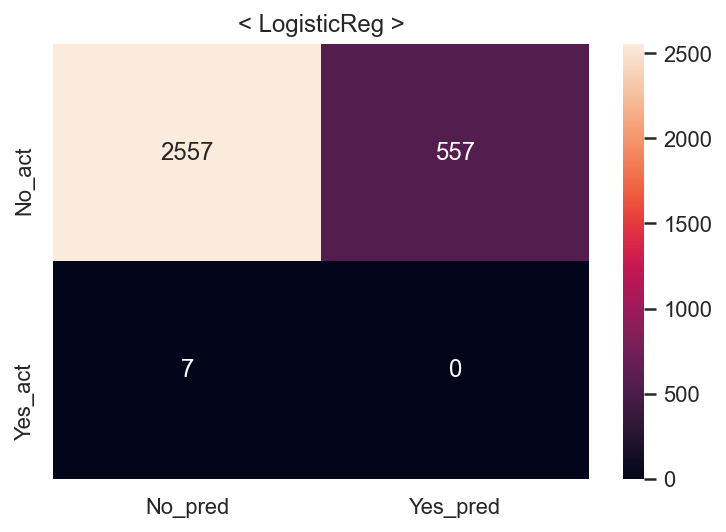

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


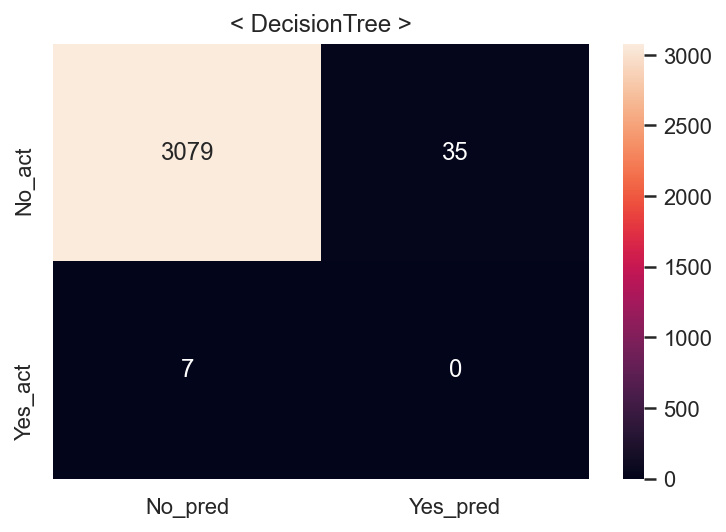

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


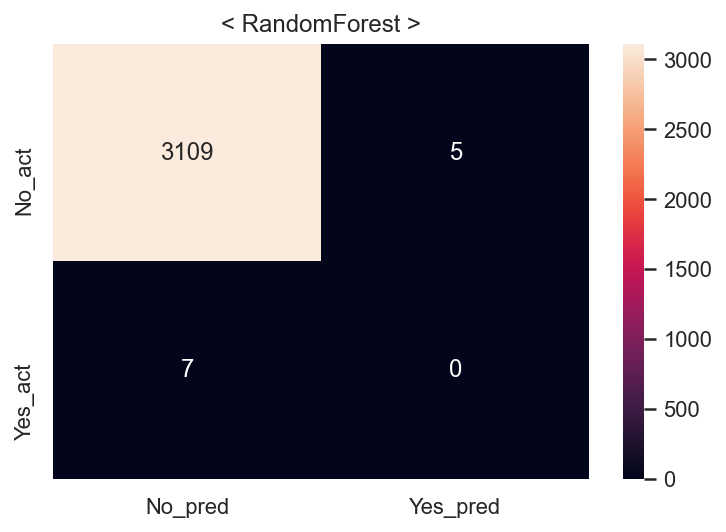

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


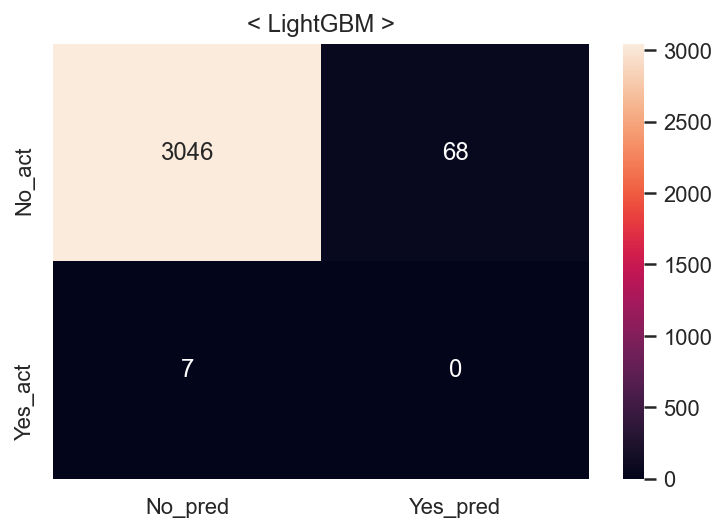

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


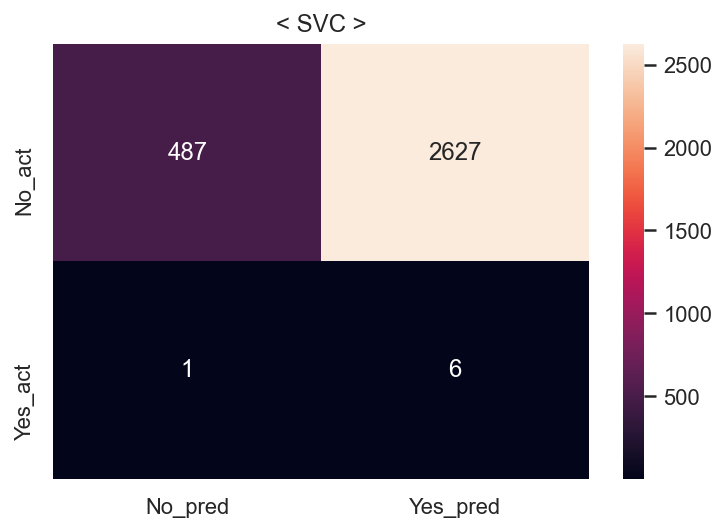

Fit time : 1.57 min


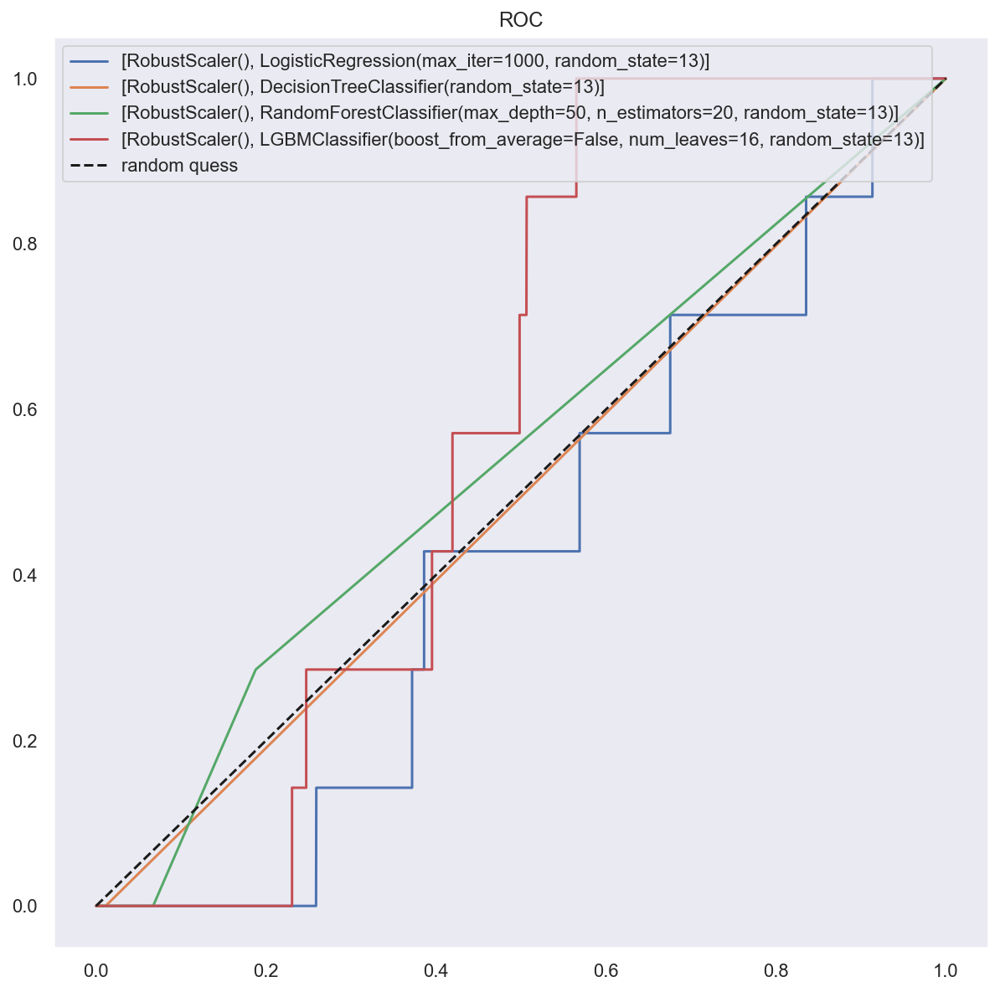

In [24]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_index)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list7, result_df7 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [90]:
result_df7["null_del"] = [0]  * len(result_df7)
result_df7["encoded"] = [0]  * len(result_df7)
result_df7["scaler"] = ["RB"]  * len(result_df7)
result_df7["sampler"] = ["SMOTE"]  * len(result_df7)
result_df7 = result_df7[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df7

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,RB,SMOTE,LogisticReg,0.835754,0.817082,0.865198,0.840452,0.835754,0.819289,0.000000,0.000000,0.000000,0.410565
1,0,0,RB,SMOTE,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.986543,0.000000,0.000000,0.000000,0.494380
2,0,0,RB,SMOTE,RandomForest,0.999844,1.000000,0.999688,0.999844,0.999844,0.996155,0.000000,0.000000,0.000000,0.499197
3,0,0,RB,SMOTE,LightGBM,0.990237,0.982401,0.998360,0.990316,0.990237,0.975969,0.000000,0.000000,0.000000,0.489082
4,0,0,RB,SMOTE,SVC,0.576500,0.541422,0.999922,0.702477,0.576500,0.157962,0.002279,0.857143,0.004545,0.506767


## 여덟번째
### (1) NULL 값 유지,  (2) 데이터 분리, 3) ADASYN, (4) 스케일링 Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.1s
====Done Evaluation====
====Done Evaluation====


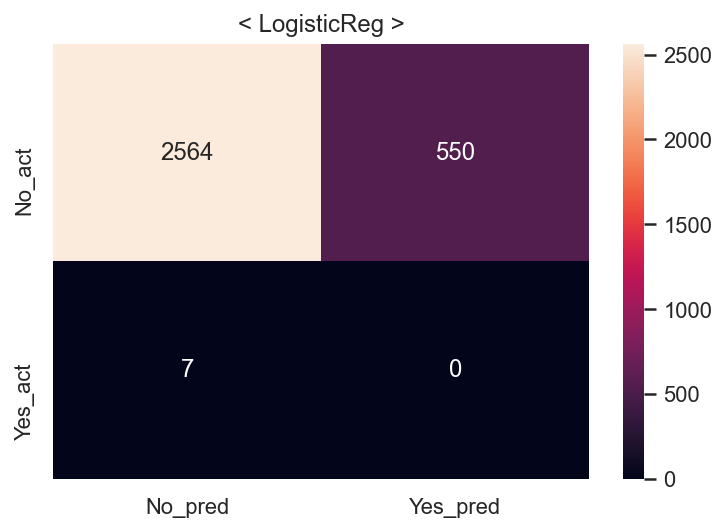

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


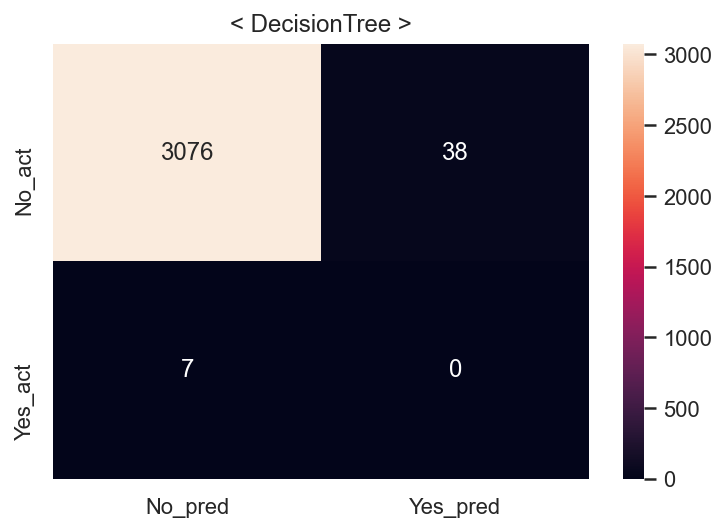

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


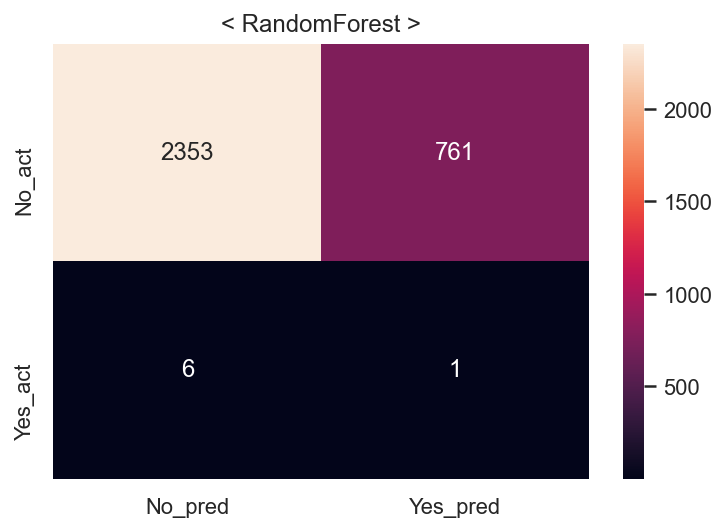

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


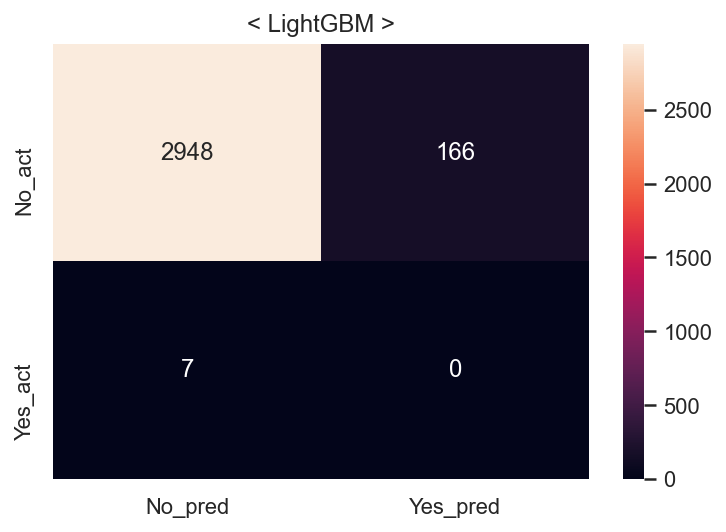

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


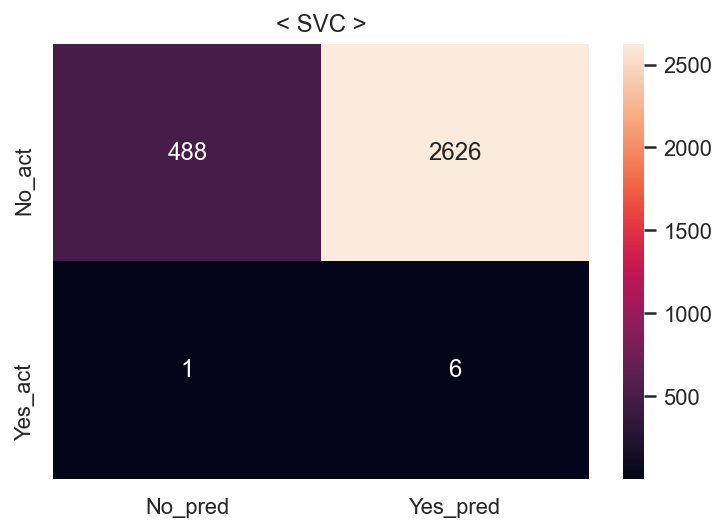

Fit time : 1.58 min


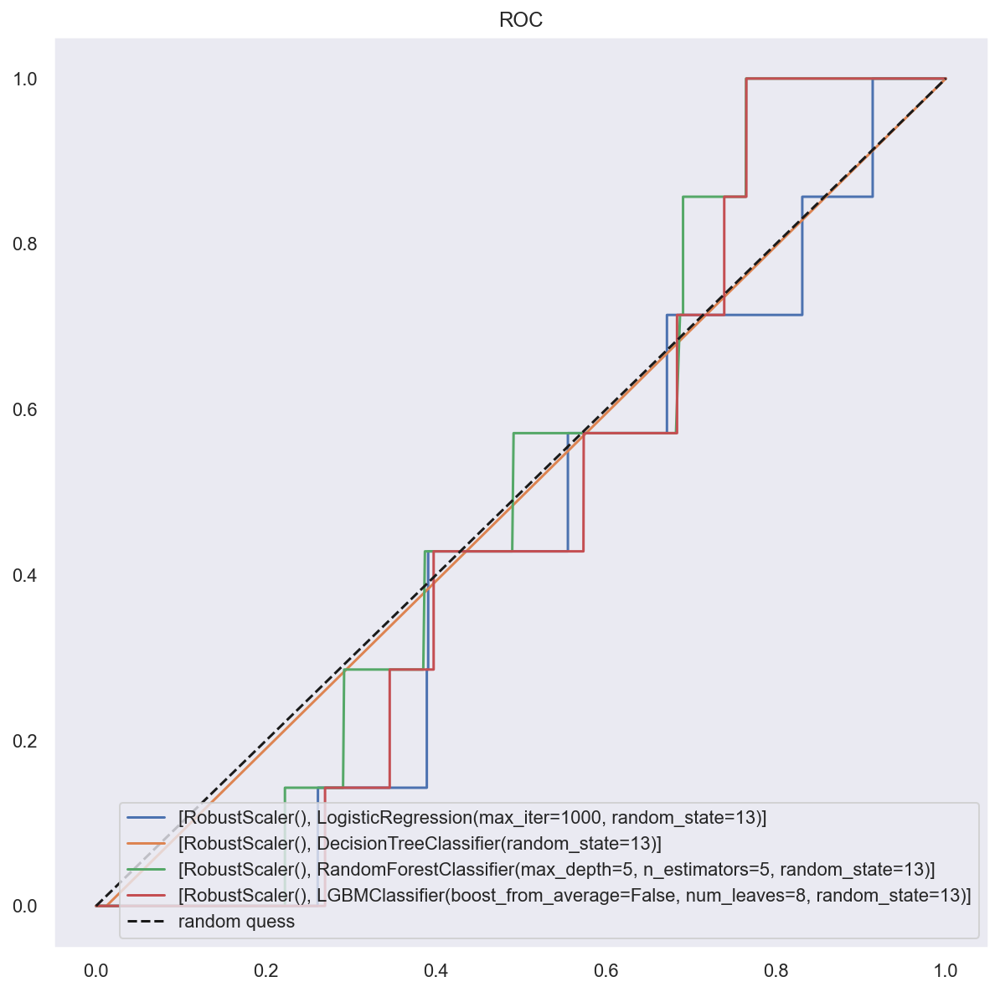

In [31]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_index)result_df4["null_del"] = [0]  * len(result_df4)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list8, result_df8 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [91]:
result_df8["null_del"] = [0]  * len(result_df8)
result_df8["encoded"] = [0]  * len(result_df8)
result_df8["scaler"] = ["RB"]  * len(result_df8)
result_df8["sampler"] = ["ADASYN"]  * len(result_df8)
result_df8 = result_df8[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df8

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,RB,ADASYN,LogisticReg,0.842713,0.820590,0.877438,0.848062,0.842694,0.821532,0.000000,0.000000,0.000000,0.411689
1,0,0,RB,ADASYN,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.985582,0.000000,0.000000,0.000000,0.493899
2,0,0,RB,ADASYN,RandomForest,0.871439,0.806593,0.977376,0.883810,0.871381,0.754245,0.001312,0.142857,0.002601,0.449238
3,0,0,RB,ADASYN,LightGBM,0.973460,0.953791,0.995163,0.974038,0.973448,0.944569,0.000000,0.000000,0.000000,0.473346
4,0,0,RB,ADASYN,SVC,0.576692,0.541670,0.999922,0.702686,0.576461,0.158283,0.002280,0.857143,0.004547,0.506927


## 아홉번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 없음 

- null값이 들어있는 컬럼
    - accident_hour : -1 - 36개
    - repair_cost : 0 - 6006개
    - insure_cost : 0 - 10424개
    - accident_location : 5(확인불가) - 288개
    - acc_type1 : 0 - 11384개
    - insurnace_site_aid_YN : 0 - 11325개
    - police_site_aid_YN :  0 - 11328개
    - total_prsn_cnt :  -1 - 11358개

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.7s
====Done Evaluation====
====Done Evaluation====


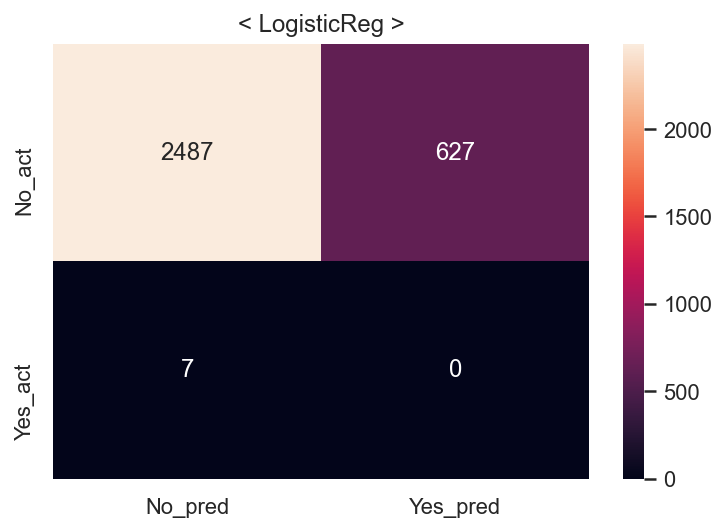

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


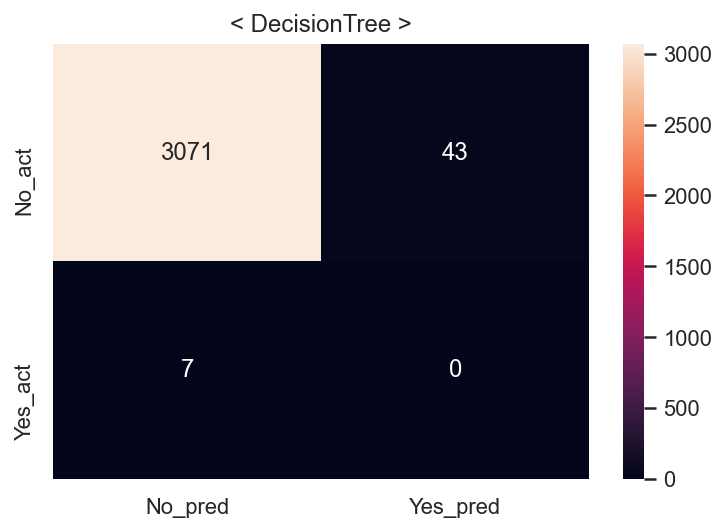

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


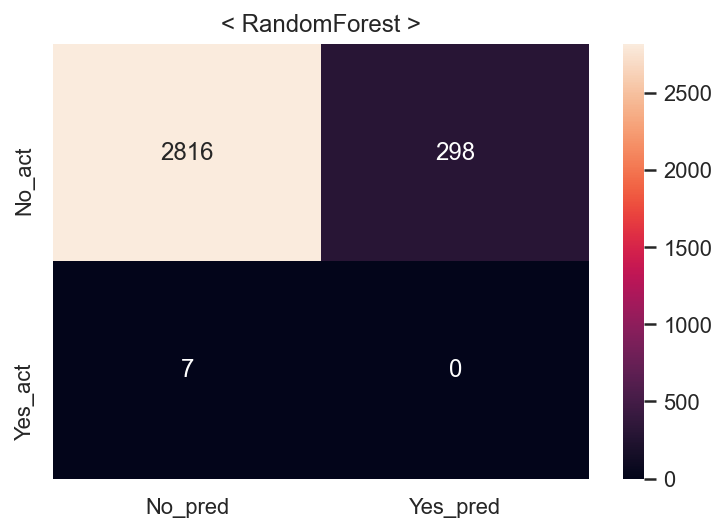

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


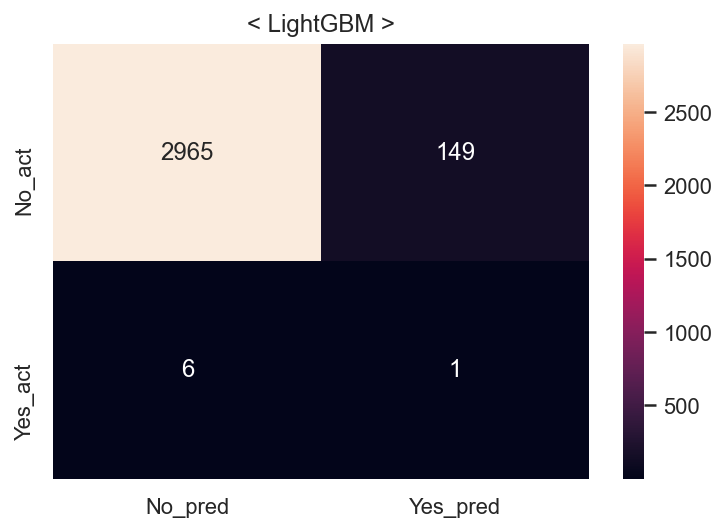

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


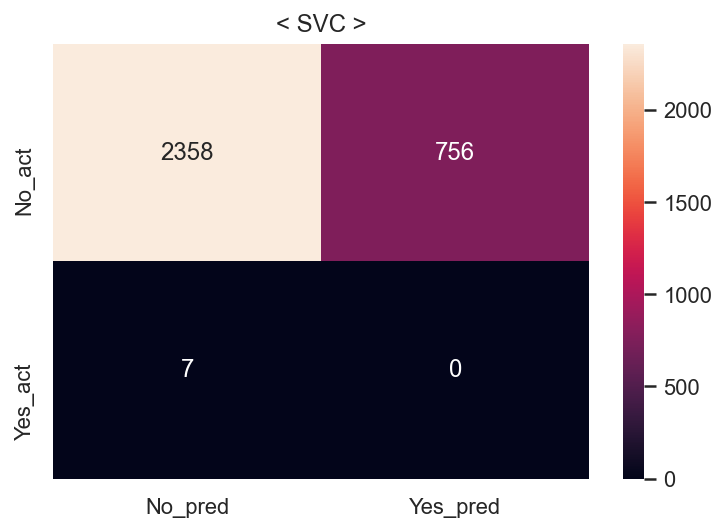

Fit time : 1.21 min


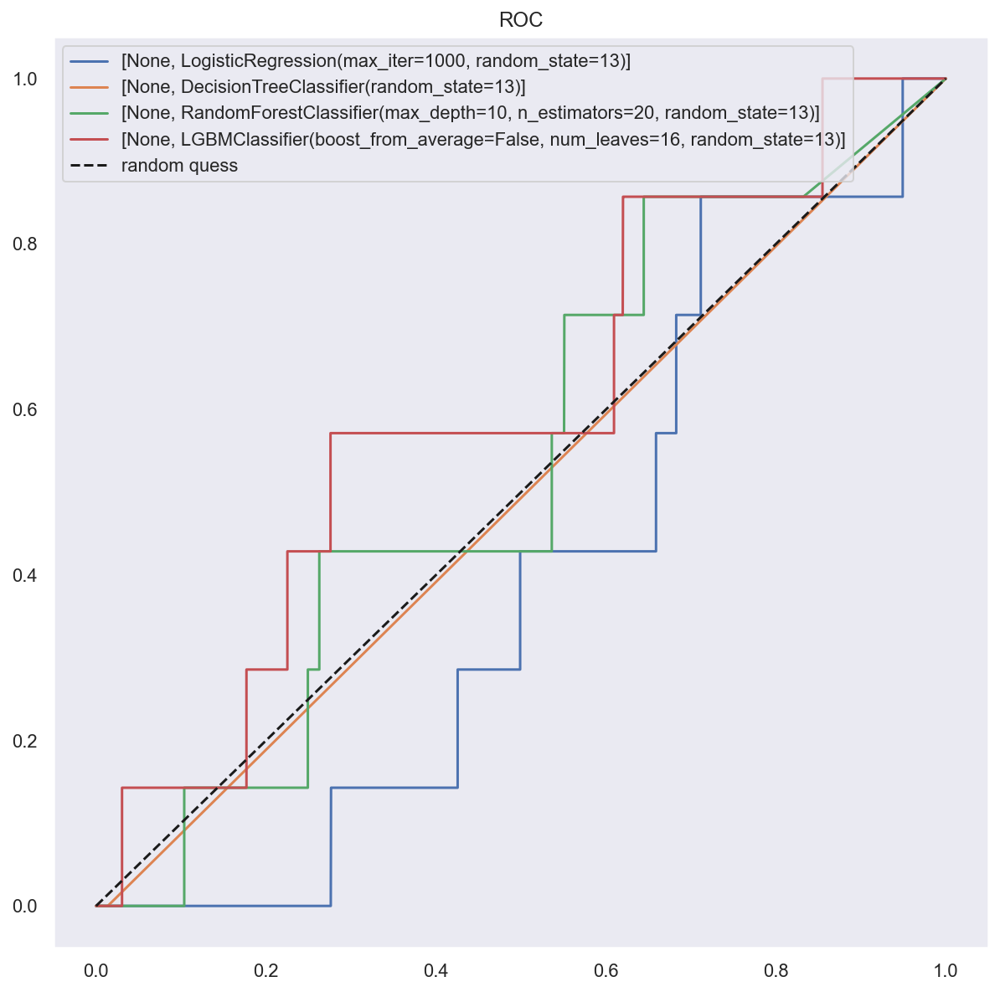

In [32]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list9, result_df9 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [92]:
result_df9["null_del"] = [1]  * len(result_df9)
result_df9["encoded"] = [0]  * len(result_df9)
result_df9["scaler"] = ["None"]  * len(result_df9)
result_df9["sampler"] = ["SMOTE"]  * len(result_df9)
result_df9 = result_df8[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df9

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,RB,ADASYN,LogisticReg,0.842713,0.820590,0.877438,0.848062,0.842694,0.821532,0.000000,0.000000,0.000000,0.411689
1,0,0,RB,ADASYN,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.985582,0.000000,0.000000,0.000000,0.493899
2,0,0,RB,ADASYN,RandomForest,0.871439,0.806593,0.977376,0.883810,0.871381,0.754245,0.001312,0.142857,0.002601,0.449238
3,0,0,RB,ADASYN,LightGBM,0.973460,0.953791,0.995163,0.974038,0.973448,0.944569,0.000000,0.000000,0.000000,0.473346
4,0,0,RB,ADASYN,SVC,0.576692,0.541670,0.999922,0.702686,0.576461,0.158283,0.002280,0.857143,0.004547,0.506927


## 열번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 없음 

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12810]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.3s
====Done Evaluation====
====Done Evaluation====


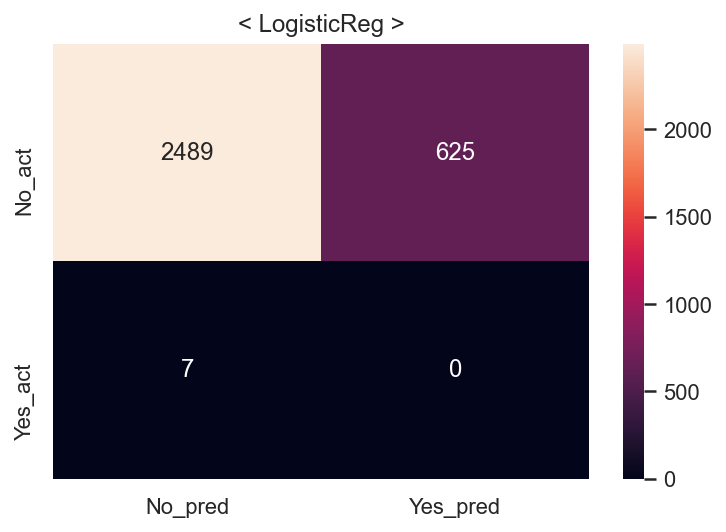

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


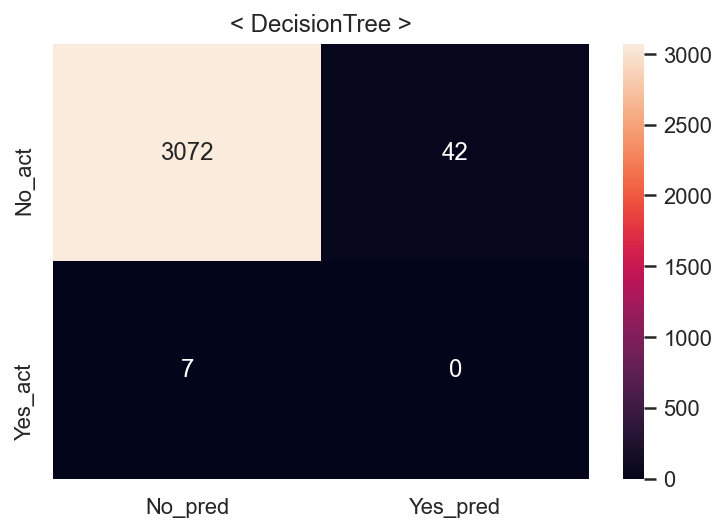

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


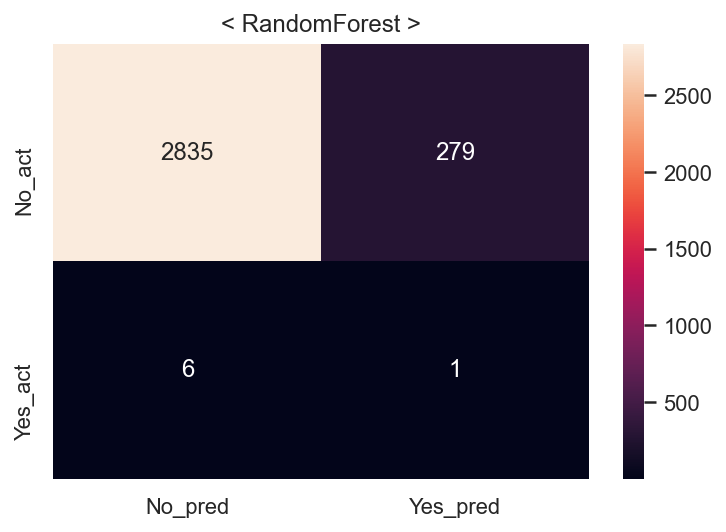

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


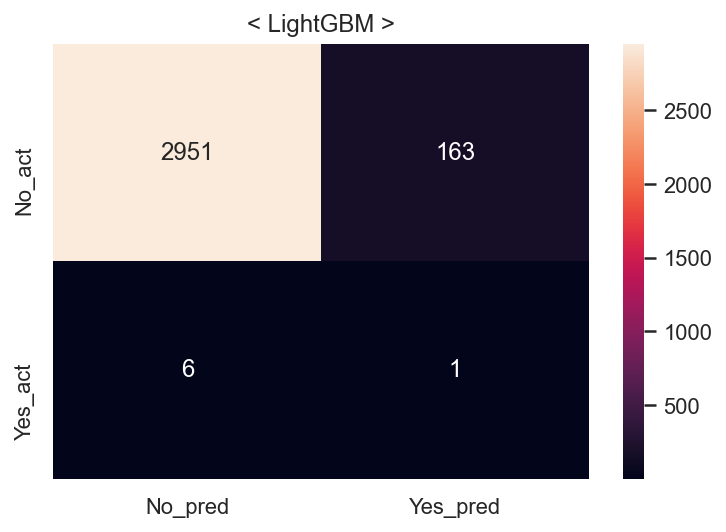

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


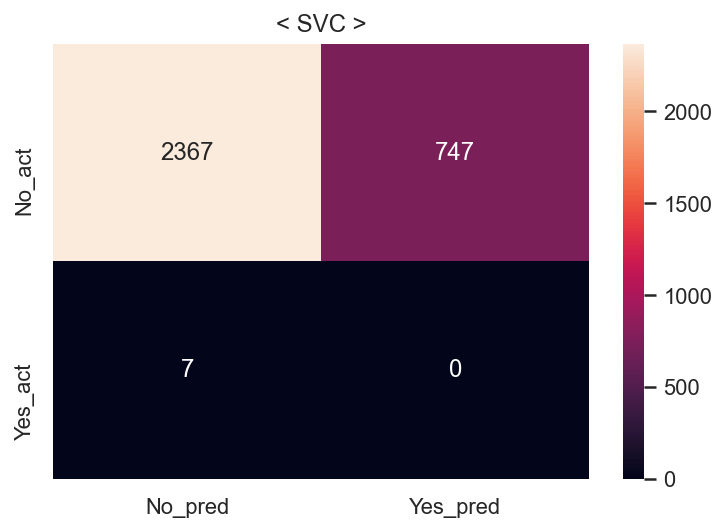

Fit time : 1.28 min


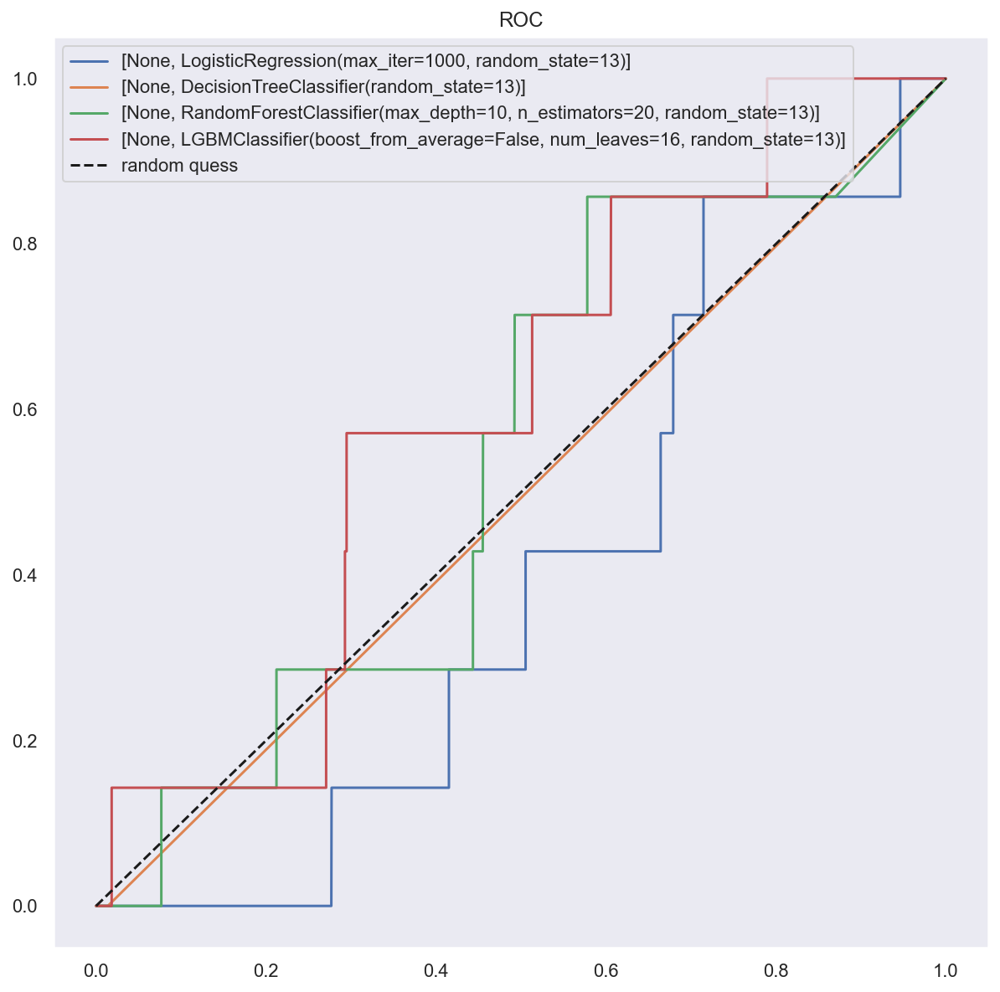

In [33]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list10, result_df10 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [93]:
result_df10["null_del"] = [1]  * len(result_df10)
result_df10["encoded"] = [0]  * len(result_df10)
result_df10["scaler"] = ["None"]  * len(result_df10)
result_df10["sampler"] = ["ADASYN"]  * len(result_df10)
result_df10 = result_df10[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df10

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,None,ADASYN,LogisticReg,0.781526,0.763515,0.815847,0.788814,0.781518,0.797501,0.000000,0.000000,0.000000,0.399647
1,1,0,None,ADASYN,DecisionTree,0.998673,0.997585,0.999766,0.998674,0.998672,0.984300,0.000000,0.000000,0.000000,0.493256
2,1,0,None,ADASYN,RandomForest,0.946865,0.904473,0.999297,0.949523,0.946853,0.908683,0.003571,0.142857,0.006969,0.526631
3,1,0,None,ADASYN,LightGBM,0.974155,0.952946,0.997580,0.974752,0.974149,0.945851,0.006098,0.142857,0.011696,0.545256
4,1,0,None,ADASYN,SVC,0.781096,0.749705,0.844106,0.794110,0.781082,0.758411,0.000000,0.000000,0.000000,0.380058


## 열한번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


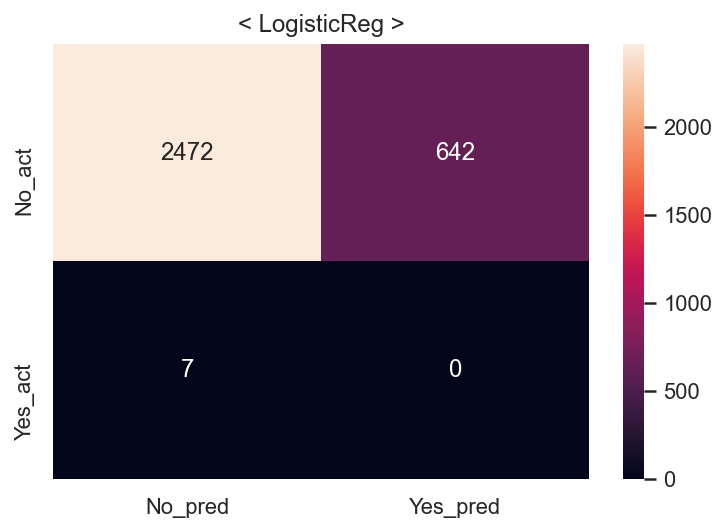

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


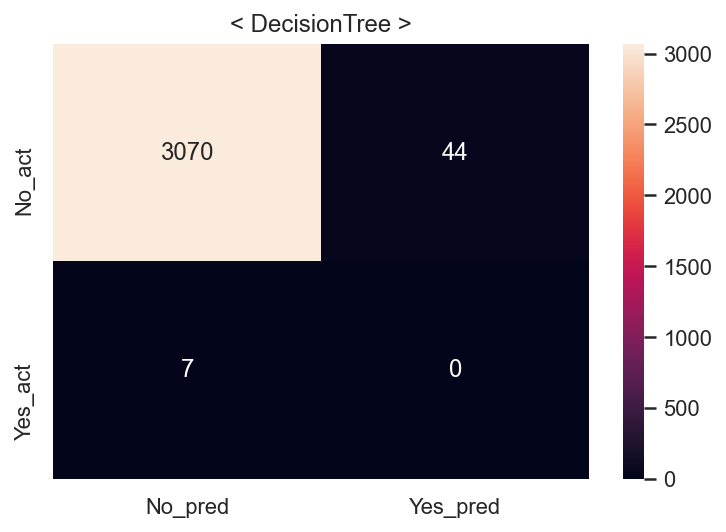

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


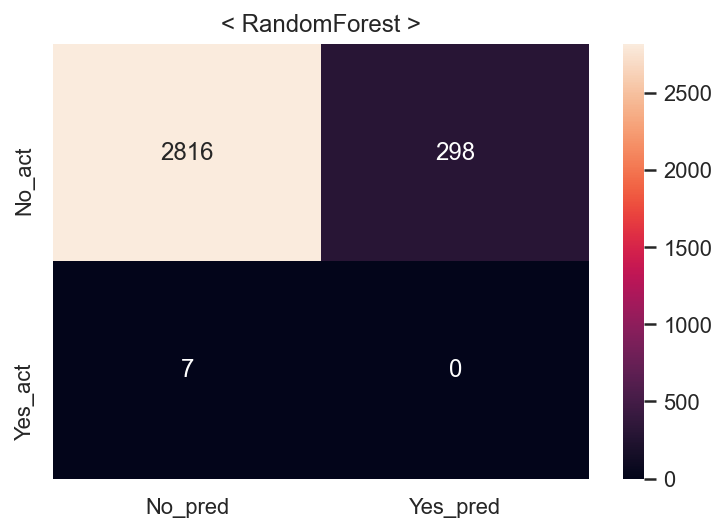

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


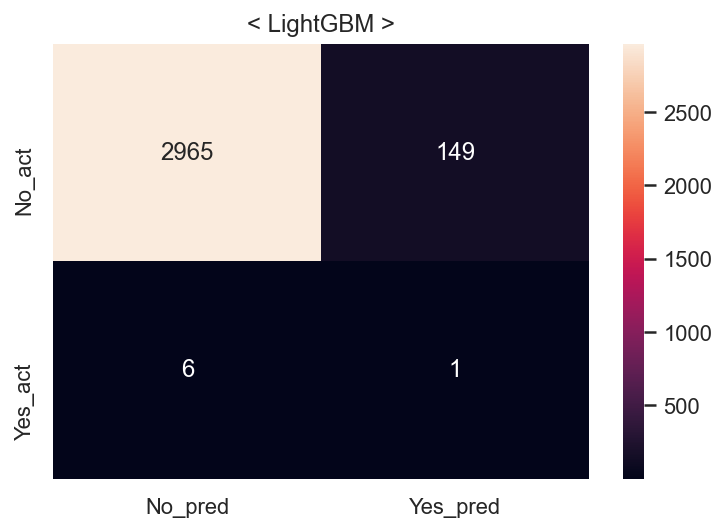

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


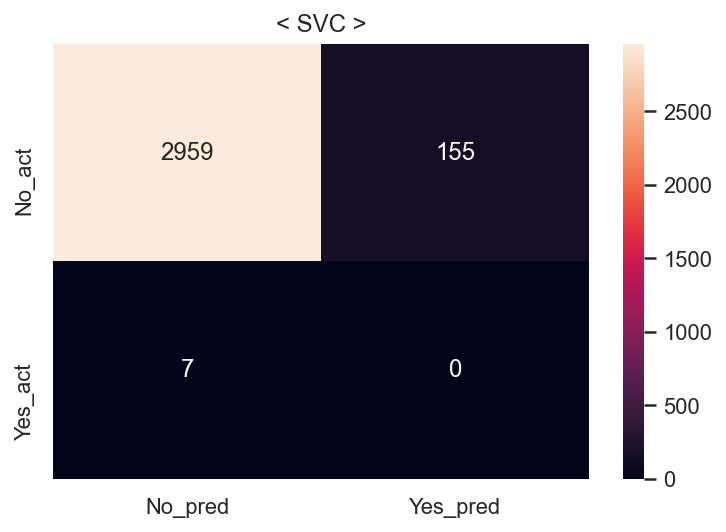

Fit time : 0.76 min


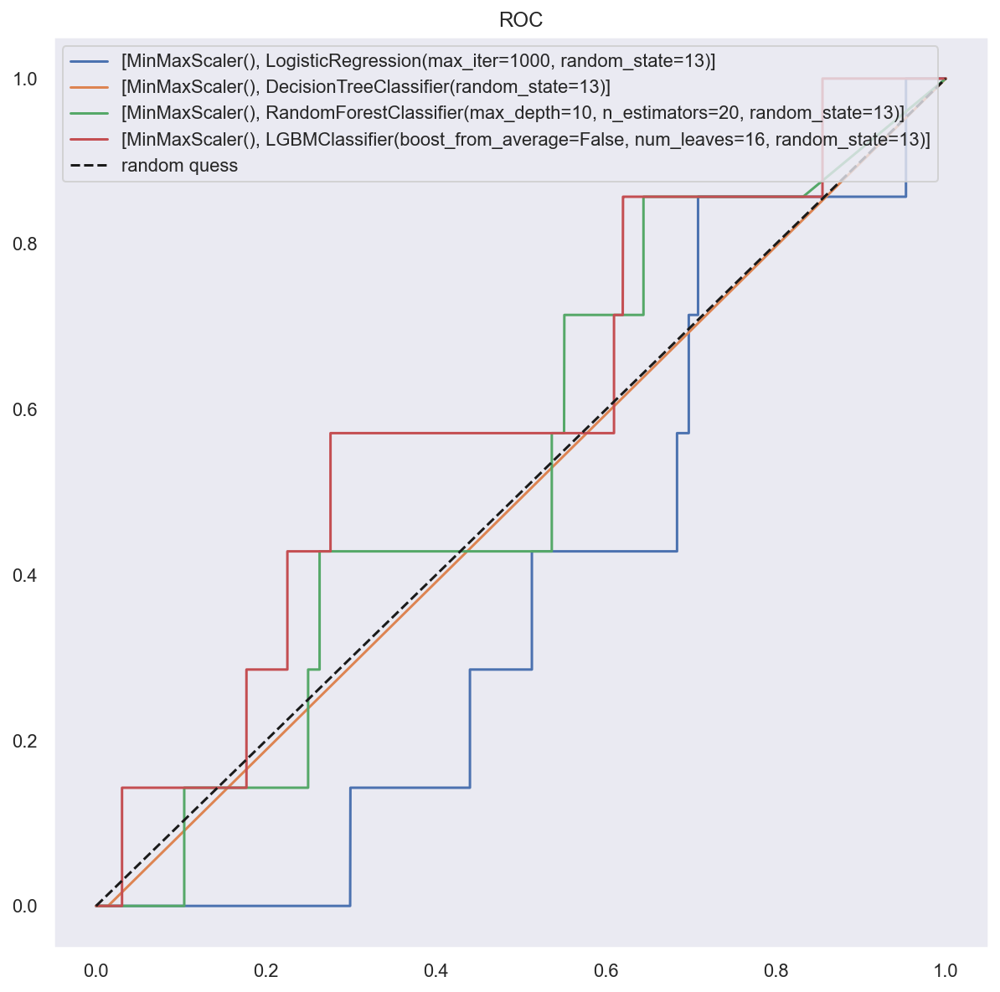

In [34]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list11, result_df11 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [94]:
result_df11["null_del"] = [1]  * len(result_df11)
result_df11["encoded"] = [0]  * len(result_df11)
result_df11["scaler"] = ["MM"]  * len(result_df11)
result_df11["sampler"] = ["SMOTE"]  * len(result_df11)
result_df11 = result_df11[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df11

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,MM,SMOTE,LogisticReg,0.783115,0.762834,0.821696,0.791172,0.783115,0.792054,0.000000,0.000000,0.000000,0.396917
1,1,0,MM,SMOTE,DecisionTree,0.998672,0.997507,0.999844,0.998674,0.998672,0.983659,0.000000,0.000000,0.000000,0.492935
2,1,0,MM,SMOTE,RandomForest,0.947516,0.905405,0.999453,0.950108,0.947516,0.902275,0.000000,0.000000,0.000000,0.452152
3,1,0,MM,SMOTE,LightGBM,0.975555,0.954132,0.999141,0.976118,0.975555,0.950336,0.006667,0.142857,0.012739,0.547504
4,1,0,MM,SMOTE,SVC,0.969346,0.943604,0.998360,0.970210,0.969346,0.948094,0.000000,0.000000,0.000000,0.475112


## 열두번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12810]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


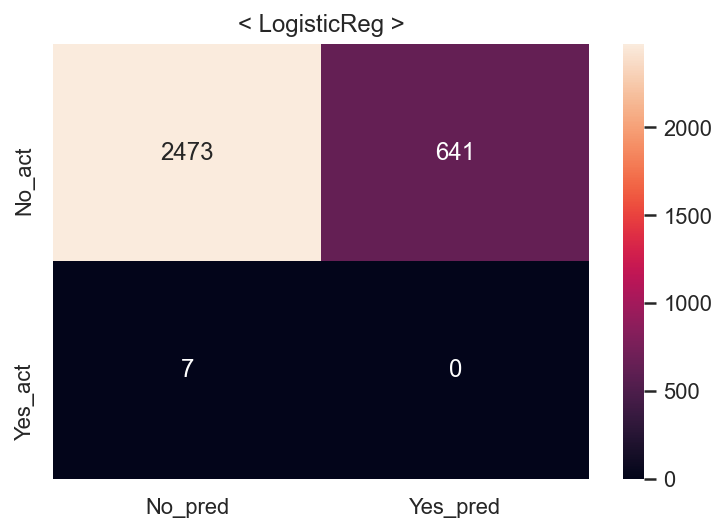

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


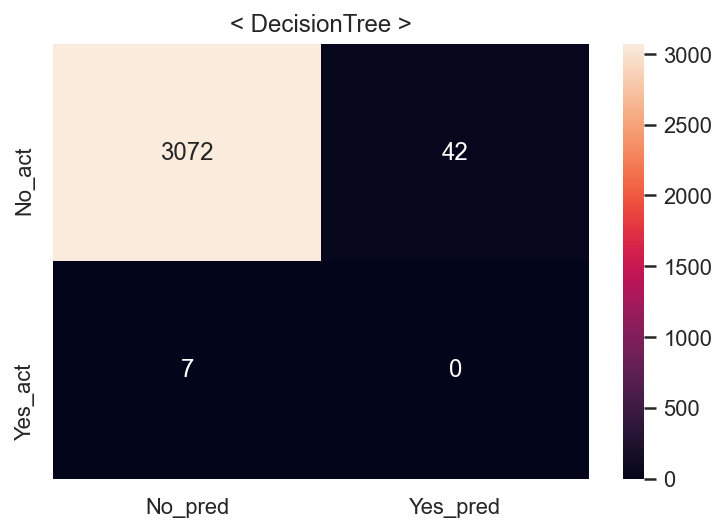

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


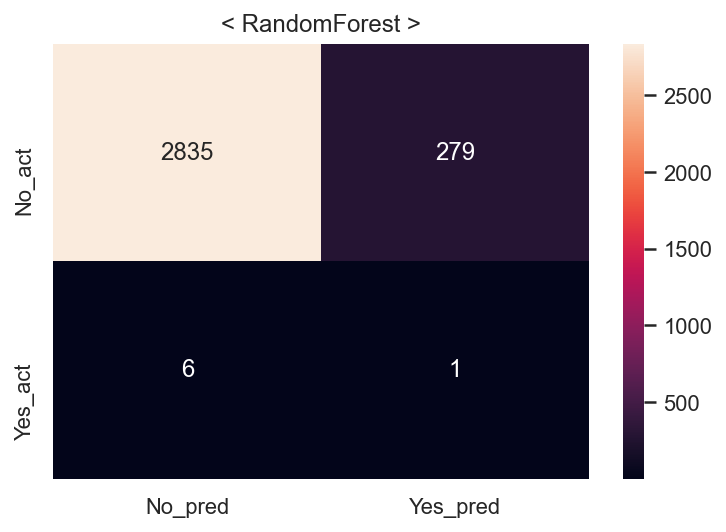

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


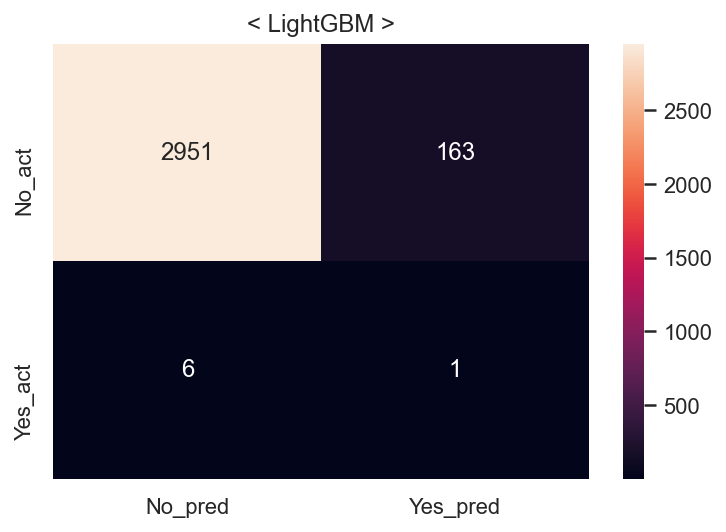

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


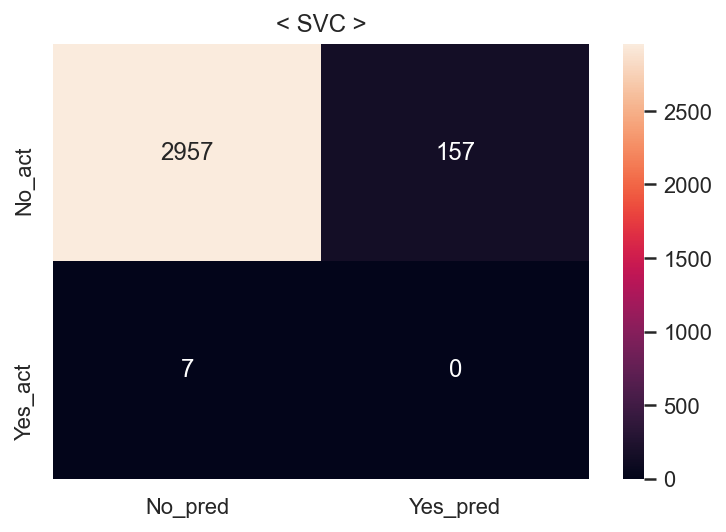

Fit time : 0.68 min


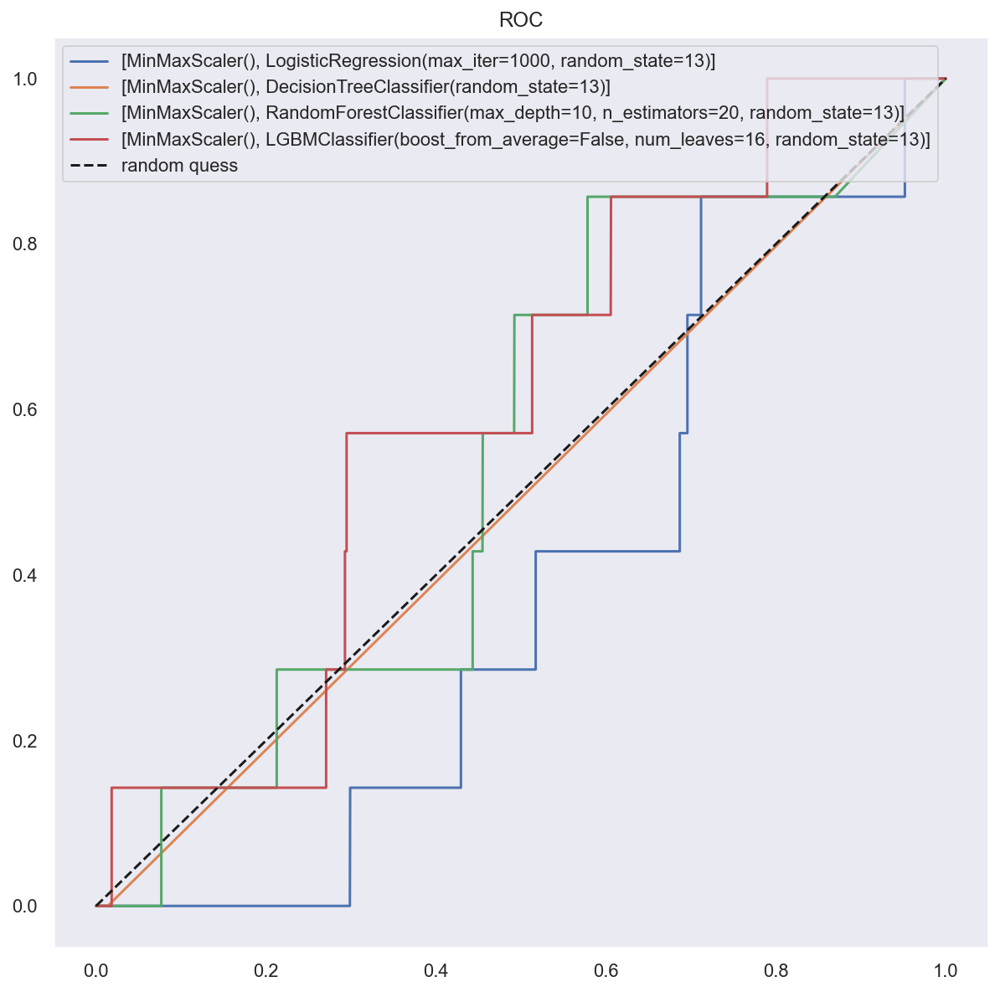

In [35]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list12, result_df12 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [95]:
result_df12["null_del"] = [1]  * len(result_df11)
result_df12["encoded"] = [0]  * len(result_df11)
result_df12["scaler"] = ["MM"]  * len(result_df11)
result_df12["sampler"] = ["ADASYN"]  * len(result_df11)
result_df12 = result_df12[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df12

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,MM,ADASYN,LogisticReg,0.780589,0.761874,0.816472,0.788228,0.780580,0.792374,0.000000,0.000000,0.000000,0.397078
1,1,0,MM,ADASYN,DecisionTree,0.998673,0.997585,0.999766,0.998674,0.998672,0.984300,0.000000,0.000000,0.000000,0.493256
2,1,0,MM,ADASYN,RandomForest,0.946865,0.904473,0.999297,0.949523,0.946853,0.908683,0.003571,0.142857,0.006969,0.526631
3,1,0,MM,ADASYN,LightGBM,0.974155,0.952946,0.997580,0.974752,0.974149,0.945851,0.006098,0.142857,0.011696,0.545256
4,1,0,MM,ADASYN,SVC,0.969118,0.943407,0.998126,0.969996,0.969112,0.947453,0.000000,0.000000,0.000000,0.474791


## 열세번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


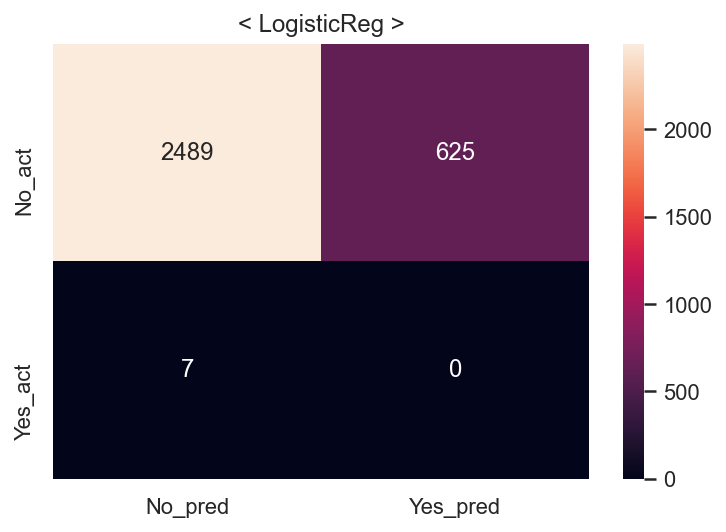

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


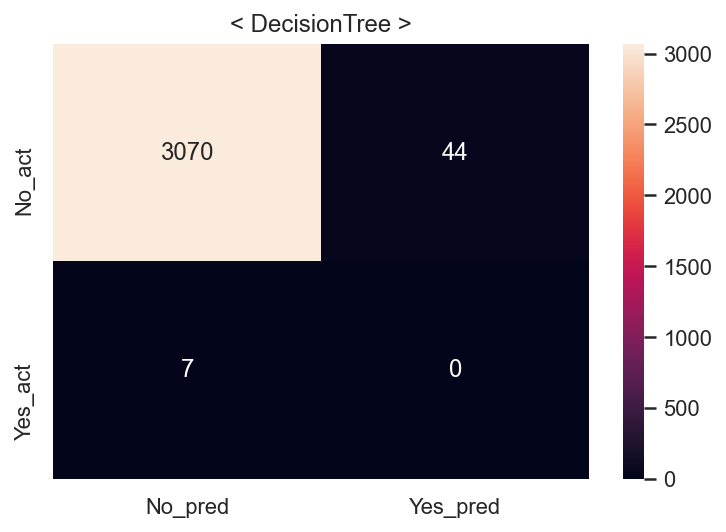

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


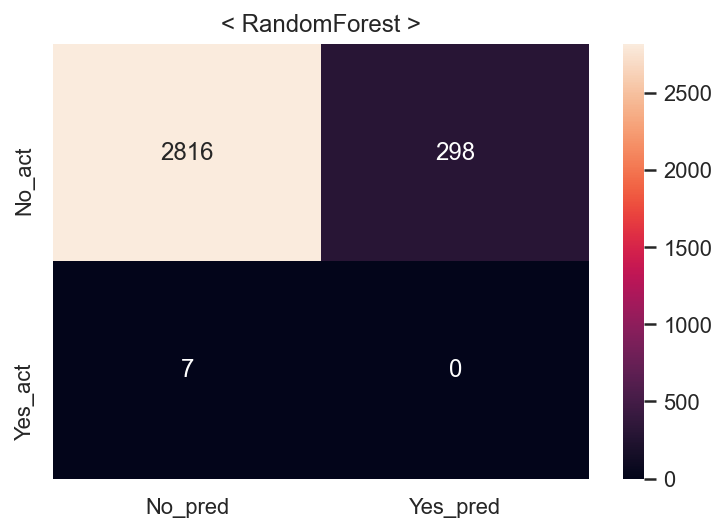

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


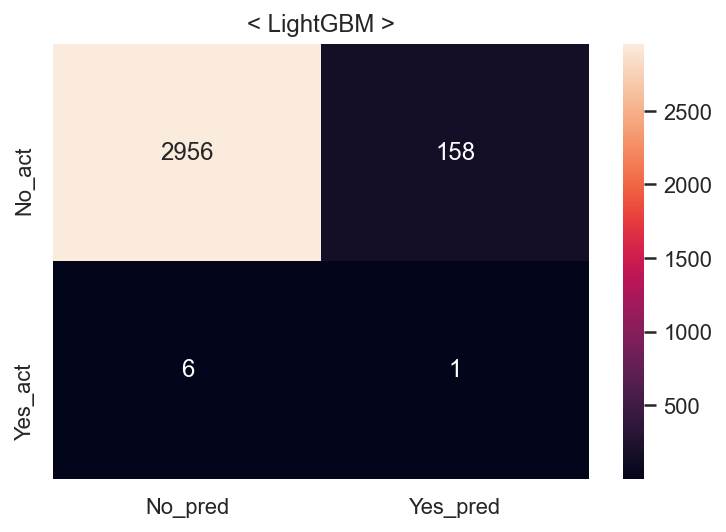

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


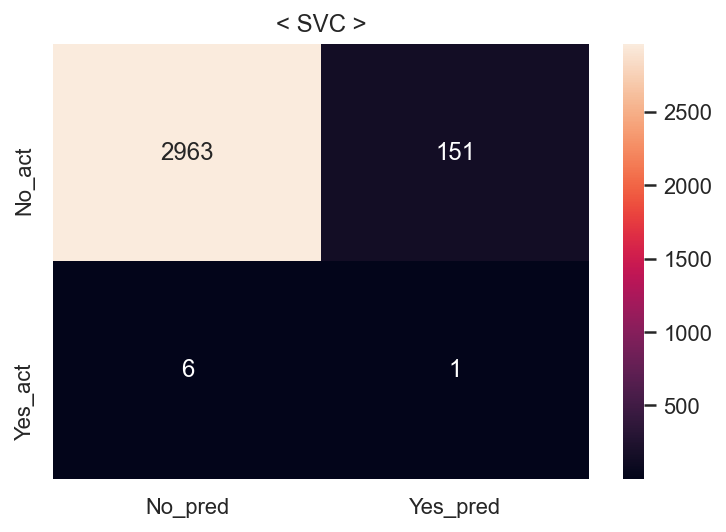

Fit time : 0.49 min


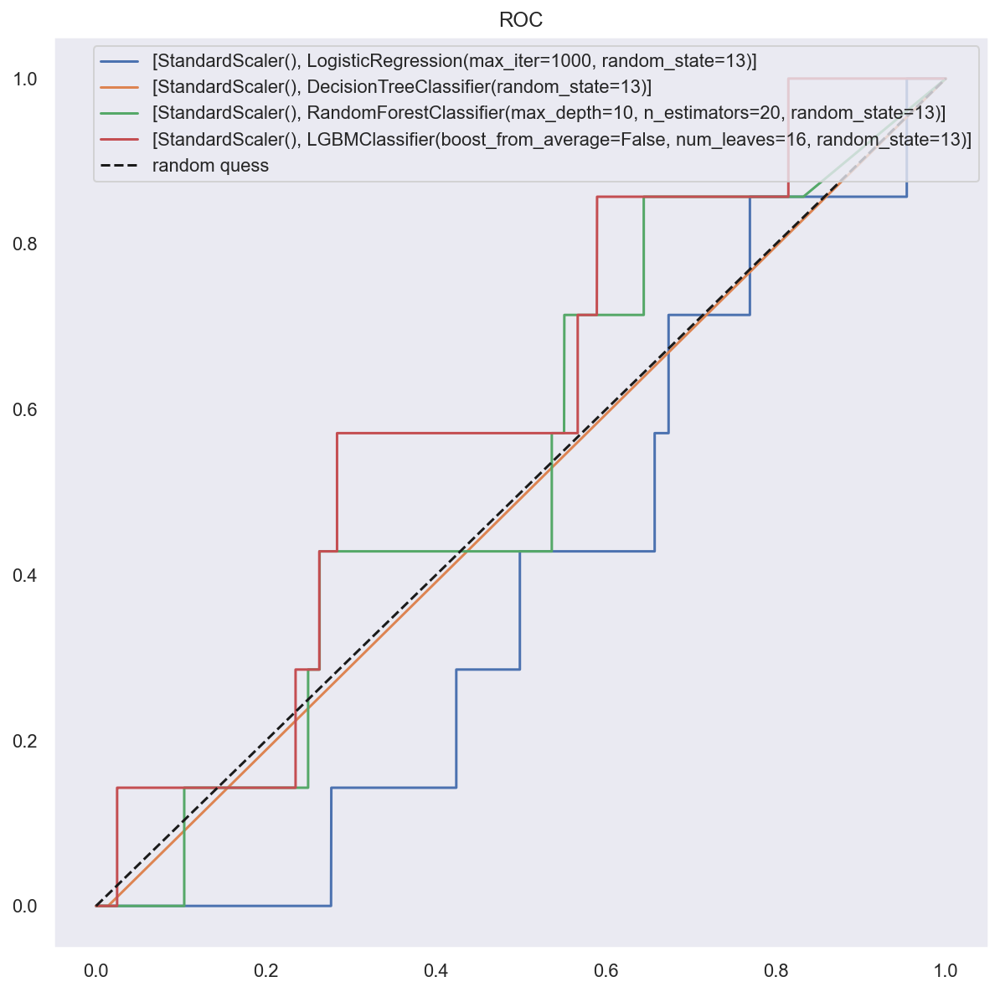

In [36]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list13, result_df13 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [96]:
result_df13["null_del"] = [1]  * len(result_df13)
result_df13["encoded"] = [0]  * len(result_df13)
result_df13["scaler"] = ["SD"]  * len(result_df13)
result_df13["sampler"] = ["SMOTE"]  * len(result_df13)
result_df13 = result_df13[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df13

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,SD,SMOTE,LogisticReg,0.780537,0.762343,0.815214,0.787893,0.780537,0.797501,0.000000,0.000000,0.000000,0.399647
1,1,0,SD,SMOTE,DecisionTree,0.998672,0.997507,0.999844,0.998674,0.998672,0.983659,0.000000,0.000000,0.000000,0.492935
2,1,0,SD,SMOTE,RandomForest,0.947516,0.905405,0.999453,0.950108,0.947516,0.902275,0.000000,0.000000,0.000000,0.452152
3,1,0,SD,SMOTE,LightGBM,0.974422,0.952140,0.999063,0.975037,0.974422,0.947453,0.006289,0.142857,0.012048,0.546059
4,1,0,SD,SMOTE,SVC,0.981412,0.964717,0.999375,0.981740,0.981412,0.949696,0.006579,0.142857,0.012579,0.547183


## 열네번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12810]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


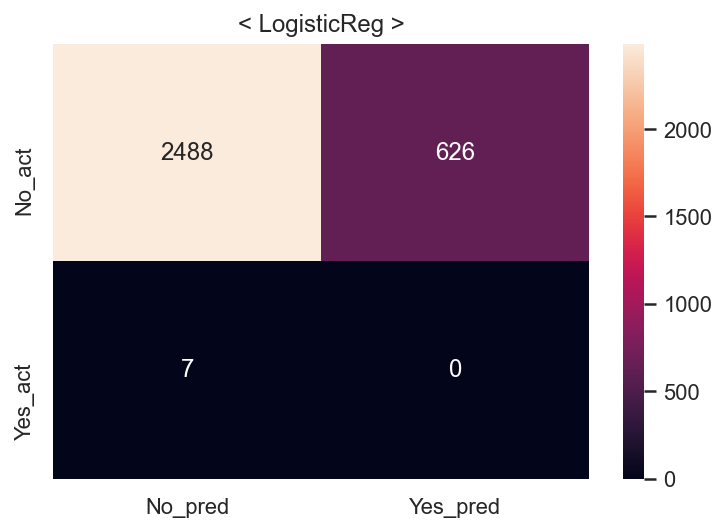

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


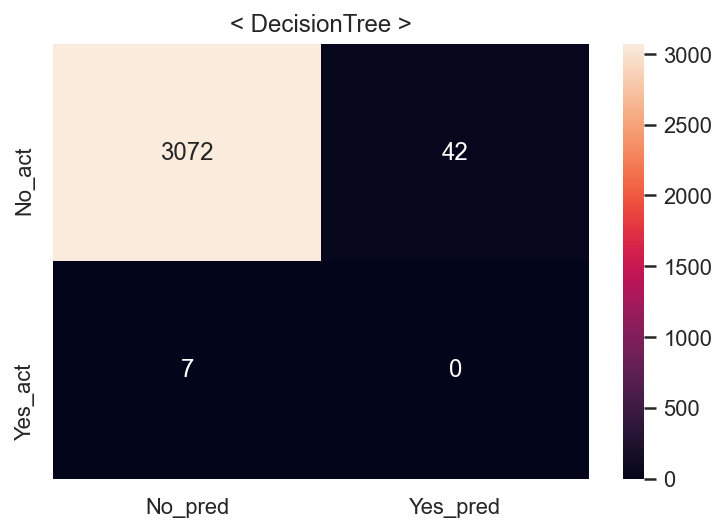

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


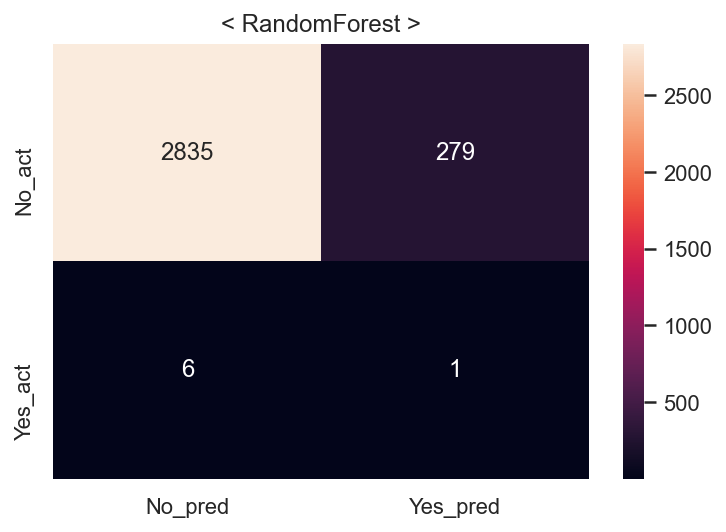

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


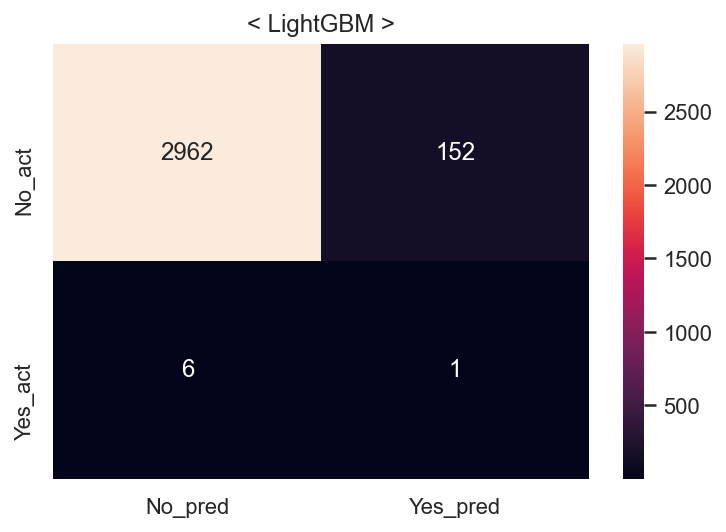

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


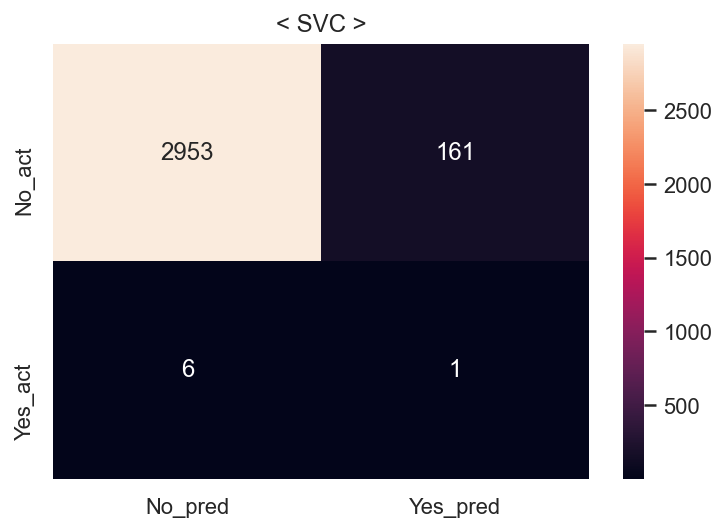

Fit time : 0.45 min


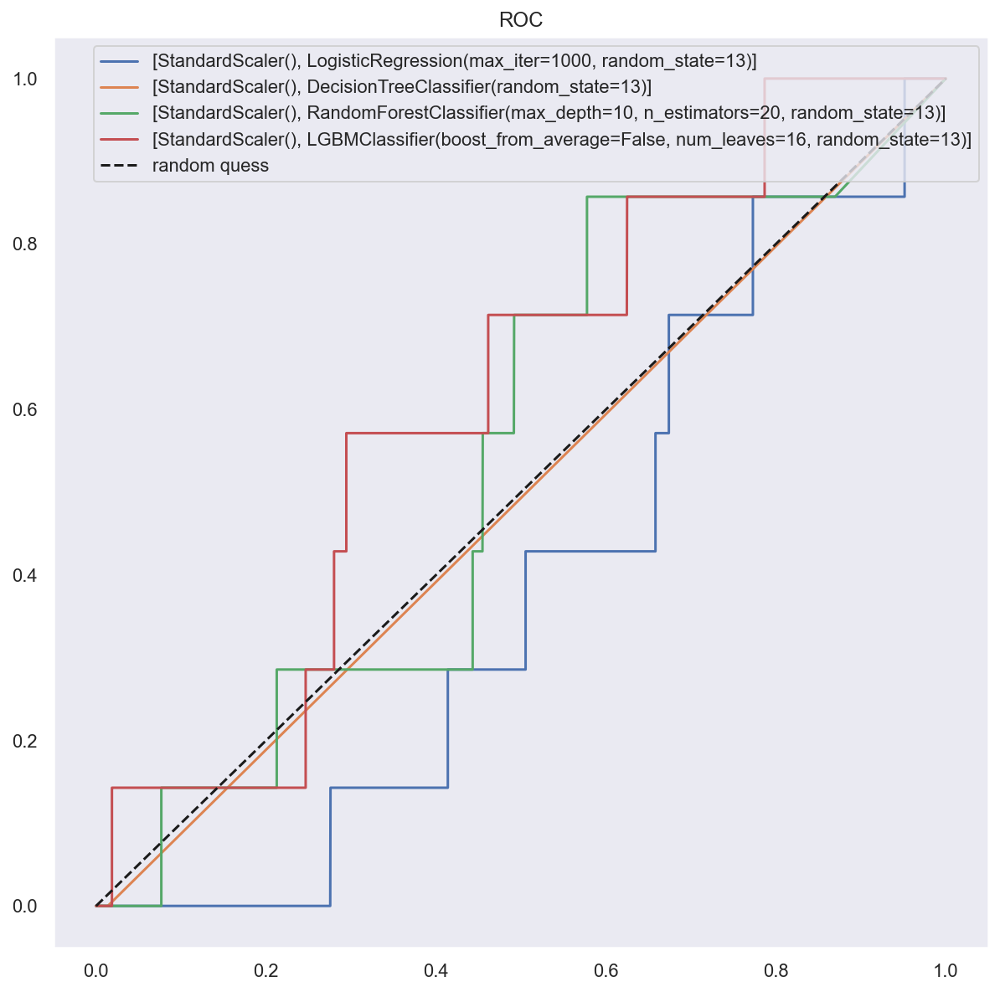

In [37]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list14, result_df14 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [97]:
result_df14["null_del"] = [1]  * len(result_df14)
result_df14["encoded"] = [0]  * len(result_df14)
result_df14["scaler"] = ["SD"]  * len(result_df14)
result_df14["sampler"] = ["ADASYN"]  * len(result_df14)
result_df14 = result_df14[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df14

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,SD,ADASYN,LogisticReg,0.781174,0.763014,0.815847,0.788546,0.781166,0.797180,0.000000,0.000000,0.000000,0.399486
1,1,0,SD,ADASYN,DecisionTree,0.998673,0.997585,0.999766,0.998674,0.998672,0.984300,0.000000,0.000000,0.000000,0.493256
2,1,0,SD,ADASYN,RandomForest,0.946865,0.904473,0.999297,0.949523,0.946853,0.908683,0.003571,0.142857,0.006969,0.526631
3,1,0,SD,ADASYN,LightGBM,0.974233,0.953020,0.997658,0.974828,0.974227,0.949375,0.006536,0.142857,0.012500,0.547023
4,1,0,SD,ADASYN,SVC,0.980870,0.963716,0.999375,0.981222,0.980866,0.946492,0.006173,0.142857,0.011834,0.545578


## 열다섯번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.6s
====Done Evaluation====
====Done Evaluation====


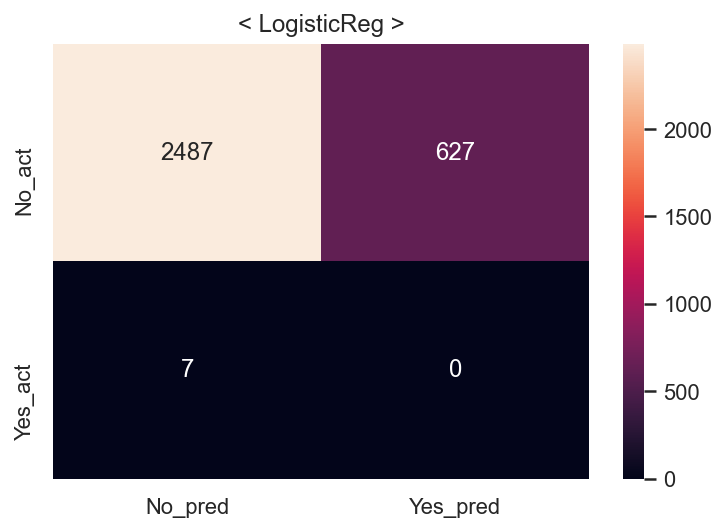

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


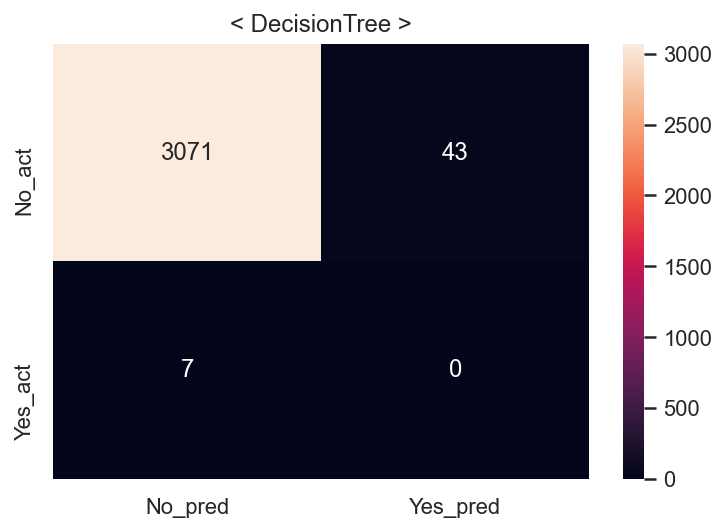

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


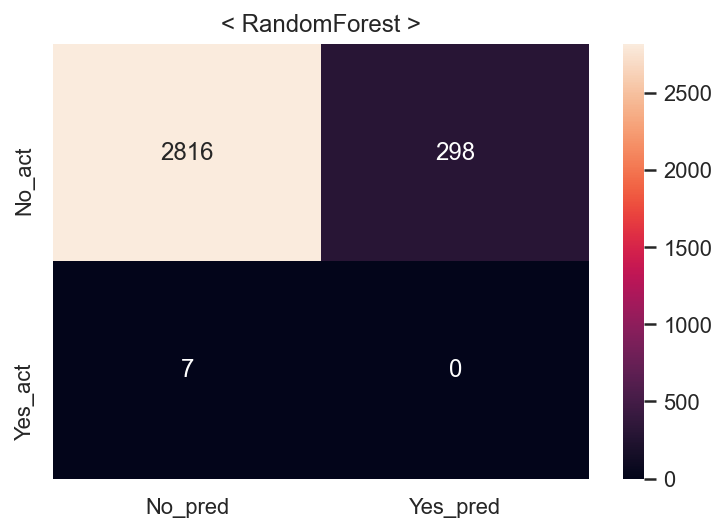

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


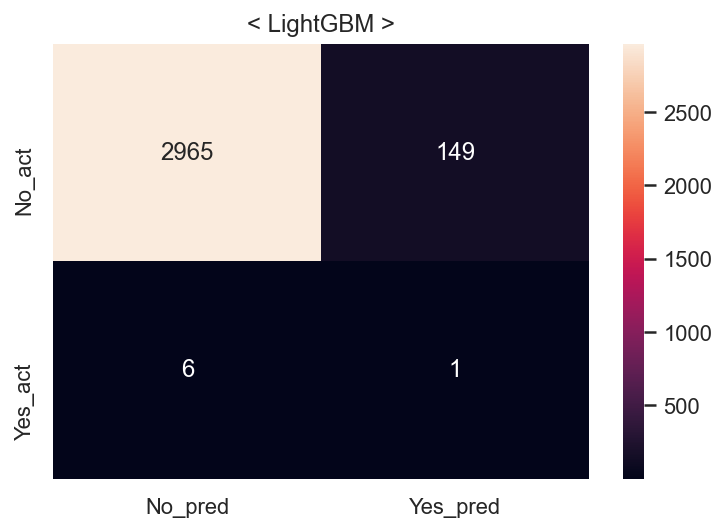

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


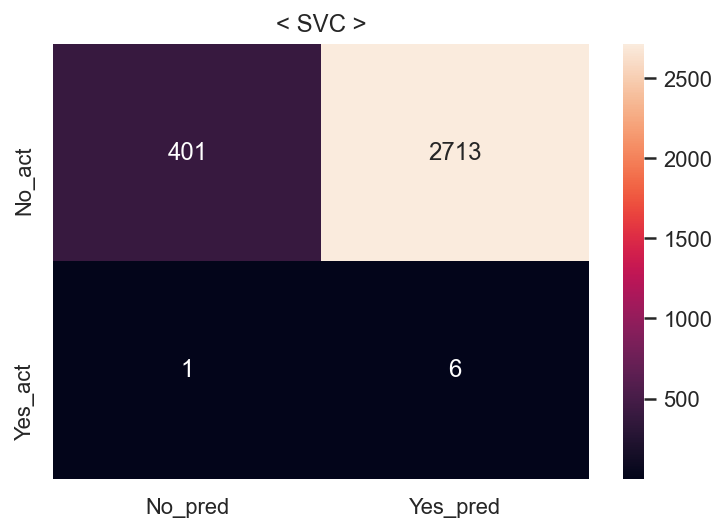

Fit time : 1.53 min


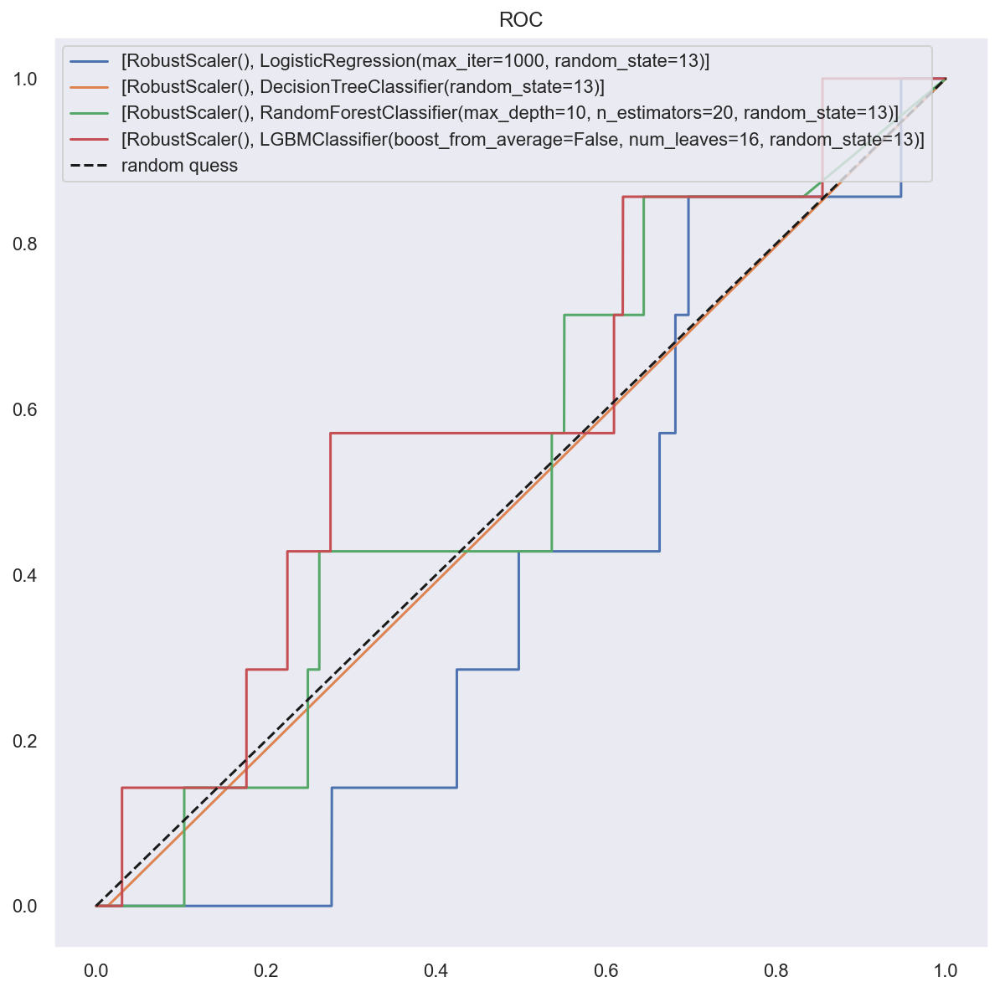

In [38]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list15, result_df15 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [98]:
result_df15["null_del"] = [1]  * len(result_df15)
result_df15["encoded"] = [0]  * len(result_df15)
result_df15["scaler"] = ["RB"]  * len(result_df15)
result_df15["sampler"] = ["SMOTE"]  * len(result_df15)
result_df15 = result_df15[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df15

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,RB,SMOTE,LogisticReg,0.780498,0.762287,0.815214,0.787863,0.780498,0.796860,0.000000,0.000000,0.000000,0.399326
1,1,0,RB,SMOTE,DecisionTree,0.998672,0.997507,0.999844,0.998674,0.998672,0.983979,0.000000,0.000000,0.000000,0.493096
2,1,0,RB,SMOTE,RandomForest,0.947516,0.905405,0.999453,0.950108,0.947516,0.902275,0.000000,0.000000,0.000000,0.452152
3,1,0,RB,SMOTE,LightGBM,0.975555,0.954132,0.999141,0.976118,0.975555,0.950336,0.006667,0.142857,0.012739,0.547504
4,1,0,RB,SMOTE,SVC,0.565644,0.535131,0.999922,0.697160,0.565644,0.130407,0.002207,0.857143,0.004402,0.492958


## 열여섯번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12810]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.4s
====Done Evaluation====
====Done Evaluation====


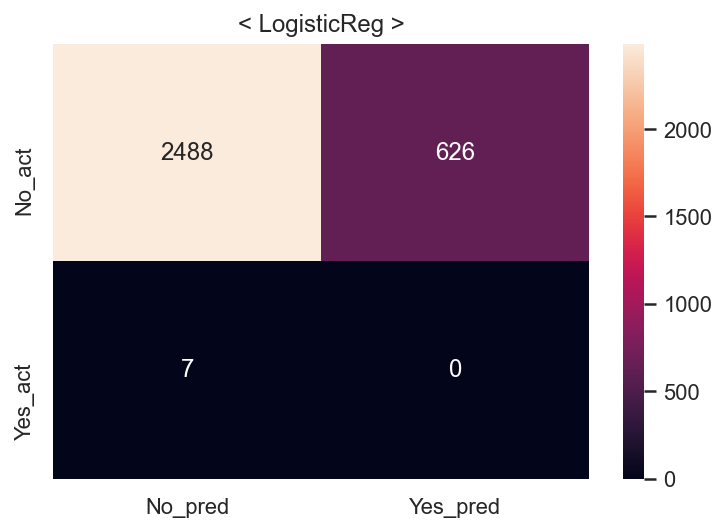

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


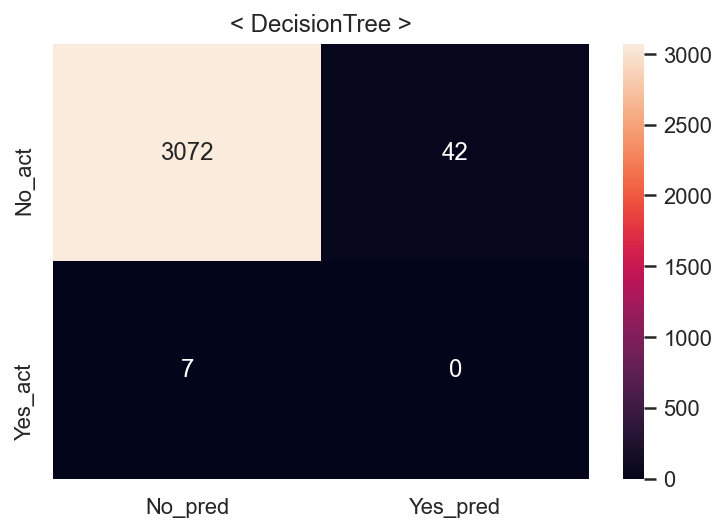

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


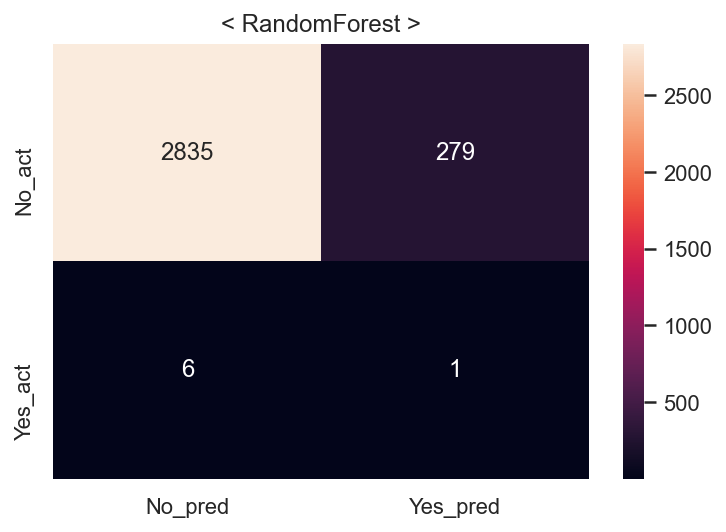

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


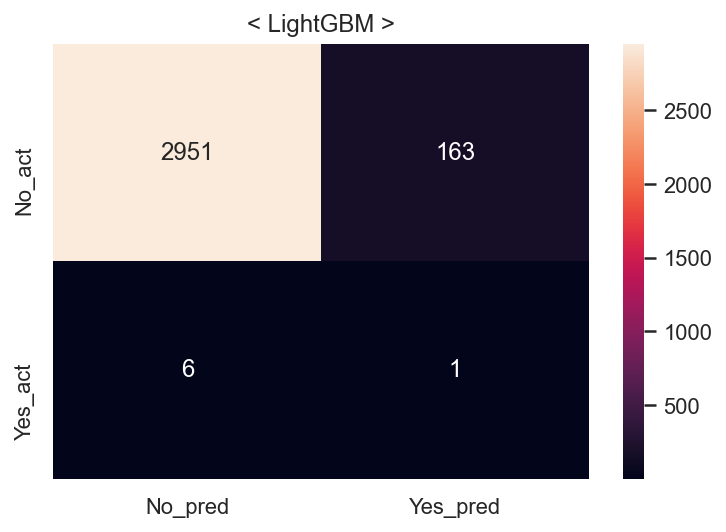

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


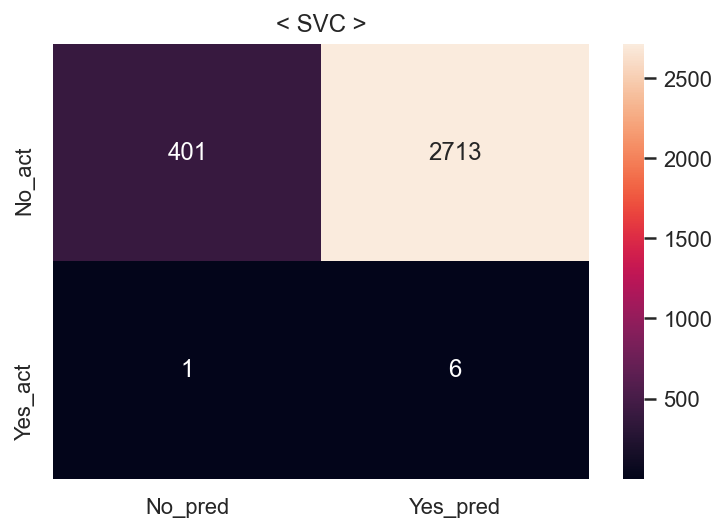

Fit time : 1.48 min


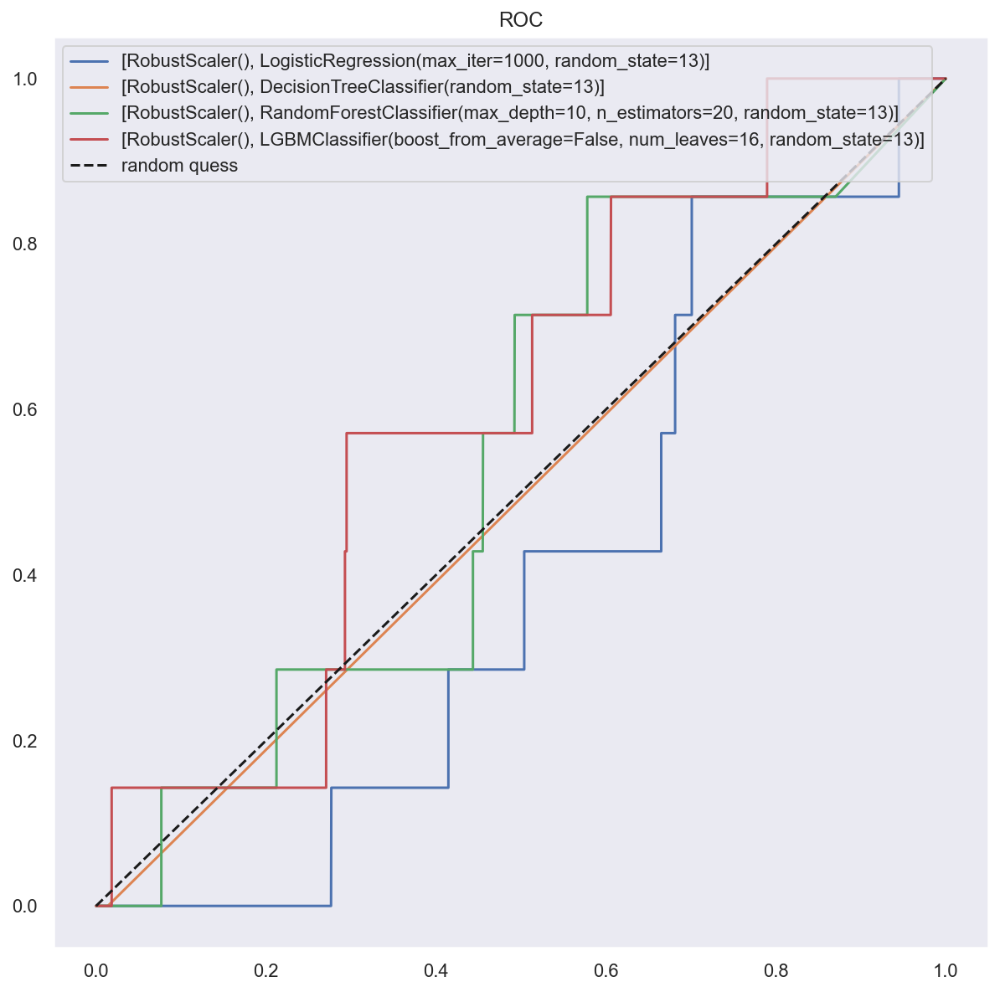

In [39]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list16, result_df16 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [99]:
result_df16["null_del"] = [1]  * len(result_df16)
result_df16["encoded"] = [0]  * len(result_df16)
result_df16["scaler"] = ["RB"]  * len(result_df16)
result_df16["sampler"] = ["ADASYN"]  * len(result_df16)
result_df16 = result_df16[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df16

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,RB,ADASYN,LogisticReg,0.781370,0.763292,0.815847,0.788695,0.781361,0.797180,0.000000,0.000000,0.000000,0.399486
1,1,0,RB,ADASYN,DecisionTree,0.998673,0.997585,0.999766,0.998674,0.998672,0.984300,0.000000,0.000000,0.000000,0.493256
2,1,0,RB,ADASYN,RandomForest,0.946865,0.904473,0.999297,0.949523,0.946853,0.908683,0.003571,0.142857,0.006969,0.526631
3,1,0,RB,ADASYN,LightGBM,0.974155,0.952946,0.997580,0.974752,0.974149,0.945851,0.006098,0.142857,0.011696,0.545256
4,1,0,RB,ADASYN,SVC,0.565667,0.535208,0.999766,0.697188,0.565566,0.130407,0.002207,0.857143,0.004402,0.492958


## 2. 이상 index 삭제, 원핫인코딩 쓰는 경우 - 8가지 

In [47]:
socar_strange_index.columns

Index(['fraud_YN', 'car_model', 'sharing_type', 'age_group',
       'has_previous_accident', 'cumulative_use_count', 'b2b',
       'accident_ratio', 'pf_type', 'socarpass', 'socarsave', 'start_hour',
       'duration', 'accident_hour', 'repair_cost', 'insure_cost',
       'accident_location', 'car_part1', 'car_part2', 'repair_cnt',
       'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN',
       'total_prsn_cnt', 'test_set'],
      dtype='object')

In [51]:
columns_1hot = socar_strange_index.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
socar_strange_1hot = pd.get_dummies(socar_strange_index, columns=columns_1hot)

## 열일곱번째
### (1) NULL값 유지, (2)데이터 분리, (3) SMOTE, (4) 스케일링 없음

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


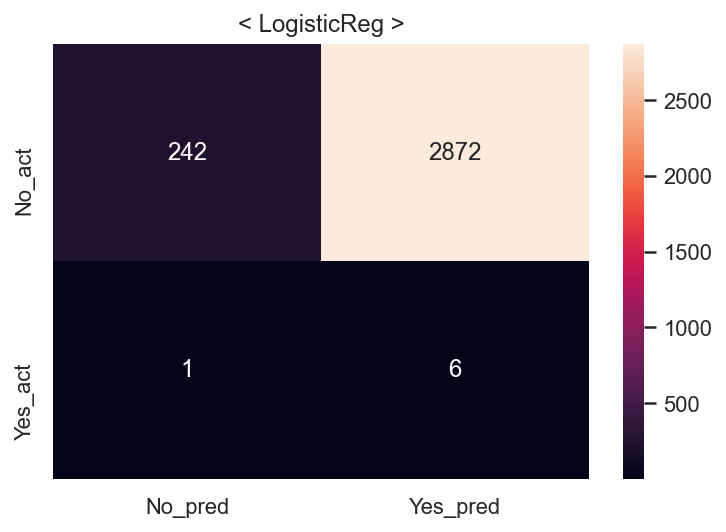

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


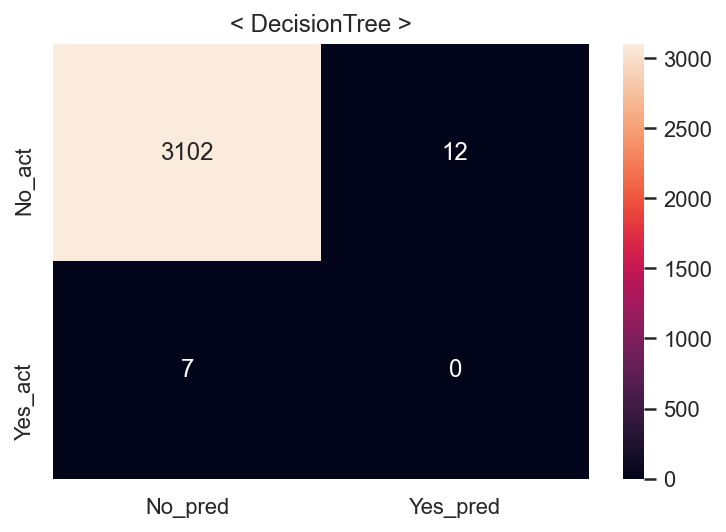

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


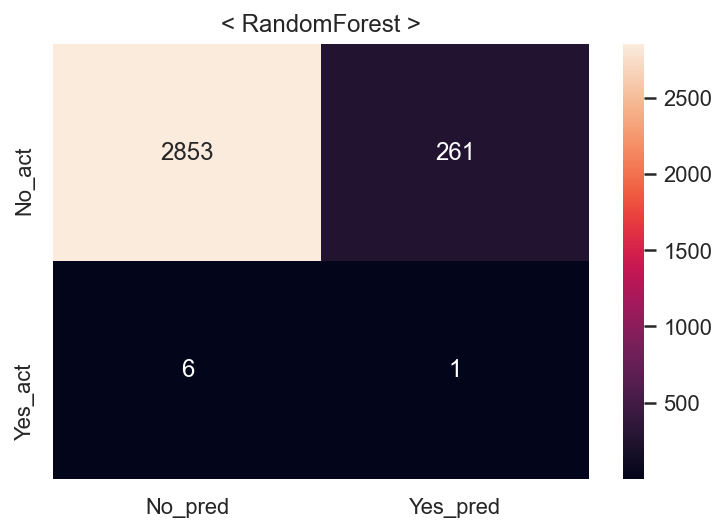

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


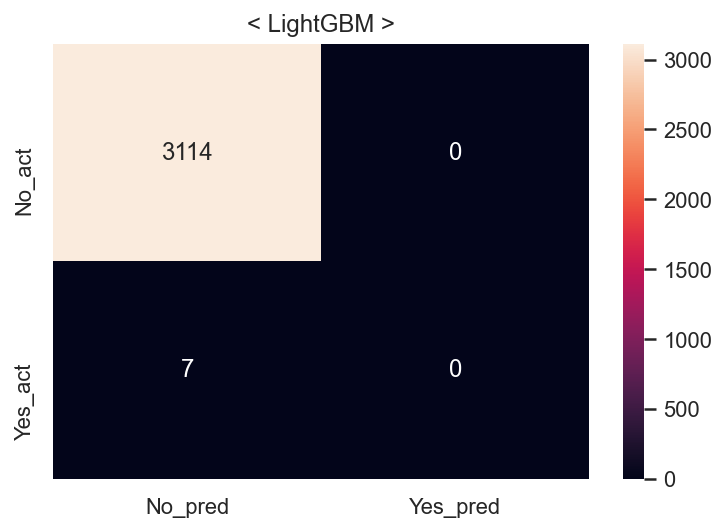

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


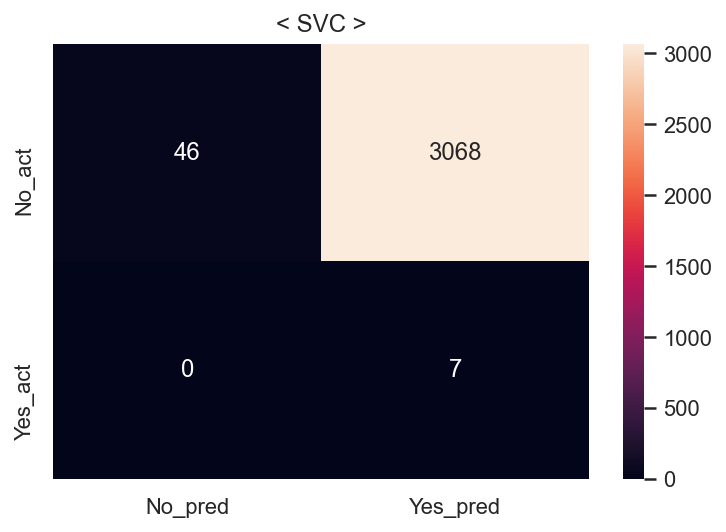

Fit time : 16.61 min


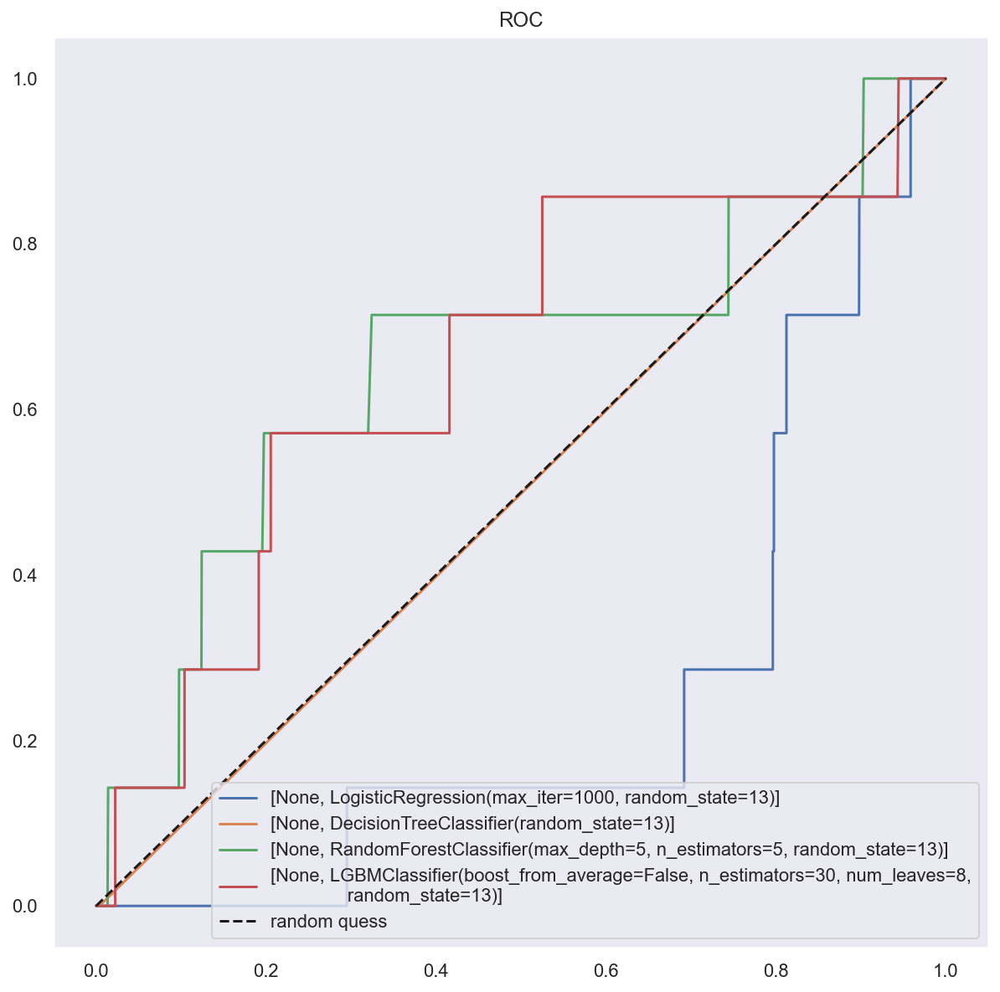

In [52]:
# 1hot
columns_1hot = socar_strange_index.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
socar_strange_1hot = pd.get_dummies(socar_strange_index, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list17, result_df17 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [100]:
result_df17["null_del"] = [0]  * len(result_df17)
result_df17["encoded"] = [1]  * len(result_df17)
result_df17["scaler"] = ["None"]  * len(result_df17)
result_df17["sampler"] = ["SMOTE"]  * len(result_df17)
result_df17 = result_df17[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df17

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,1,None,SMOTE,LogisticReg,0.536317,0.518843,1.000000,0.683208,0.536317,0.079462,0.002085,0.857143,0.004159,0.467428
1,0,1,None,SMOTE,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.993912,0.000000,0.000000,0.000000,0.498073
2,0,1,None,SMOTE,RandomForest,0.966612,0.938689,0.998438,0.967642,0.966612,0.914450,0.003817,0.142857,0.007435,0.529521
3,0,1,None,SMOTE,LightGBM,0.998633,0.999922,0.997345,0.998631,0.998633,0.997757,0.000000,0.000000,0.000000,0.500000
4,0,1,None,SMOTE,SVC,0.505194,0.502610,1.000000,0.668983,0.505194,0.016982,0.002276,1.000000,0.004543,0.507386


## 열여덟번째
### (1) NULL값 유지, (2)데이터 분리, (3) ADASYN, (4) 스케일링 없음

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


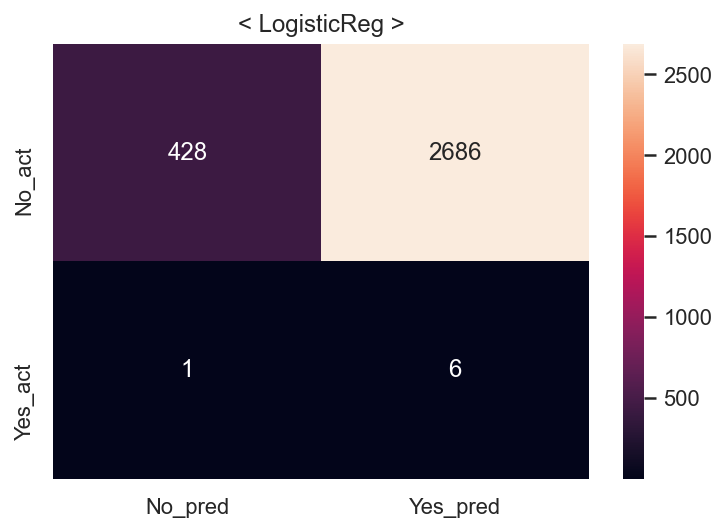

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


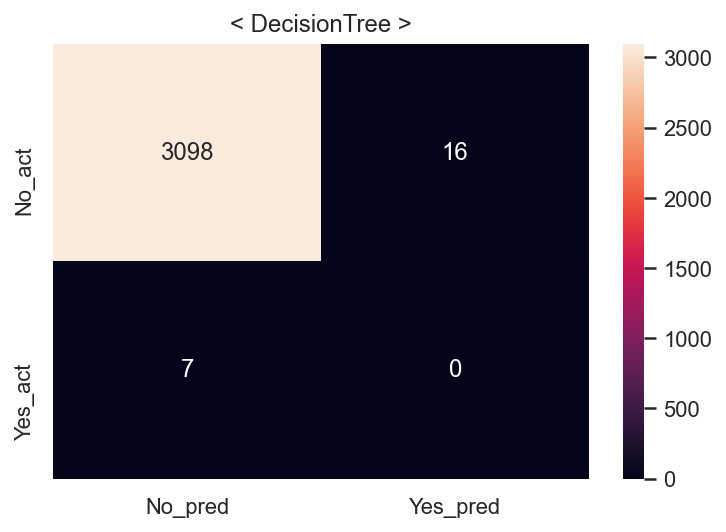

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


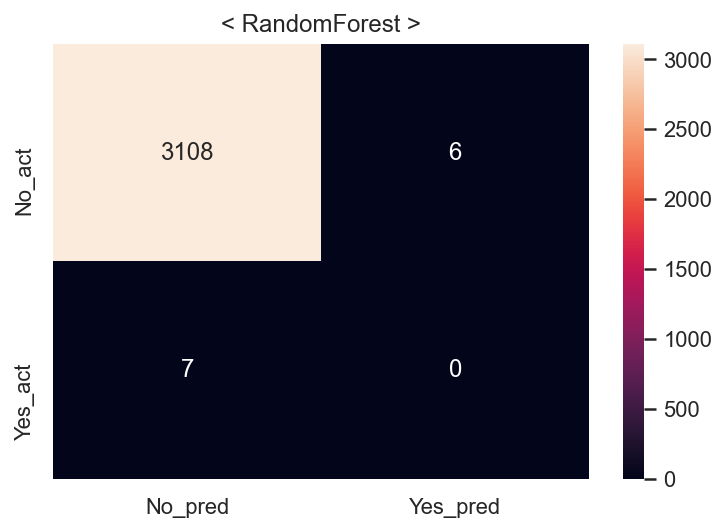

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


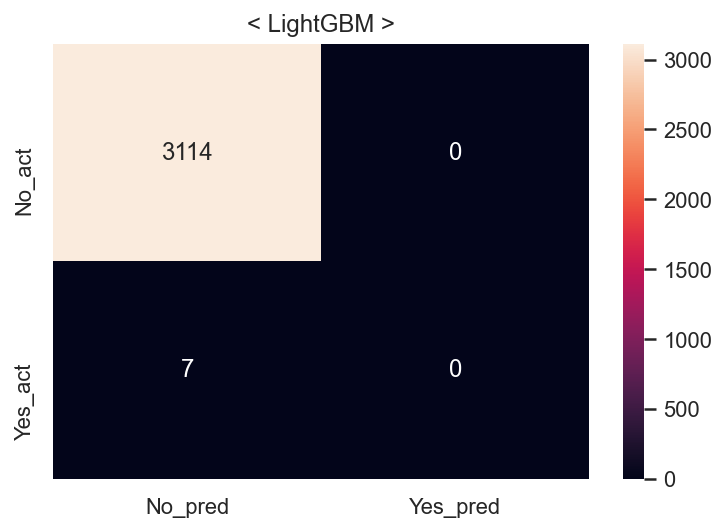

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


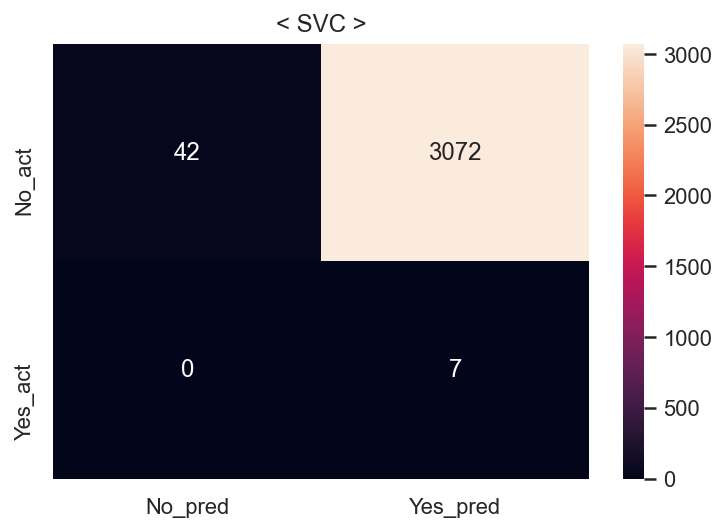

Fit time : 39.57 min


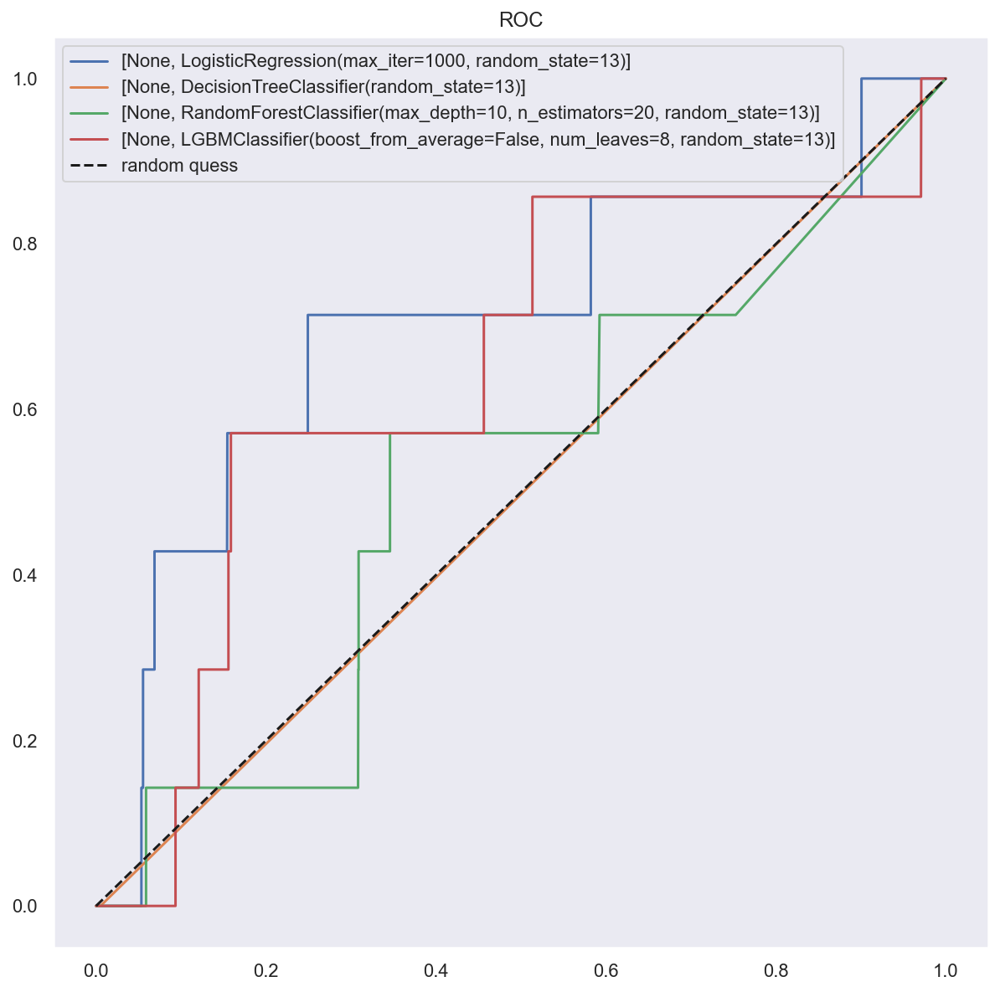

In [53]:
# 1hot
columns_1hot = socar_strange_index.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
socar_strange_1hot = pd.get_dummies(socar_strange_index, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list18, result_df18 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [101]:
result_df18["null_del"] = [0]  * len(result_df18)
result_df18["encoded"] = [1]  * len(result_df18)
result_df18["scaler"] = ["None"]  * len(result_df18)
result_df18["sampler"] = ["ADASYN"]  * len(result_df18)
result_df18 = result_df18[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df18

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,1,None,ADASYN,LogisticReg,0.535477,0.519641,0.945311,0.670633,0.535253,0.139058,0.002229,0.857143,0.004446,0.497293
1,0,1,None,ADASYN,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.992631,0.000000,0.000000,0.000000,0.497431
2,0,1,None,ADASYN,RandomForest,0.998712,0.998363,0.999064,0.998713,0.998712,0.995835,0.000000,0.000000,0.000000,0.499037
3,0,1,None,ADASYN,LightGBM,0.998673,1.000000,0.997347,0.998672,0.998674,0.997757,0.000000,0.000000,0.000000,0.500000
4,0,1,None,ADASYN,SVC,0.505191,0.502746,1.000000,0.669103,0.504920,0.015700,0.002273,1.000000,0.004537,0.506744


## 열아홉번째
### (1) NULL값 유지, (2)데이터 분리, (3) SMOTE, (4) MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


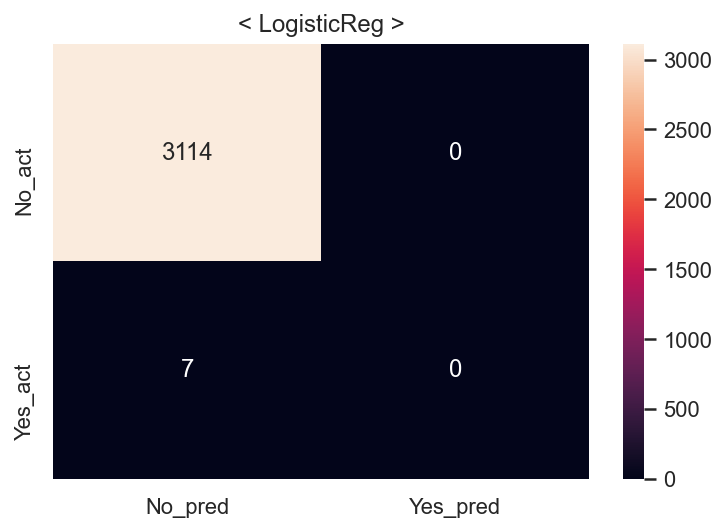

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


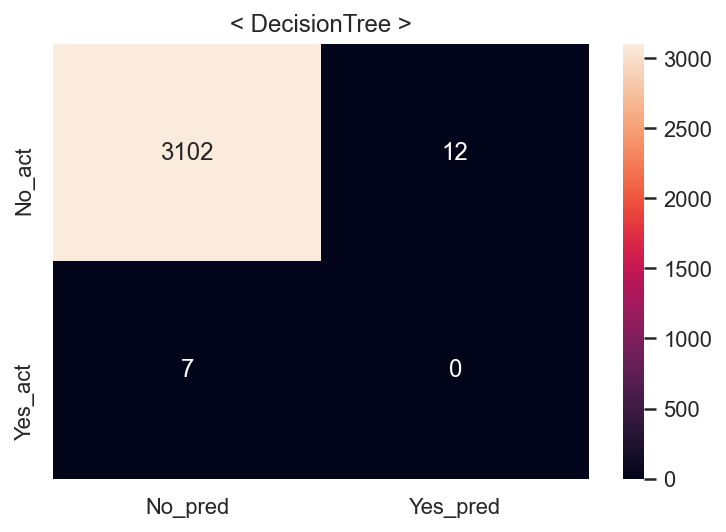

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


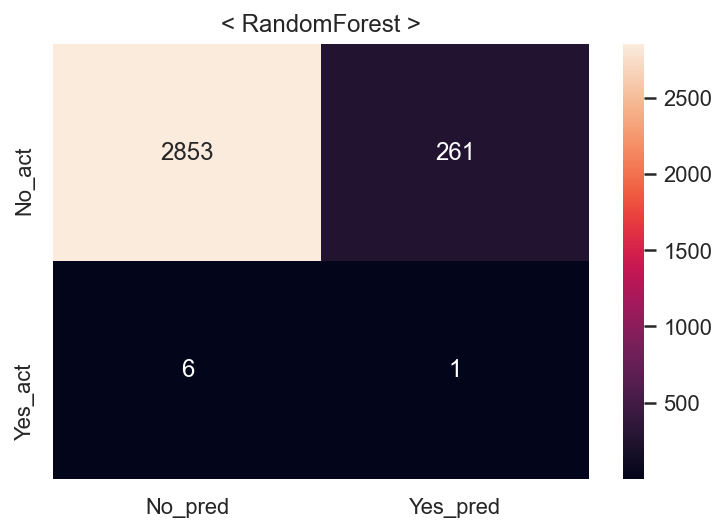

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


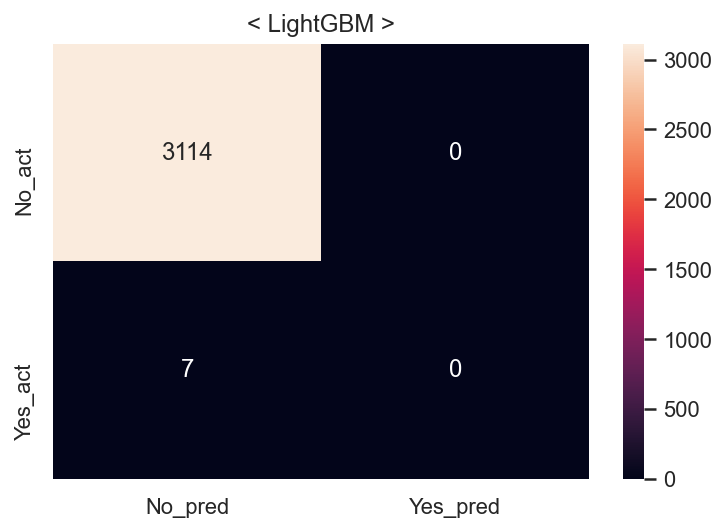

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


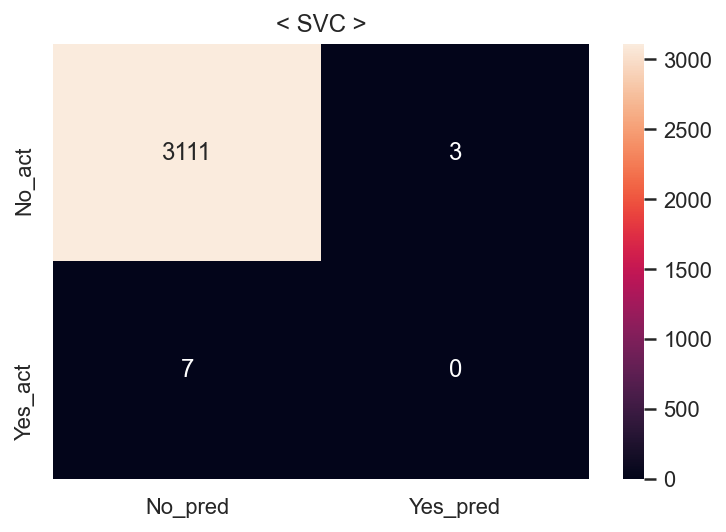

Fit time : 0.43 min


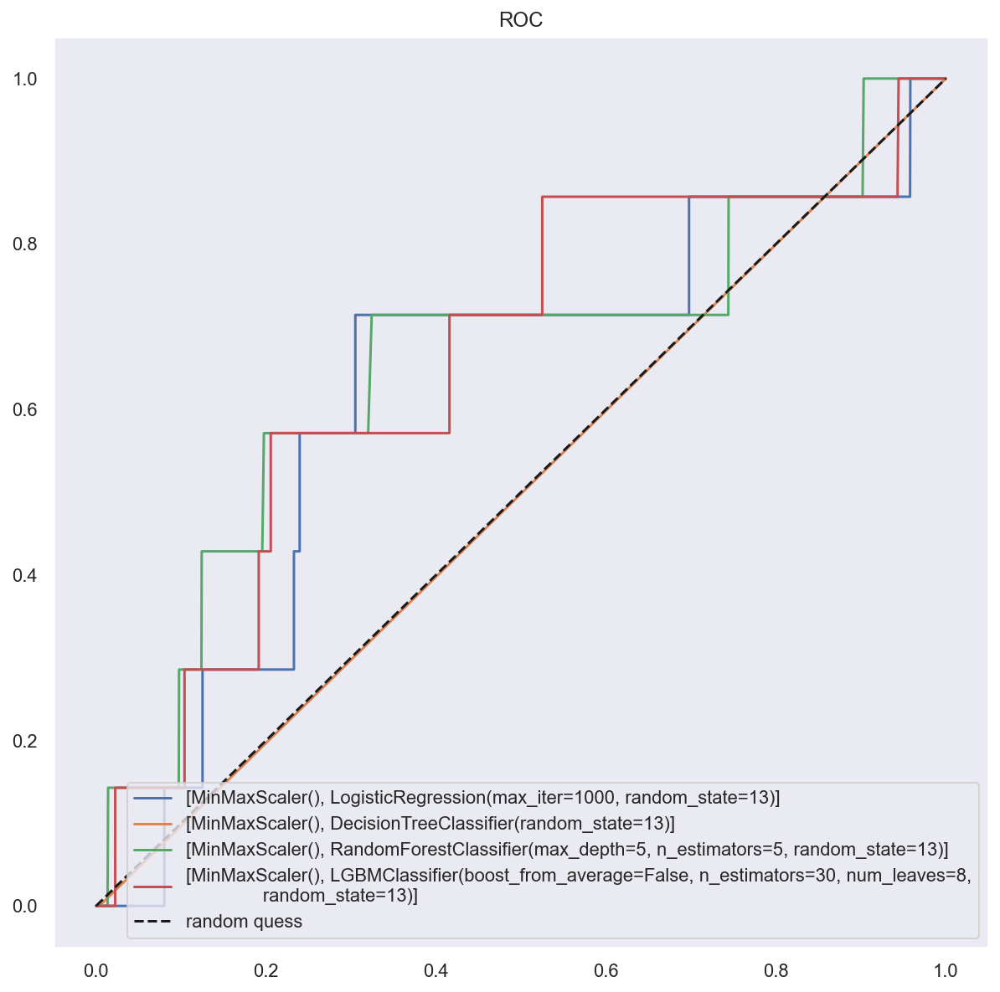

In [54]:
# 1hot
columns_1hot = socar_strange_index.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
socar_strange_1hot = pd.get_dummies(socar_strange_index, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list19, result_df19 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [102]:
result_df19["null_del"] = [0]  * len(result_df19)
result_df19["encoded"] = [1]  * len(result_df19)
result_df19["scaler"] = ["MM"]  * len(result_df19)
result_df19["sampler"] = ["SMOTE"]  * len(result_df19)
result_df19 = result_df19[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df19

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,1,MM,SMOTE,LogisticReg,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000
1,0,1,MM,SMOTE,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.993912,0.000000,0.000000,0.000000,0.498073
2,0,1,MM,SMOTE,RandomForest,0.966612,0.938689,0.998438,0.967642,0.966612,0.914450,0.003817,0.142857,0.007435,0.529521
3,0,1,MM,SMOTE,LightGBM,0.998633,0.999922,0.997345,0.998631,0.998633,0.997757,0.000000,0.000000,0.000000,0.500000
4,0,1,MM,SMOTE,SVC,0.999961,1.000000,0.999922,0.999961,0.999961,0.996796,0.000000,0.000000,0.000000,0.499518


## 스무번째
### (1) NULL값 유지, (2)데이터 분리, (3) ADASYN, (4) MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


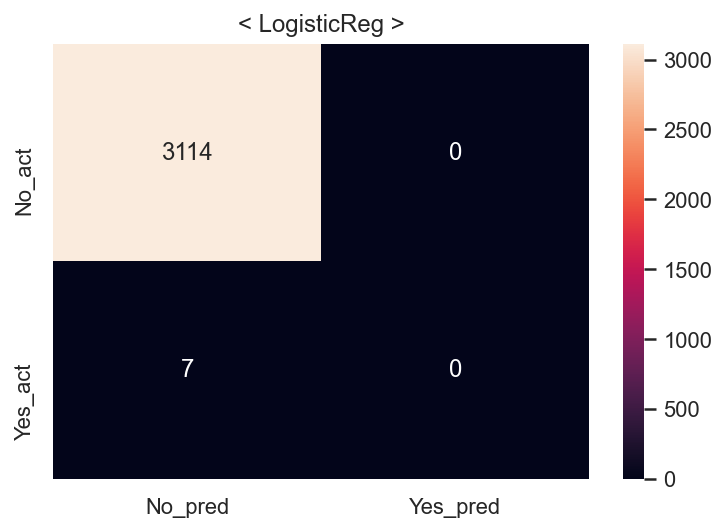

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


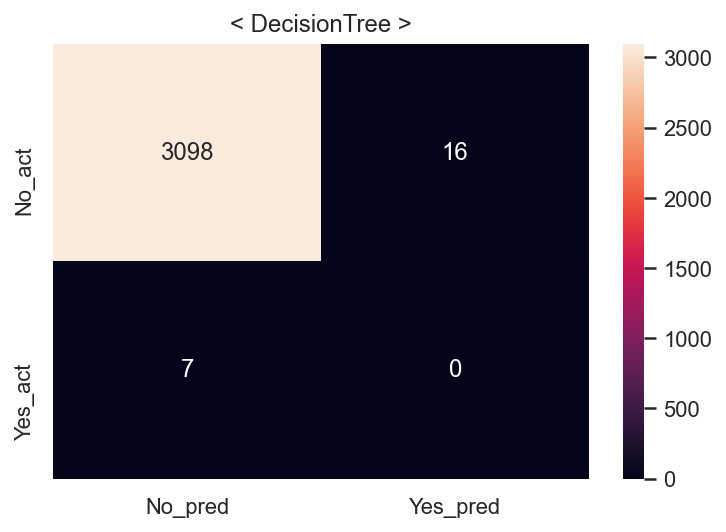

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


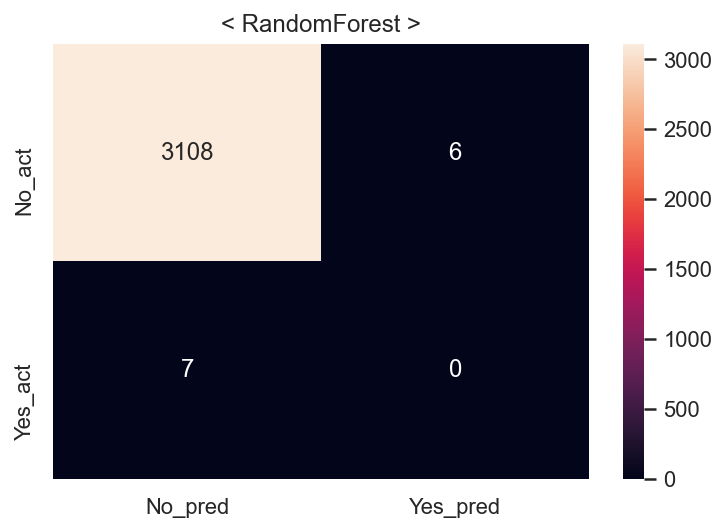

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


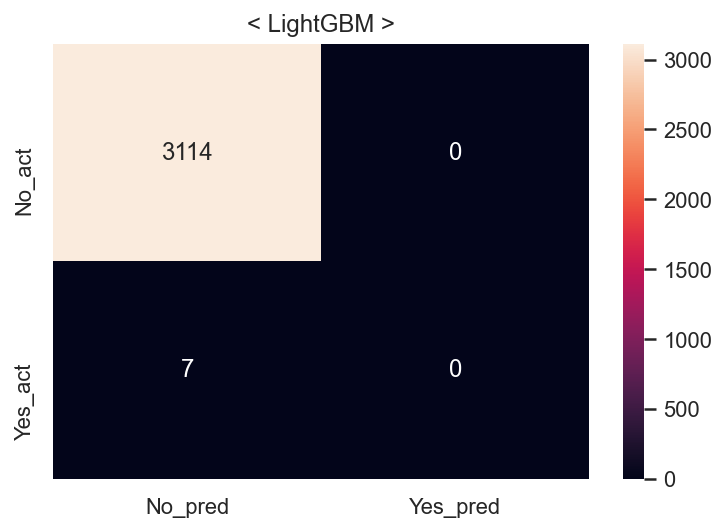

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


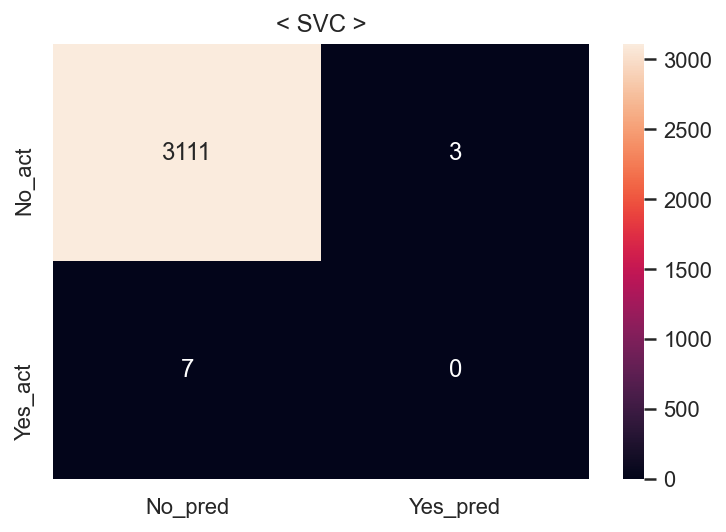

Fit time : 0.29 min


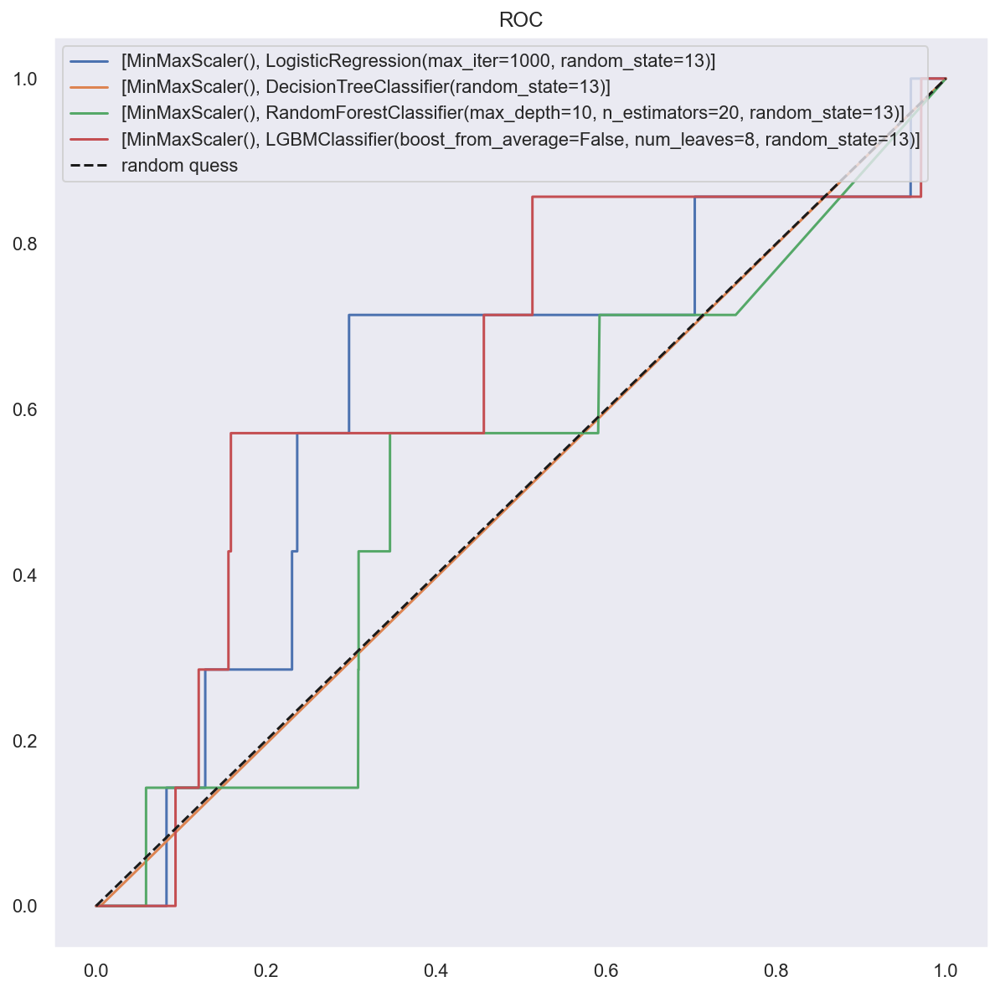

In [55]:
# 1hot
columns_1hot = socar_strange_index.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
socar_strange_1hot = pd.get_dummies(socar_strange_index, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list20, result_df20 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [103]:
result_df20["null_del"] = [0]  * len(result_df20)
result_df20["encoded"] = [1]  * len(result_df20)
result_df20["scaler"] = ["MM"]  * len(result_df20)
result_df20["sampler"] = ["ADASYN"]  * len(result_df20)
result_df20 = result_df20[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df20

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,1,MM,ADASYN,LogisticReg,0.998673,1.000000,0.997347,0.998672,0.998674,0.997757,0.0,0.0,0.0,0.500000
1,0,1,MM,ADASYN,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.992631,0.0,0.0,0.0,0.497431
2,0,1,MM,ADASYN,RandomForest,0.998712,0.998363,0.999064,0.998713,0.998712,0.995835,0.0,0.0,0.0,0.499037
3,0,1,MM,ADASYN,LightGBM,0.998673,1.000000,0.997347,0.998672,0.998674,0.997757,0.0,0.0,0.0,0.500000
4,0,1,MM,ADASYN,SVC,0.999961,1.000000,0.999922,0.999961,0.999961,0.996796,0.0,0.0,0.0,0.499518


## 스물한번째
### (1) NULL값 유지, (2)데이터 분리, (3) SMOTE, (4) Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


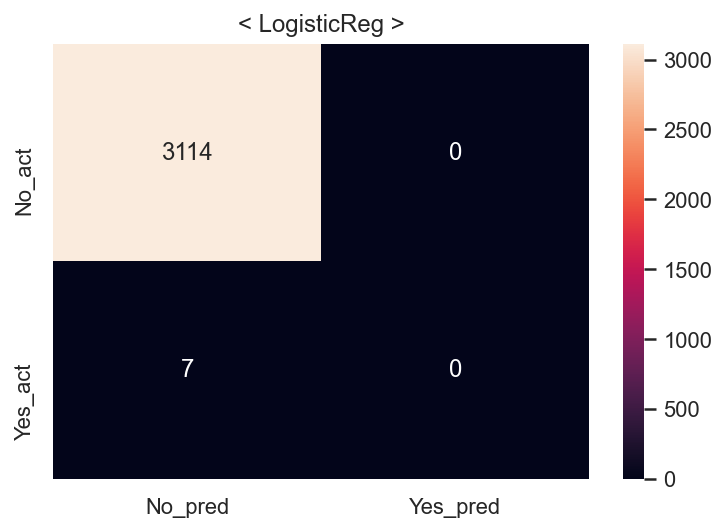

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


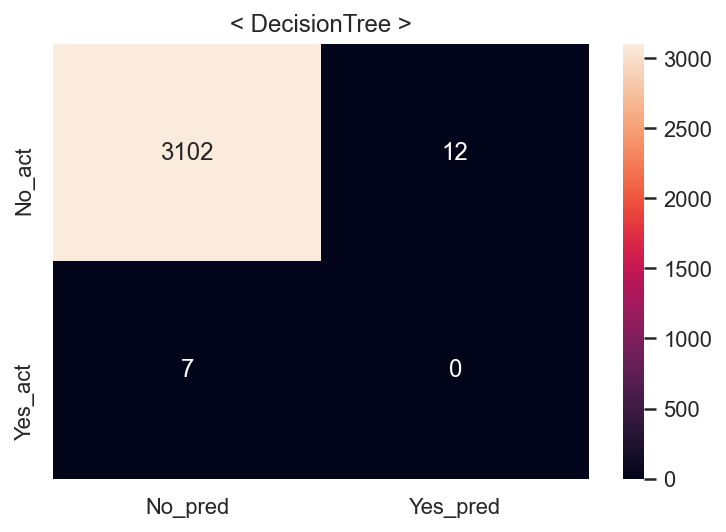

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


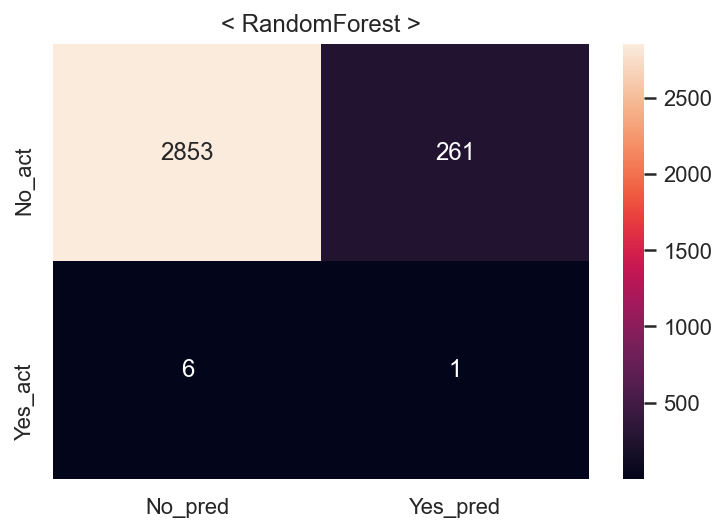

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


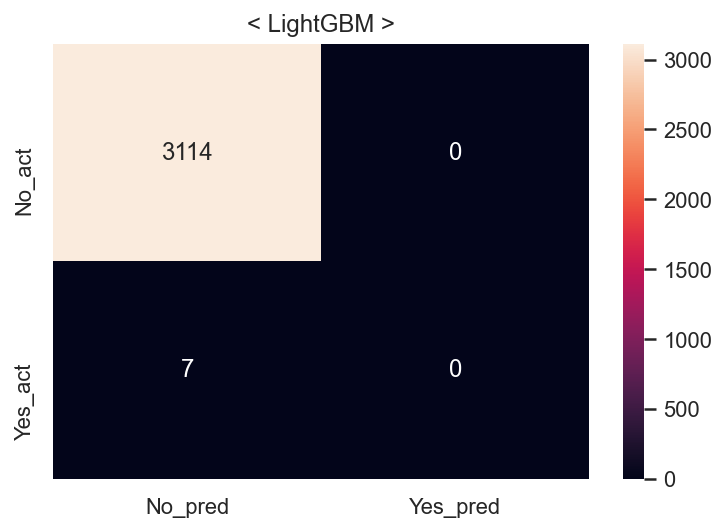

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


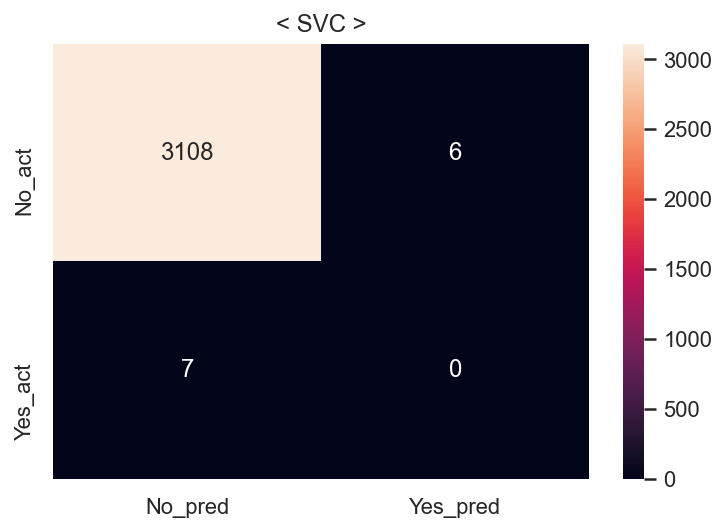

Fit time : 0.57 min


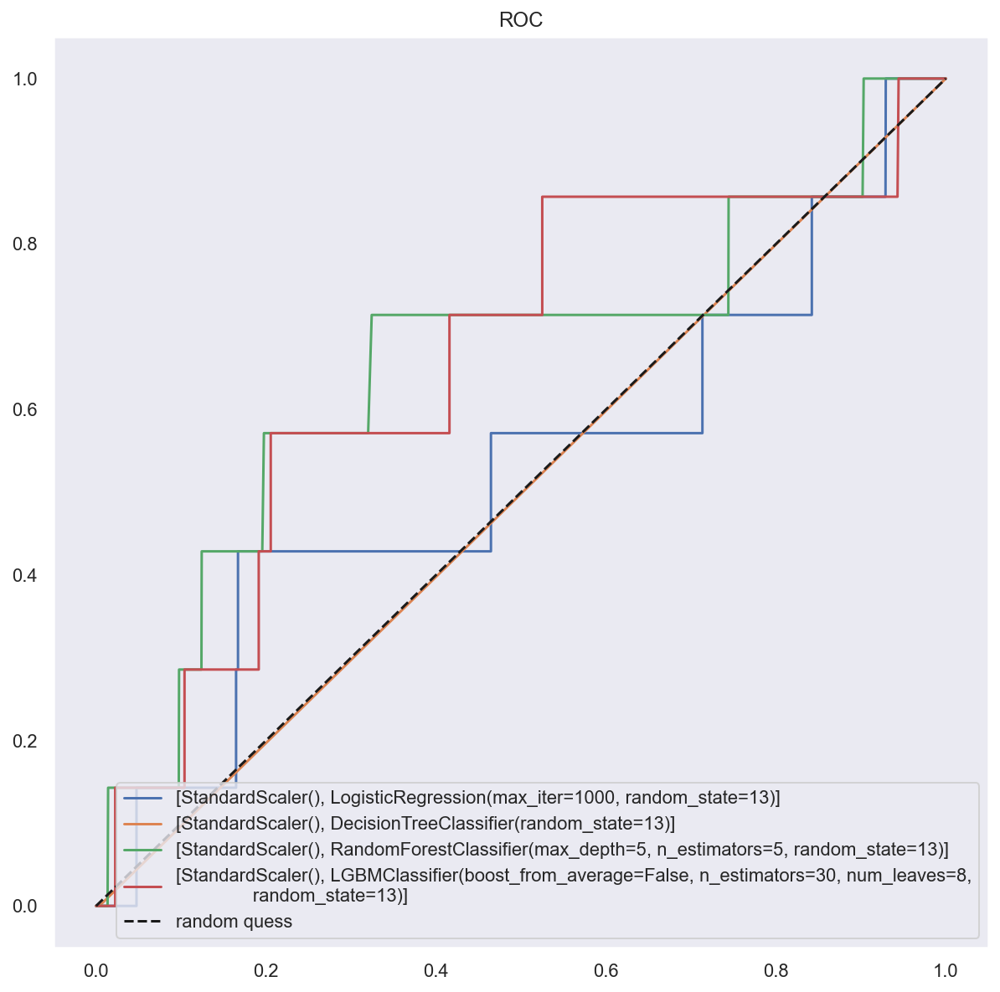

In [56]:
# 1hot
columns_1hot = socar_strange_index.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
socar_strange_1hot = pd.get_dummies(socar_strange_index, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list21, result_df21 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [104]:
result_df21["null_del"] = [0]  * len(result_df21)
result_df21["encoded"] = [1]  * len(result_df21)
result_df21["scaler"] = ["SD"]  * len(result_df21)
result_df21["sampler"] = ["SMOTE"]  * len(result_df21)
result_df21 = result_df21[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df21

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,1,SD,SMOTE,LogisticReg,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000
1,0,1,SD,SMOTE,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.993912,0.000000,0.000000,0.000000,0.498073
2,0,1,SD,SMOTE,RandomForest,0.966612,0.938689,0.998438,0.967642,0.966612,0.914450,0.003817,0.142857,0.007435,0.529521
3,0,1,SD,SMOTE,LightGBM,0.998633,0.999922,0.997345,0.998631,0.998633,0.997757,0.000000,0.000000,0.000000,0.500000
4,0,1,SD,SMOTE,SVC,0.999883,1.000000,0.999766,0.999883,0.999883,0.995835,0.000000,0.000000,0.000000,0.499037


## 스물두번째
### (1) NULL값 유지, (2)데이터 분리, (3) ADASYN, (4) Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


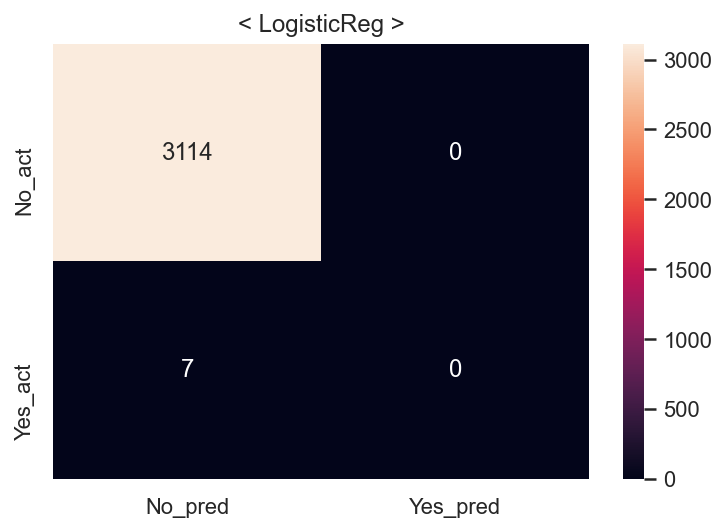

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


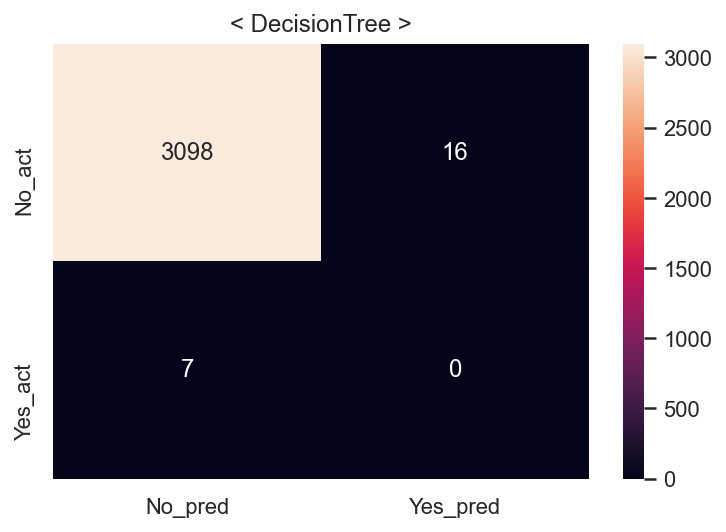

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


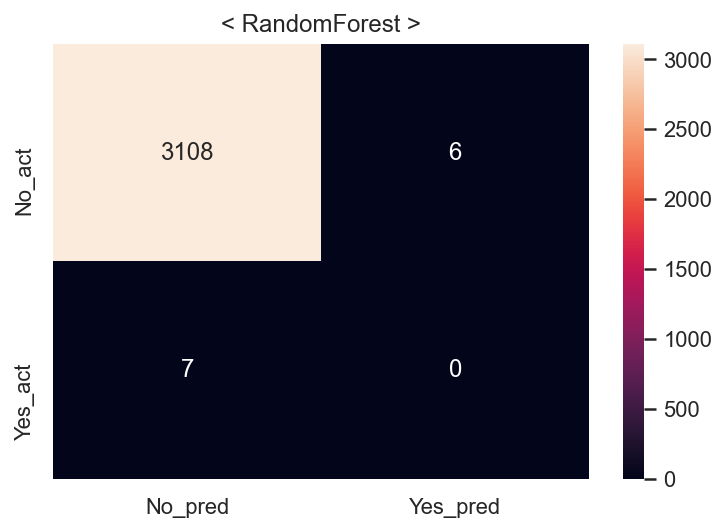

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


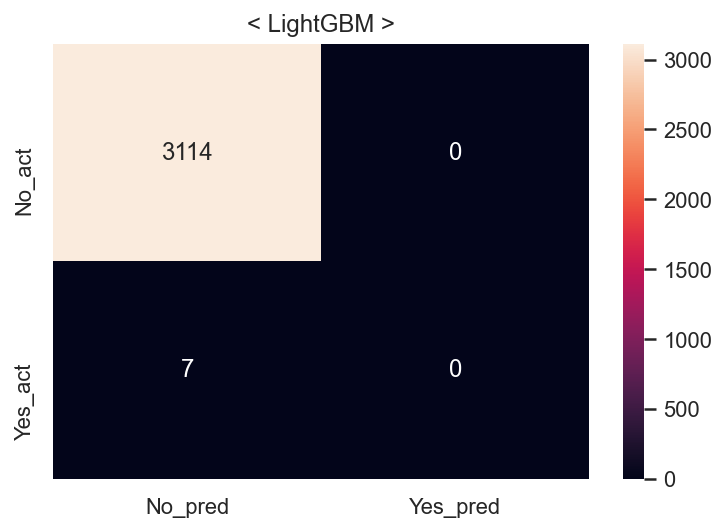

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


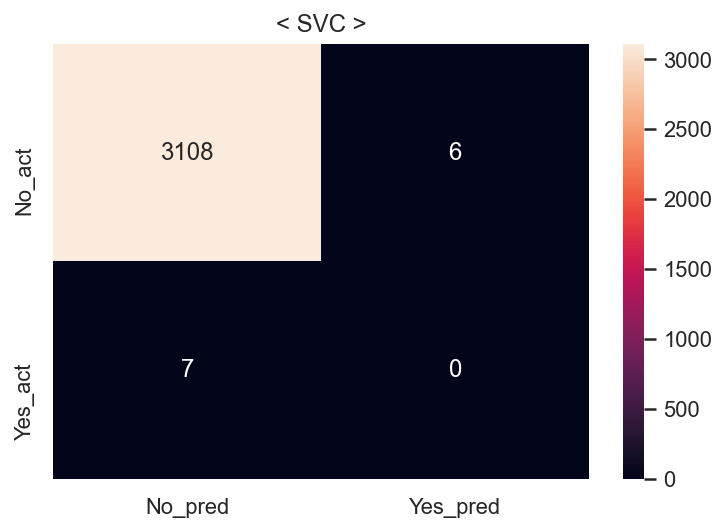

Fit time : 0.56 min


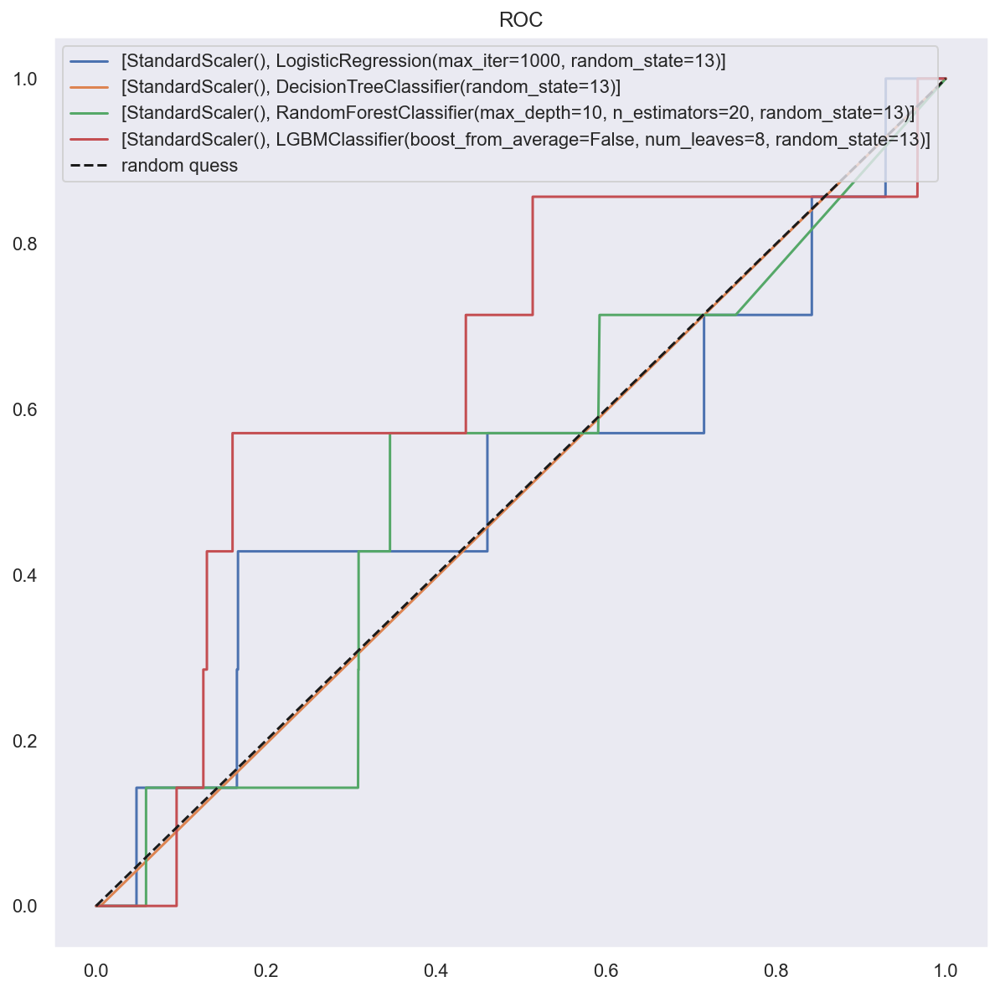

In [57]:
# 1hot
columns_1hot = socar_strange_index.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
socar_strange_1hot = pd.get_dummies(socar_strange_index, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list22, result_df22 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [105]:
result_df22["null_del"] = [0]  * len(result_df22)
result_df22["encoded"] = [1]  * len(result_df22)
result_df22["scaler"] = ["SD"]  * len(result_df22)
result_df22["sampler"] = ["ADASYN"]  * len(result_df22)
result_df22 = result_df22[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df22

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,1,SD,ADASYN,LogisticReg,0.998673,1.000000,0.997347,0.998672,0.998674,0.997757,0.0,0.0,0.0,0.500000
1,0,1,SD,ADASYN,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.992631,0.0,0.0,0.0,0.497431
2,0,1,SD,ADASYN,RandomForest,0.998712,0.998363,0.999064,0.998713,0.998712,0.995835,0.0,0.0,0.0,0.499037
3,0,1,SD,ADASYN,LightGBM,0.998673,1.000000,0.997347,0.998672,0.998674,0.997757,0.0,0.0,0.0,0.500000
4,0,1,SD,ADASYN,SVC,0.999883,1.000000,0.999766,0.999883,0.999883,0.995835,0.0,0.0,0.0,0.499037


## 스물세번째
### (1) NULL값 유지, (2)데이터 분리, (3) SMOTE, (4) Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.6s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


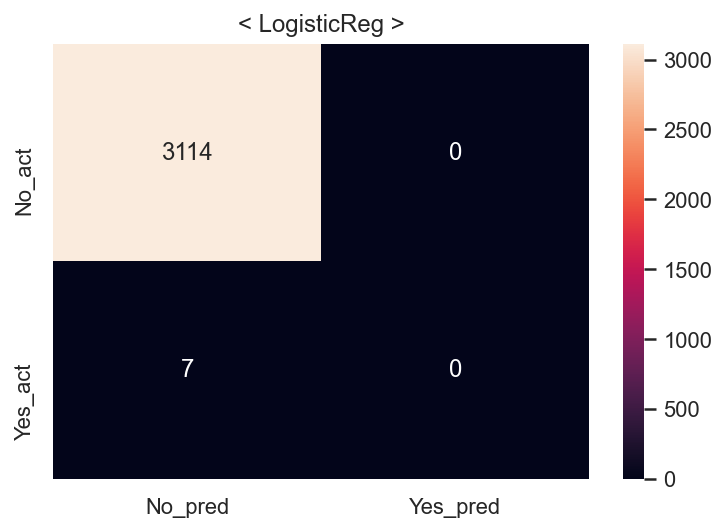

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


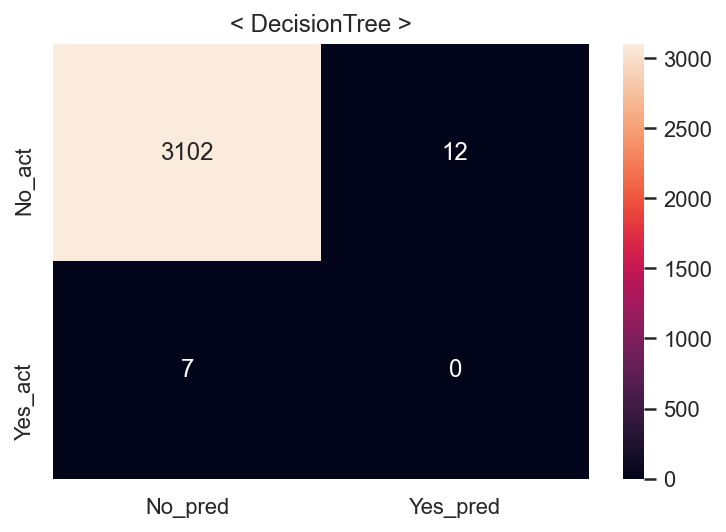

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


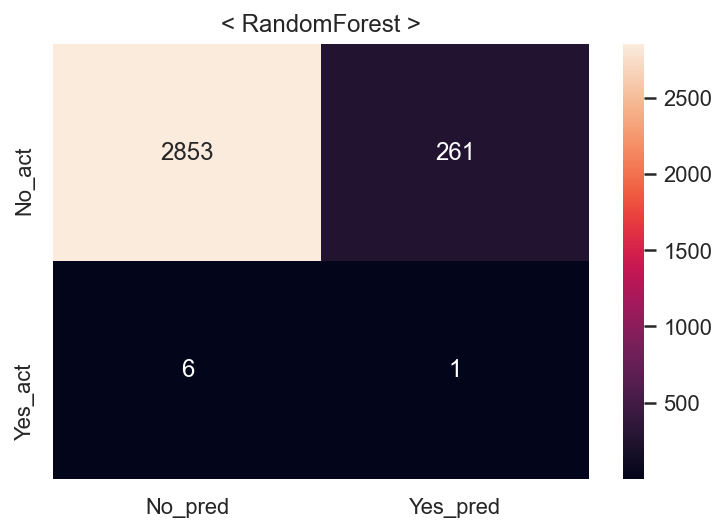

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


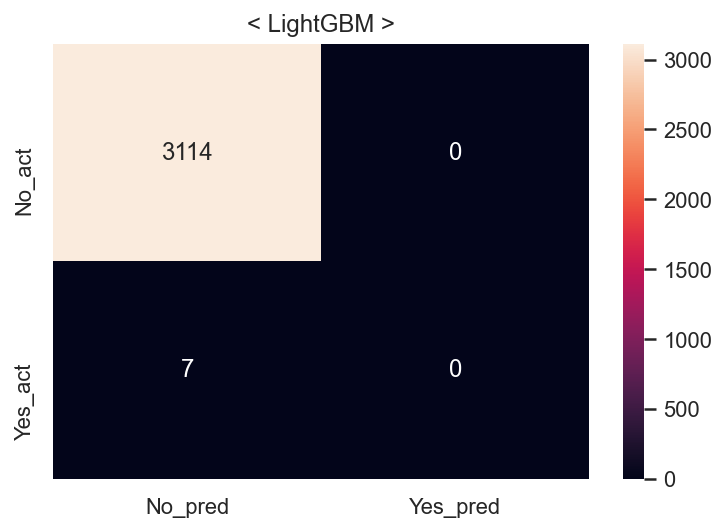

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


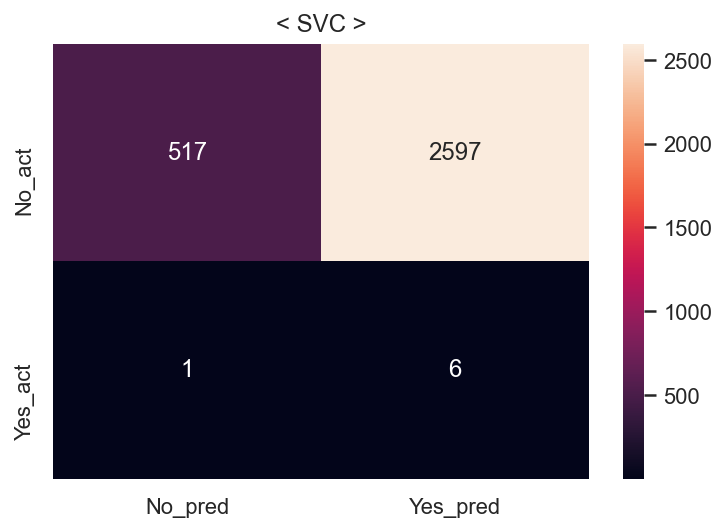

Fit time : 2.87 min


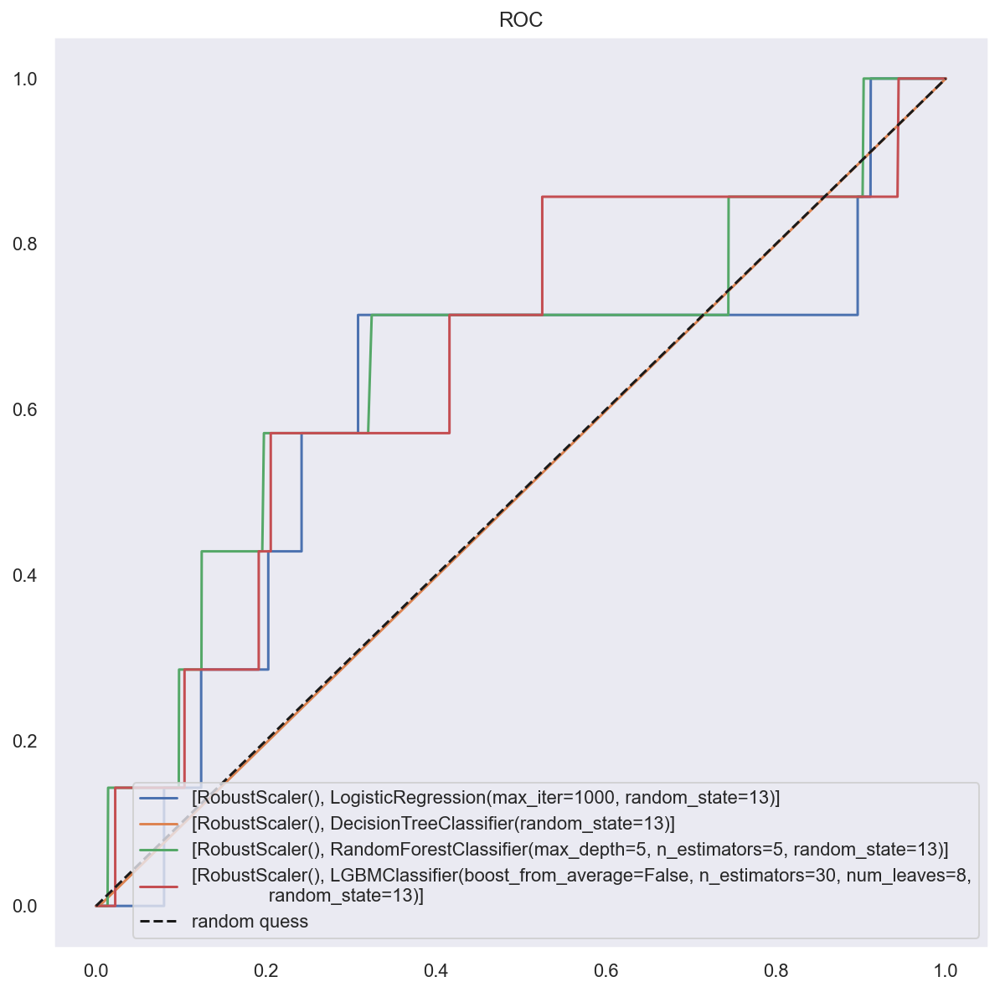

In [58]:
# 1hot
columns_1hot = socar_strange_index.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
socar_strange_1hot = pd.get_dummies(socar_strange_index, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list23, result_df23 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [106]:
result_df23["null_del"] = [0]  * len(result_df23)
result_df23["encoded"] = [1]  * len(result_df23)
result_df23["scaler"] = ["RB"]  * len(result_df23)
result_df23["sampler"] = ["SMOTE"]  * len(result_df23)
result_df23 = result_df23[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df23

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,1,RB,SMOTE,LogisticReg,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000
1,0,1,RB,SMOTE,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.993912,0.000000,0.000000,0.000000,0.498073
2,0,1,RB,SMOTE,RandomForest,0.966612,0.938689,0.998438,0.967642,0.966612,0.914450,0.003817,0.142857,0.007435,0.529521
3,0,1,RB,SMOTE,LightGBM,0.998633,0.999922,0.997345,0.998631,0.998633,0.997757,0.000000,0.000000,0.000000,0.500000
4,0,1,RB,SMOTE,SVC,0.579194,0.543006,0.999922,0.703810,0.579194,0.167574,0.002305,0.857143,0.004598,0.511584


## 스물네번째
### (1) NULL값 유지, (2)데이터 분리, (3) ADASYN, (4) Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.6s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


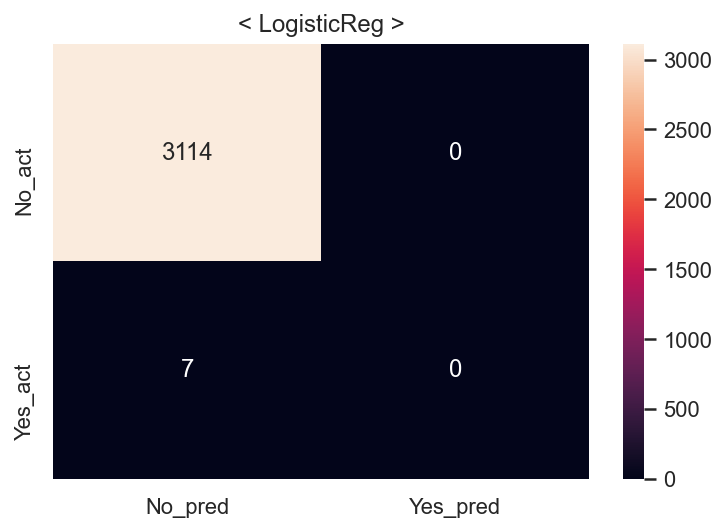

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


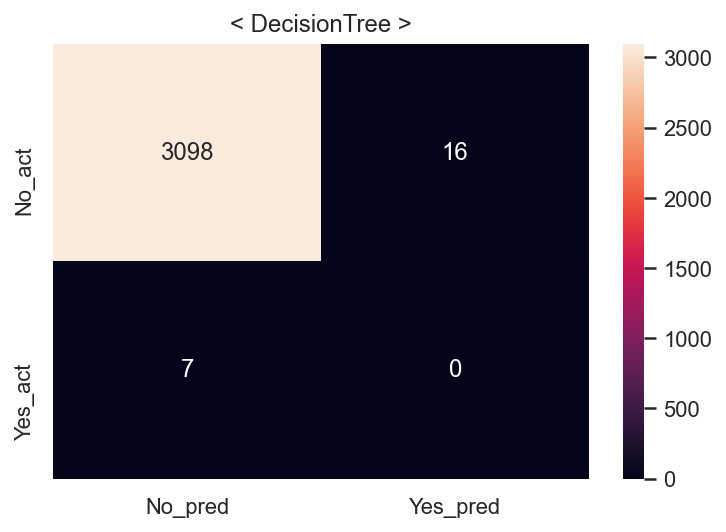

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


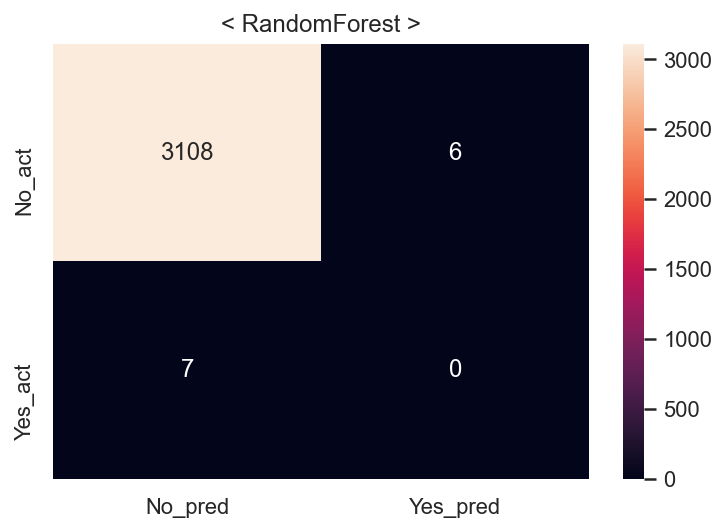

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


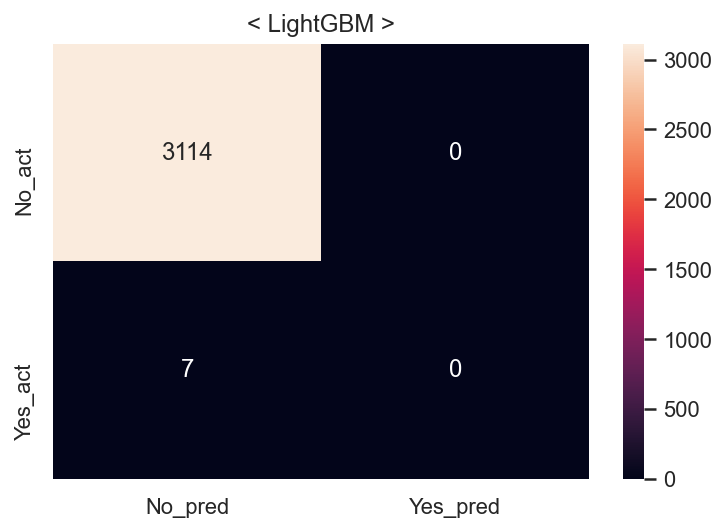

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


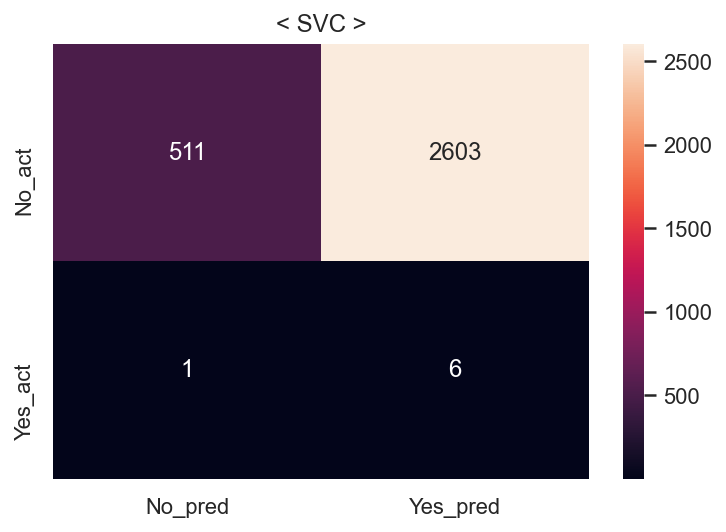

Fit time : 2.82 min


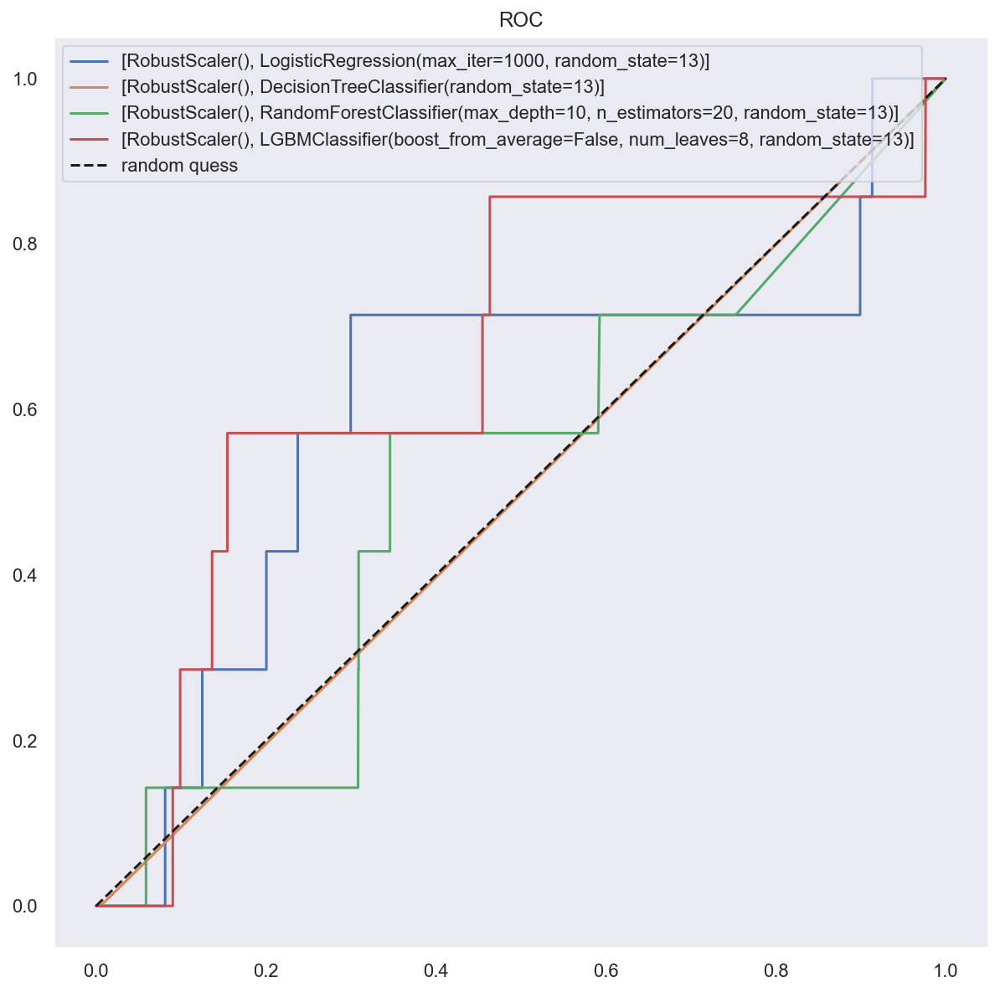

In [59]:
# 1hot
columns_1hot = socar_strange_index.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
socar_strange_1hot = pd.get_dummies(socar_strange_index, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list24, result_df24 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [107]:
result_df24["null_del"] = [0]  * len(result_df24)
result_df24["encoded"] = [1]  * len(result_df24)
result_df24["scaler"] = ["RB"]  * len(result_df24)
result_df24["sampler"] = ["ADASYN"]  * len(result_df24)
result_df24 = result_df24[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df24

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,1,RB,ADASYN,LogisticReg,0.998673,1.000000,0.997347,0.998672,0.998674,0.997757,0.0000,0.000000,0.000000,0.500000
1,0,1,RB,ADASYN,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.992631,0.0000,0.000000,0.000000,0.497431
2,0,1,RB,ADASYN,RandomForest,0.998712,0.998363,0.999064,0.998713,0.998712,0.995835,0.0000,0.000000,0.000000,0.499037
3,0,1,RB,ADASYN,LightGBM,0.998673,1.000000,0.997347,0.998672,0.998674,0.997757,0.0000,0.000000,0.000000,0.500000
4,0,1,RB,ADASYN,SVC,0.579112,0.543093,0.999922,0.703883,0.578882,0.165652,0.0023,0.857143,0.004587,0.510620


## 스물다섯번째
### (1) NULL값 삭제, (2)데이터 분리, (3) SMOTE, (4) 스케일링 없음

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.9s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


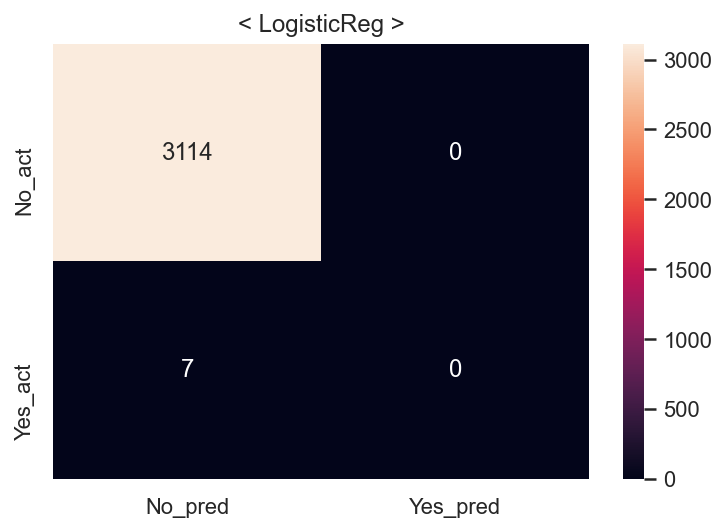

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


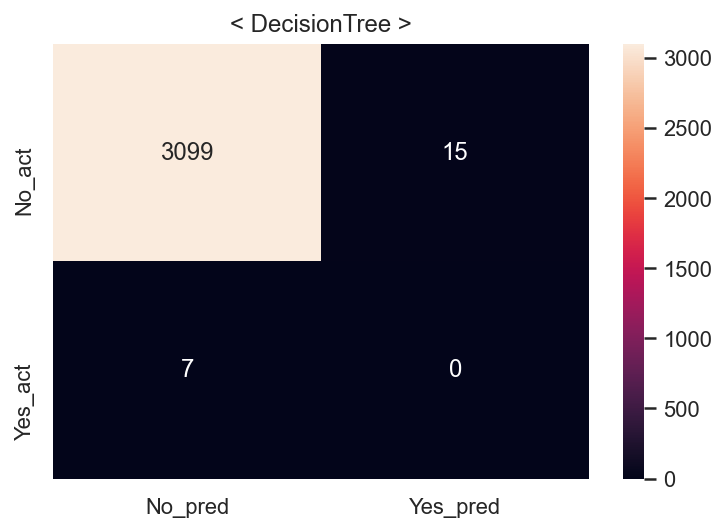

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


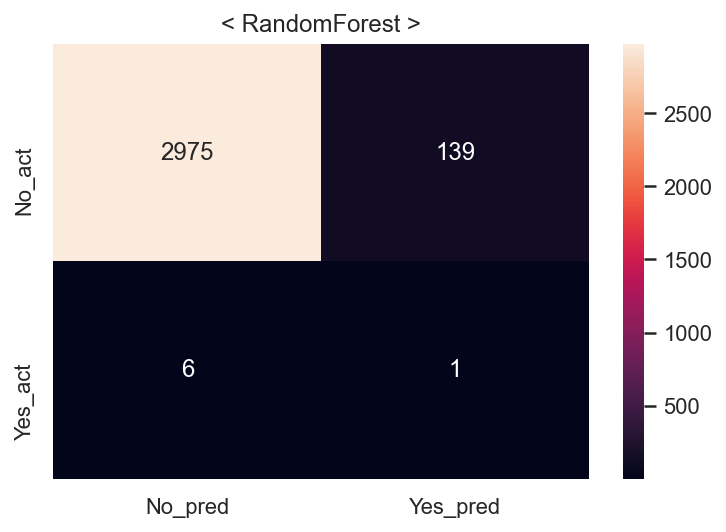

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


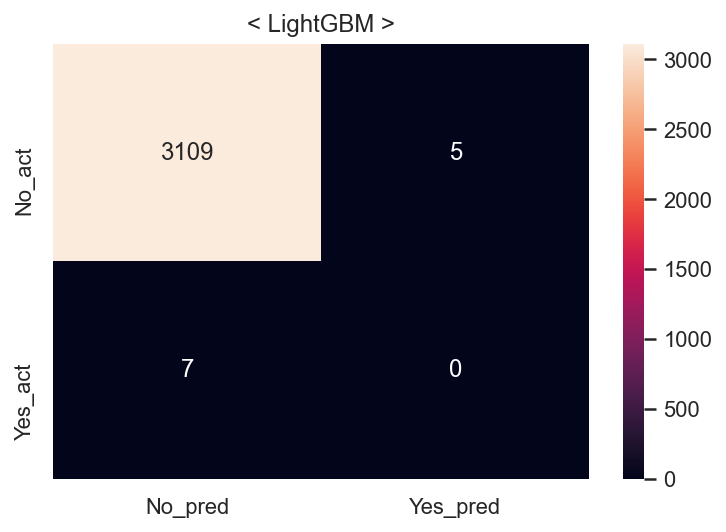

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


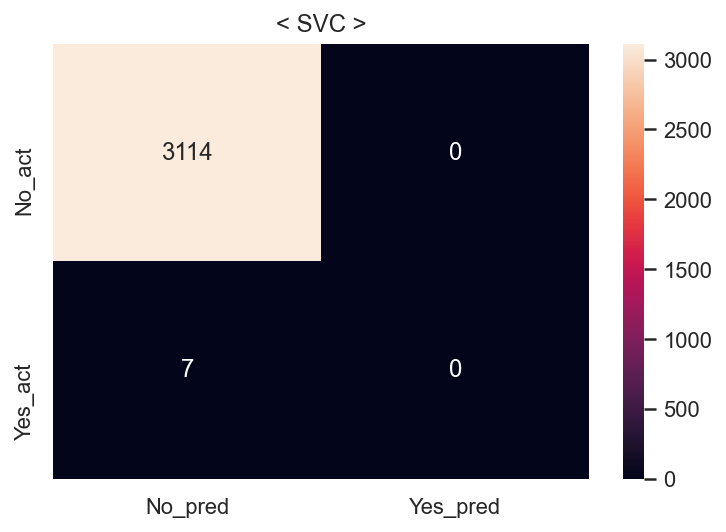

Fit time : 0.89 min


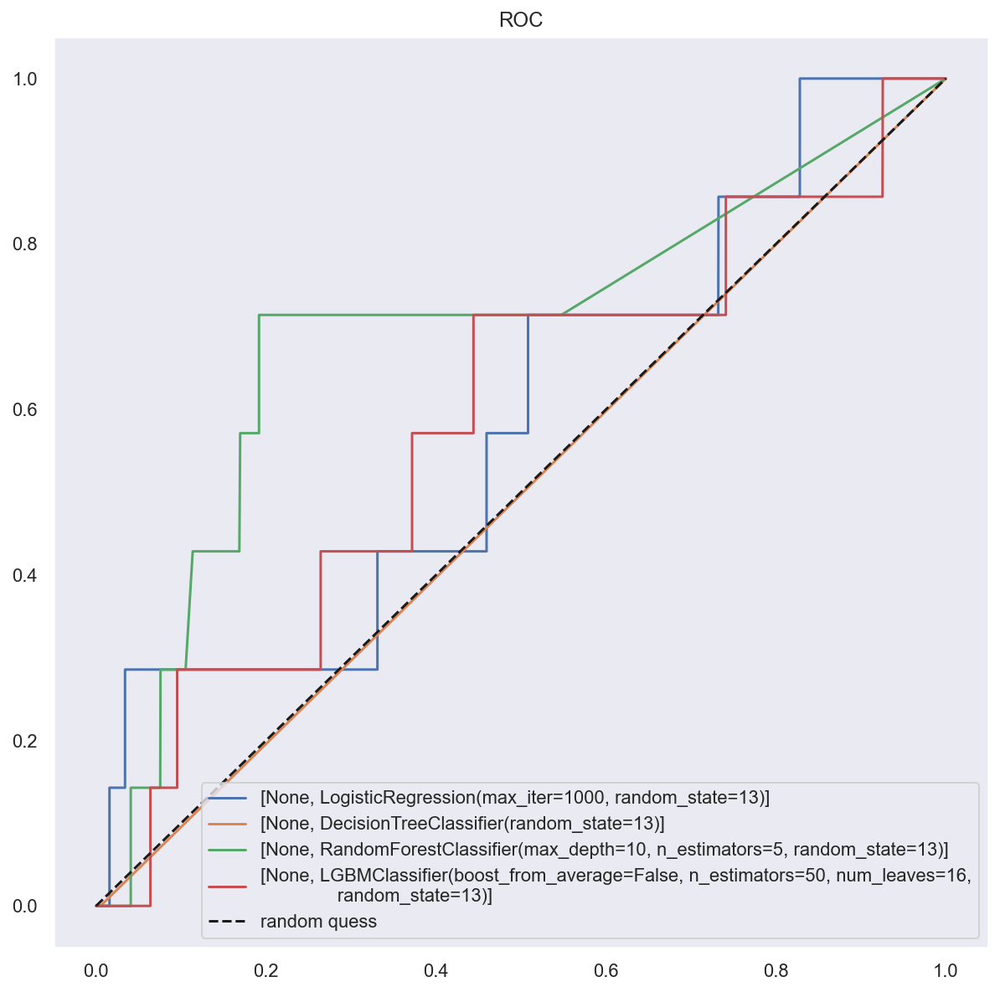

In [73]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list25, result_df25 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [108]:
result_df25["null_del"] = [1]  * len(result_df25)
result_df25["encoded"] = [1]  * len(result_df25)
result_df25["scaler"] = ["None"]  * len(result_df25)
result_df25["sampler"] = ["SMOTE"]  * len(result_df25)
result_df25 = result_df25[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df25

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,None,SMOTE,LogisticReg,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000
1,1,1,None,SMOTE,DecisionTree,0.999883,1.000000,0.999766,0.999883,0.999883,0.992951,0.000000,0.000000,0.000000,0.497592
2,1,1,None,SMOTE,RandomForest,0.980045,0.962386,0.999141,0.980419,0.980045,0.953541,0.007143,0.142857,0.013605,0.549110
3,1,1,None,SMOTE,LightGBM,0.998477,0.999218,0.997735,0.998476,0.998477,0.996155,0.000000,0.000000,0.000000,0.499197
4,1,1,None,SMOTE,SVC,0.985669,1.000000,0.971337,0.985460,0.985669,0.997757,0.000000,0.000000,0.000000,0.500000


## 스물여섯번째
### (1) NULL값 삭제, (2)데이터 분리, (3) ADASYN, (4) 스케일링 없음

In [62]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12794]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.7s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


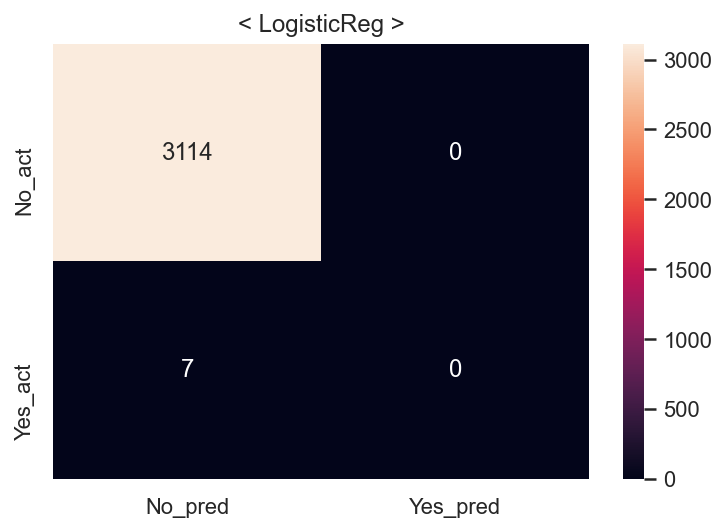

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


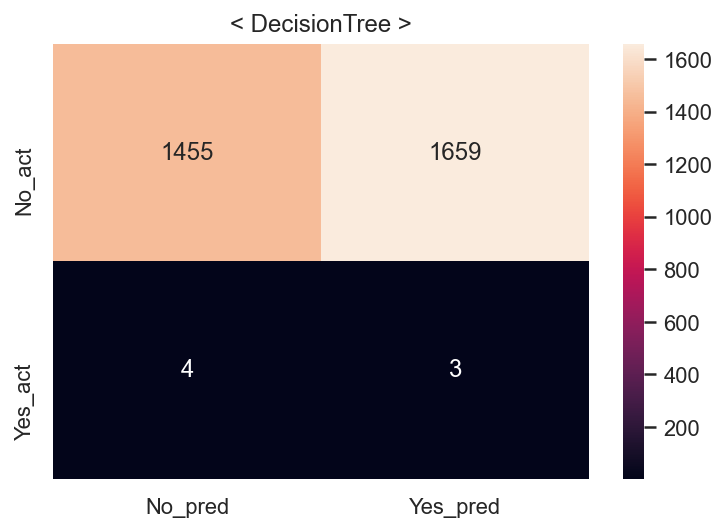

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


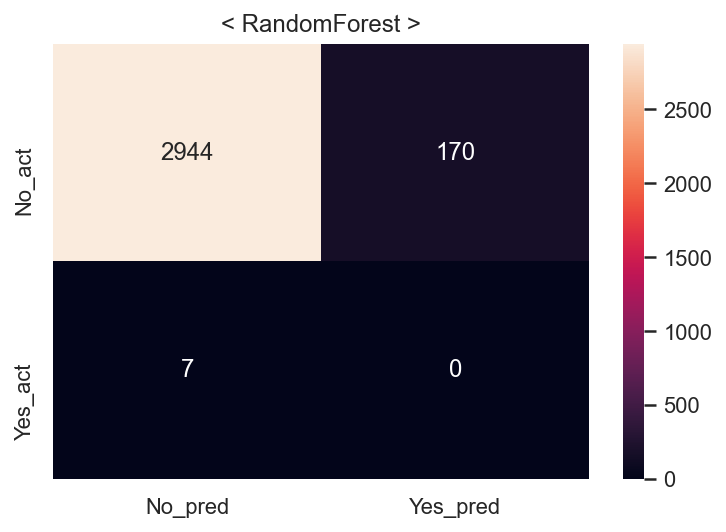

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


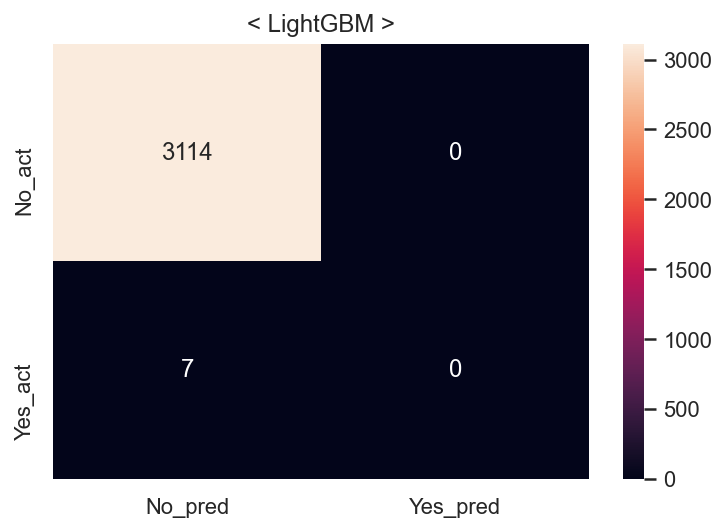

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


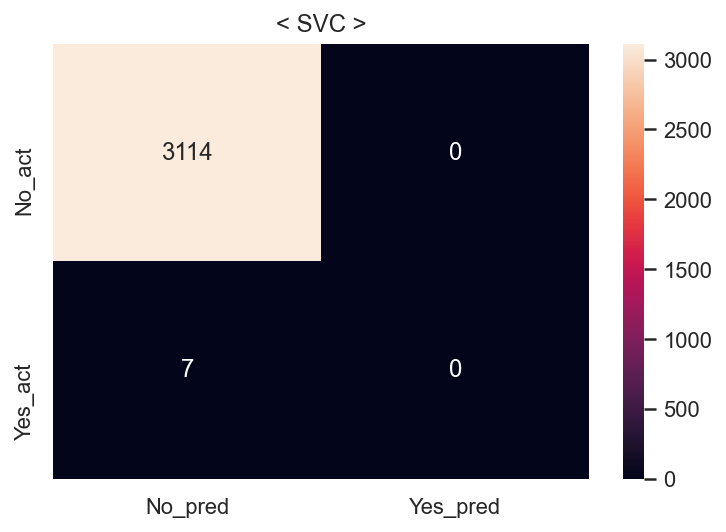

Fit time : 0.79 min


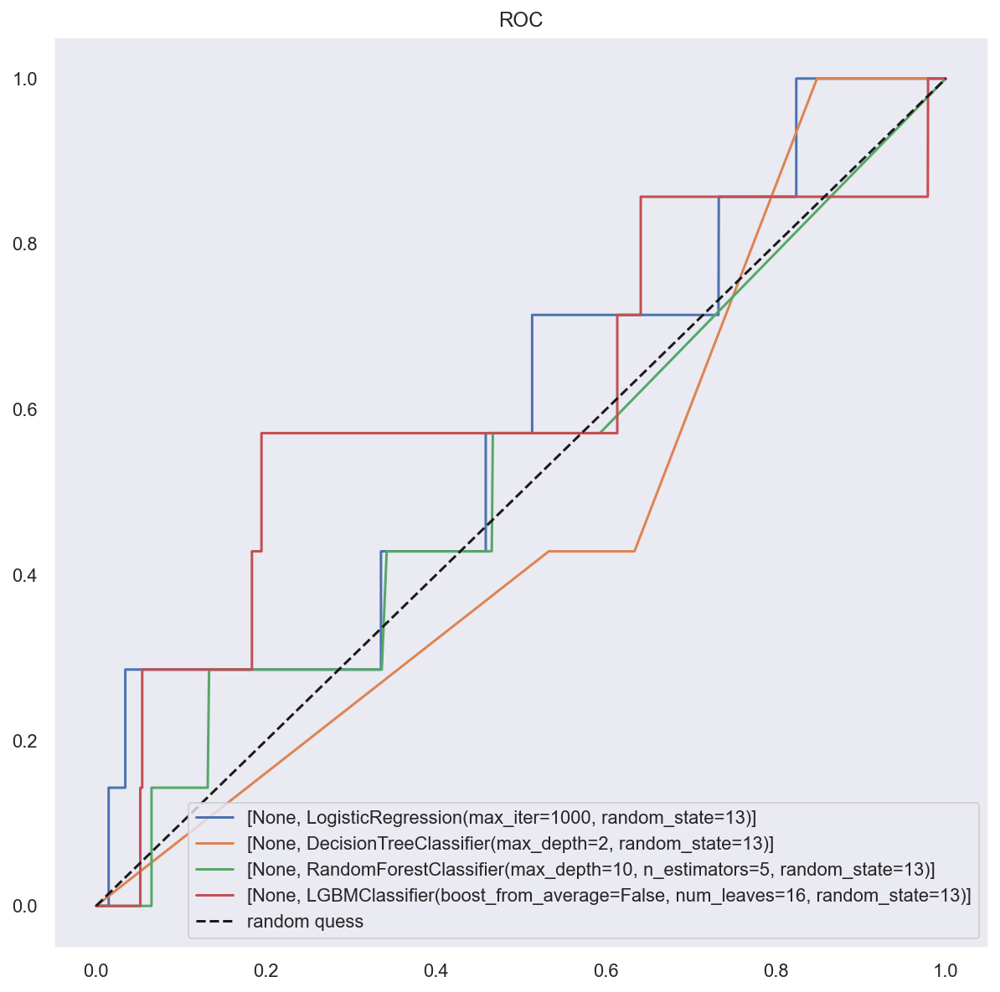

In [74]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list26, result_df26 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [109]:
result_df26["null_del"] = [1]  * len(result_df26)
result_df26["encoded"] = [1]  * len(result_df26)
result_df26["scaler"] = ["None"]  * len(result_df26)
result_df26["sampler"] = ["ADASYN"]  * len(result_df26)
result_df26 = result_df26[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df26

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,None,ADASYN,LogisticReg,0.998672,1.000000,0.997343,0.998669,0.998671,0.997757,0.000000,0.000000,0.000000,0.500000
1,1,1,None,ADASYN,DecisionTree,0.766193,0.707985,0.905815,0.794774,0.766247,0.467158,0.001805,0.428571,0.003595,0.447908
2,1,1,None,ADASYN,RandomForest,0.974256,0.952023,0.998828,0.974864,0.974265,0.943287,0.000000,0.000000,0.000000,0.472704
3,1,1,None,ADASYN,LightGBM,0.998828,1.000000,0.997655,0.998826,0.998828,0.997757,0.000000,0.000000,0.000000,0.500000
4,1,1,None,ADASYN,SVC,0.984921,1.000000,0.969830,0.984684,0.984915,0.997757,0.000000,0.000000,0.000000,0.500000


## 스물일곱번째
### (1) NULL값 삭제, (2)데이터 분리, (3) SMOTE, (4) MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


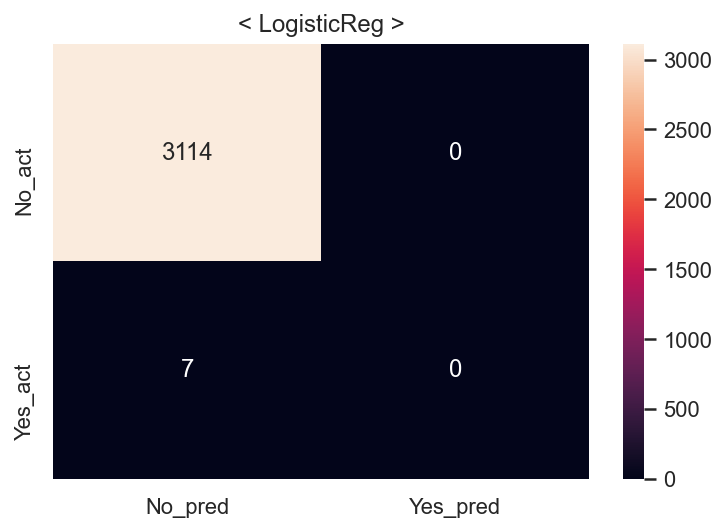

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


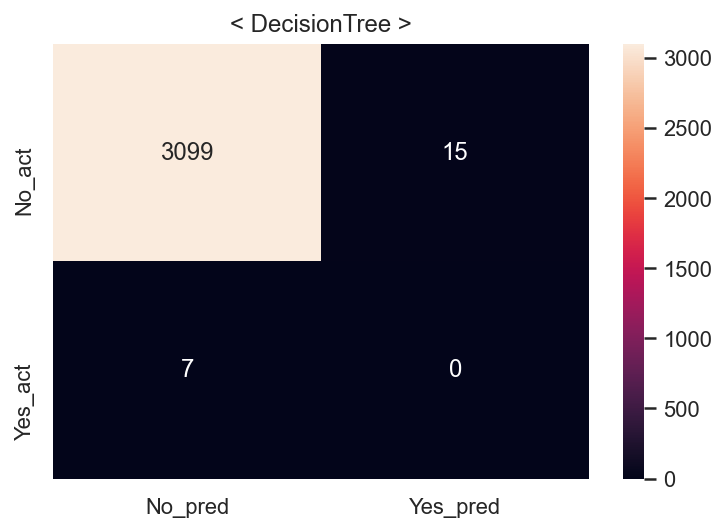

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


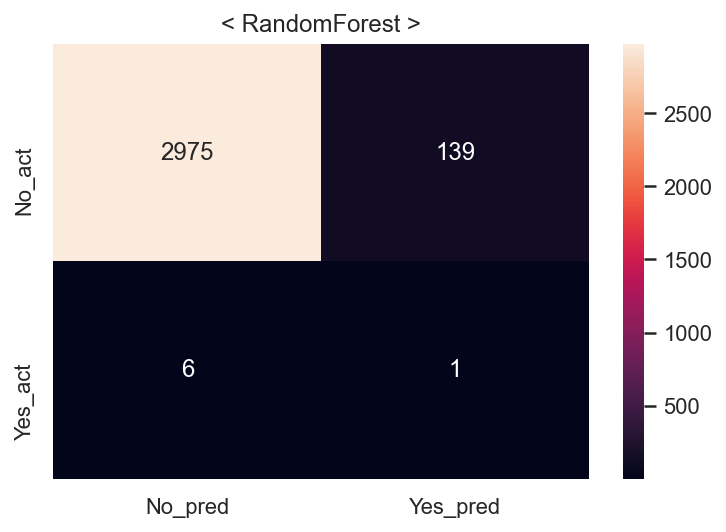

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


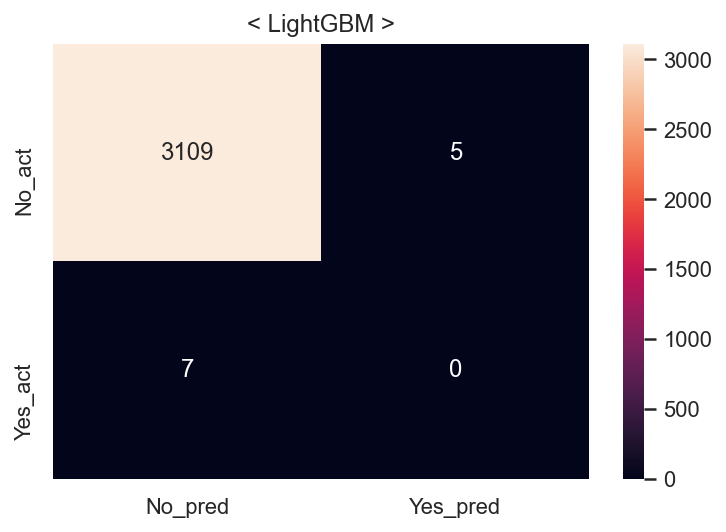

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


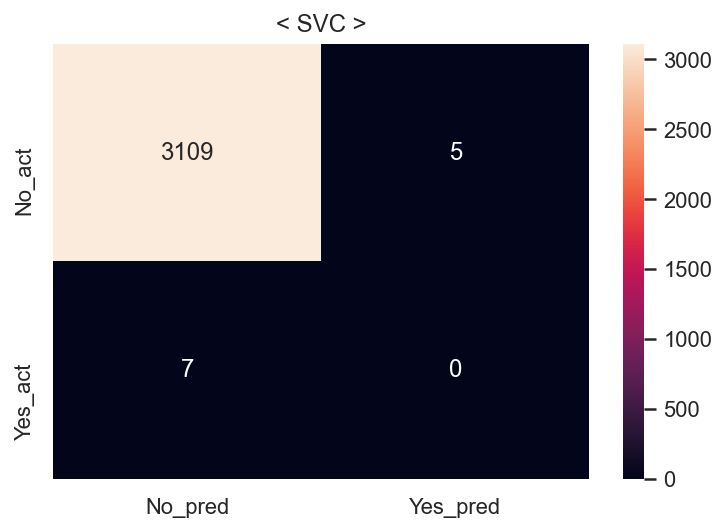

Fit time : 0.25 min


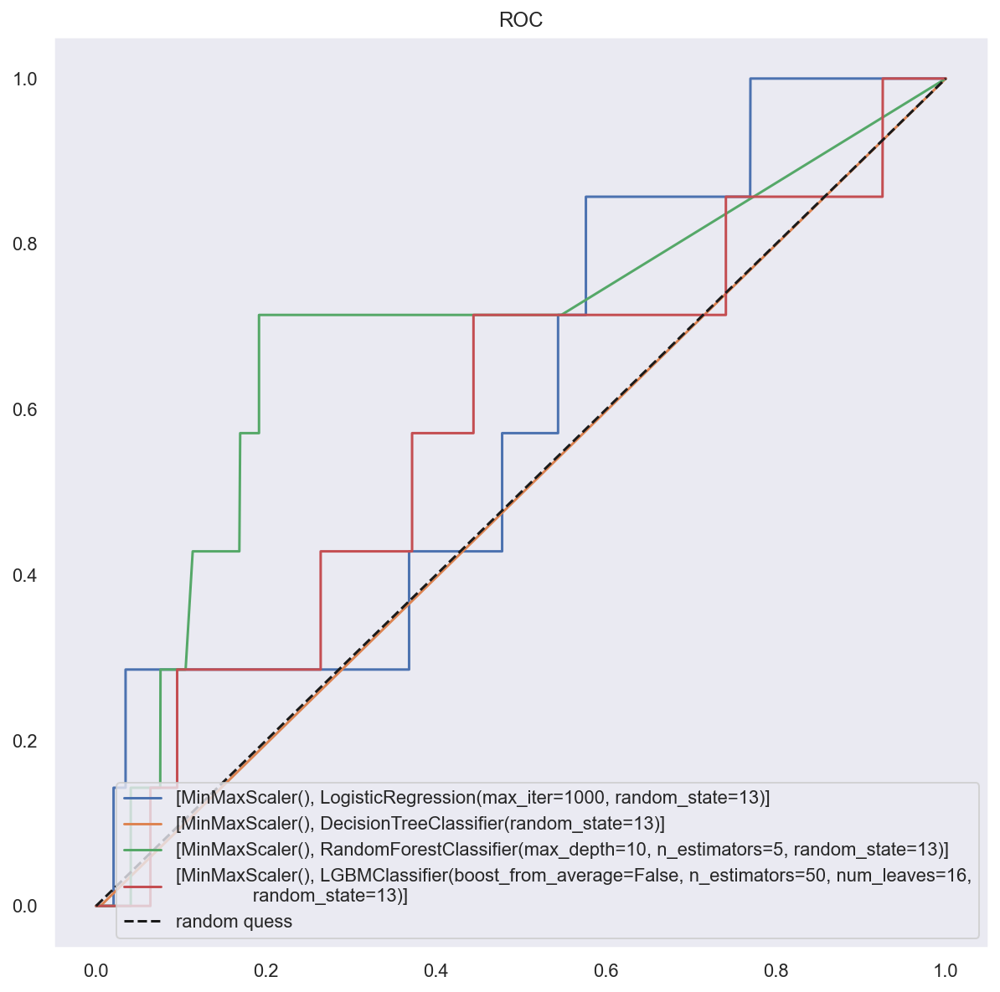

In [75]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list27, result_df27 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [110]:
result_df27["null_del"] = [1]  * len(result_df27)
result_df27["encoded"] = [1]  * len(result_df27)
result_df27["scaler"] = ["MM"]  * len(result_df27)
result_df27["sampler"] = ["SMOTE"]  * len(result_df27)
result_df27 = result_df27[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df27

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,MM,SMOTE,LogisticReg,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000
1,1,1,MM,SMOTE,DecisionTree,0.999883,1.000000,0.999766,0.999883,0.999883,0.992951,0.000000,0.000000,0.000000,0.497592
2,1,1,MM,SMOTE,RandomForest,0.980045,0.962386,0.999141,0.980419,0.980045,0.953541,0.007143,0.142857,0.013605,0.549110
3,1,1,MM,SMOTE,LightGBM,0.998477,0.999218,0.997735,0.998476,0.998477,0.996155,0.000000,0.000000,0.000000,0.499197
4,1,1,MM,SMOTE,SVC,0.999844,1.000000,0.999688,0.999844,0.999844,0.996155,0.000000,0.000000,0.000000,0.499197


## 스물여덟번째
### (1) NULL값 삭제, (2)데이터 분리, (3) ADASYN, (4) MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12794]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


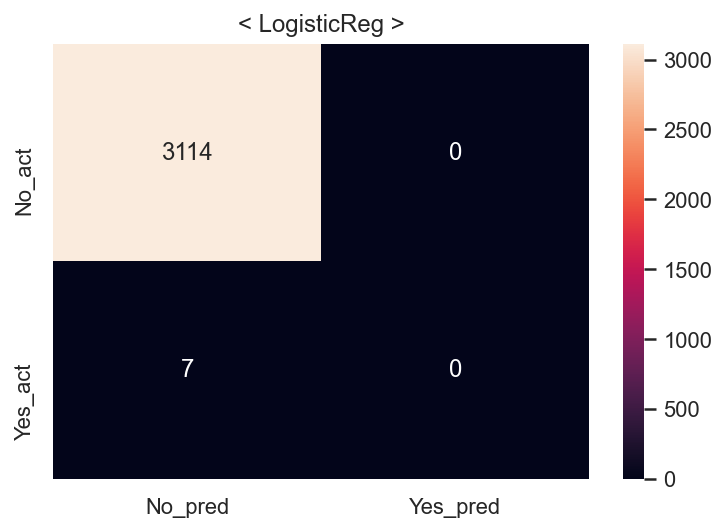

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


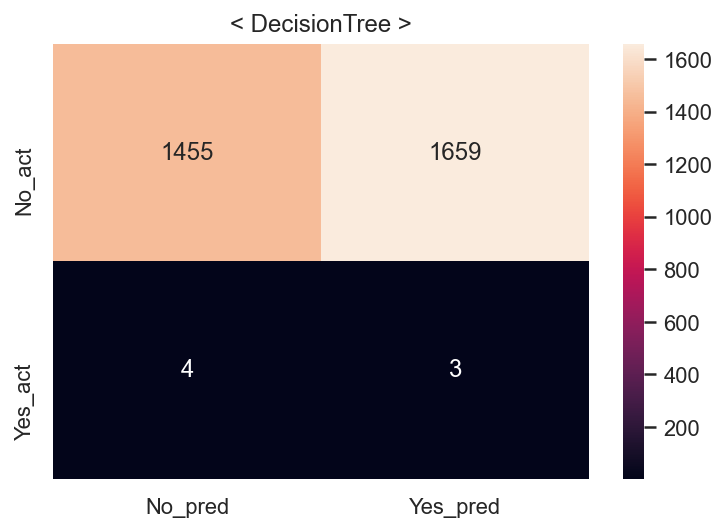

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


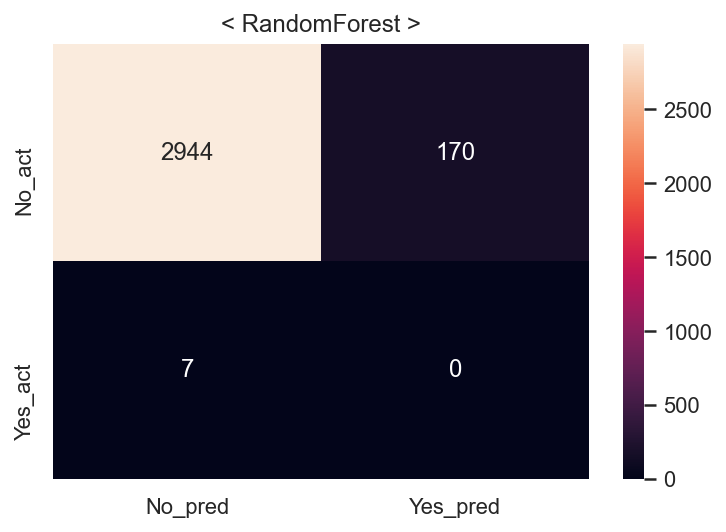

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


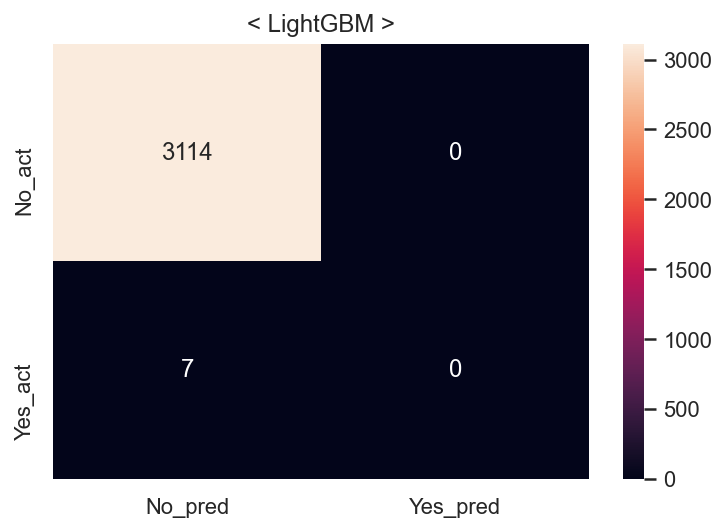

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


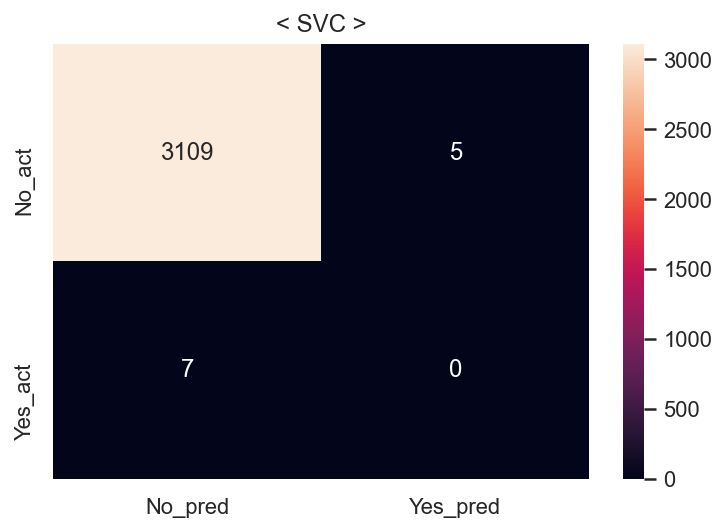

Fit time : 0.25 min


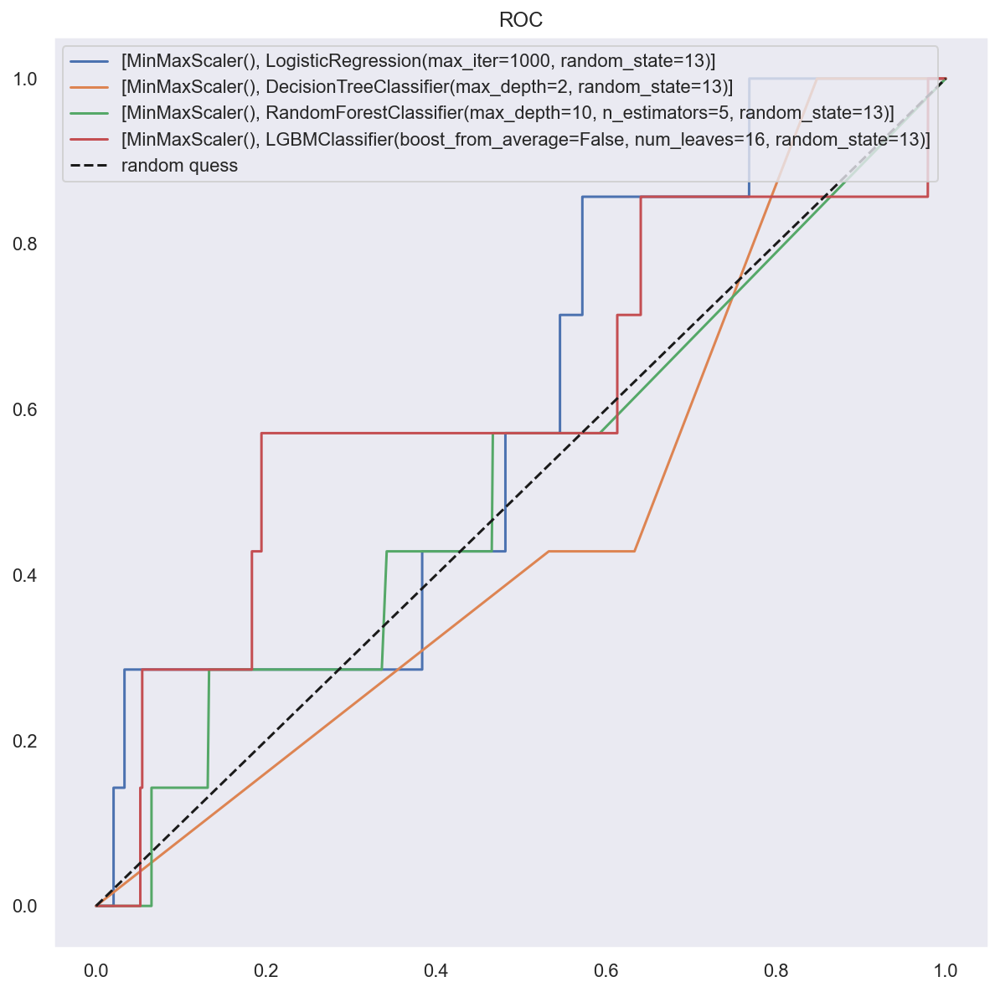

In [76]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list28, result_df28 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [112]:
result_df28["null_del"] = [1]  * len(result_df28)
result_df28["encoded"] = [1]  * len(result_df28)
result_df28["scaler"] = ["MM"]  * len(result_df28)
result_df28["sampler"] = ["ADASYN"]  * len(result_df28)
result_df28 = result_df28[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df28

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,MM,ADASYN,LogisticReg,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000
1,1,1,MM,ADASYN,DecisionTree,0.999883,1.000000,0.999766,0.999883,0.999883,0.992951,0.000000,0.000000,0.000000,0.497592
2,1,1,MM,ADASYN,RandomForest,0.980045,0.962386,0.999141,0.980419,0.980045,0.953541,0.007143,0.142857,0.013605,0.549110
3,1,1,MM,ADASYN,LightGBM,0.998477,0.999218,0.997735,0.998476,0.998477,0.996155,0.000000,0.000000,0.000000,0.499197
4,1,1,MM,ADASYN,SVC,0.999844,1.000000,0.999688,0.999844,0.999844,0.996155,0.000000,0.000000,0.000000,0.499197


## 스물아홉번째
### (1) NULL값 삭제, (2)데이터 분리, (3) SMOTE, (4) Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


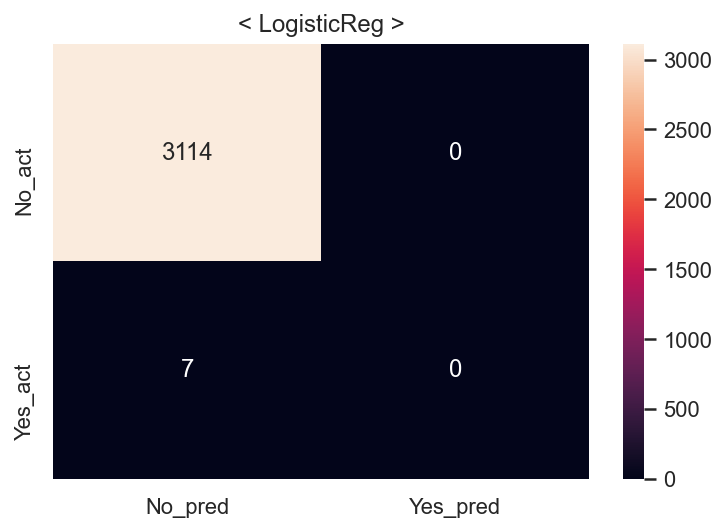

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


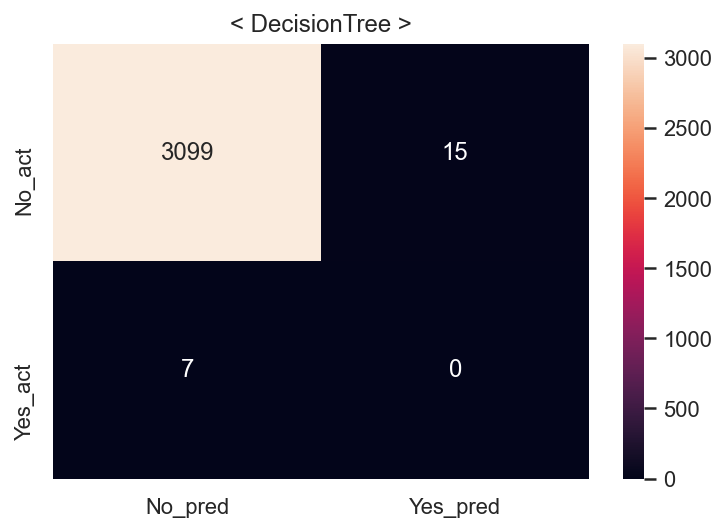

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


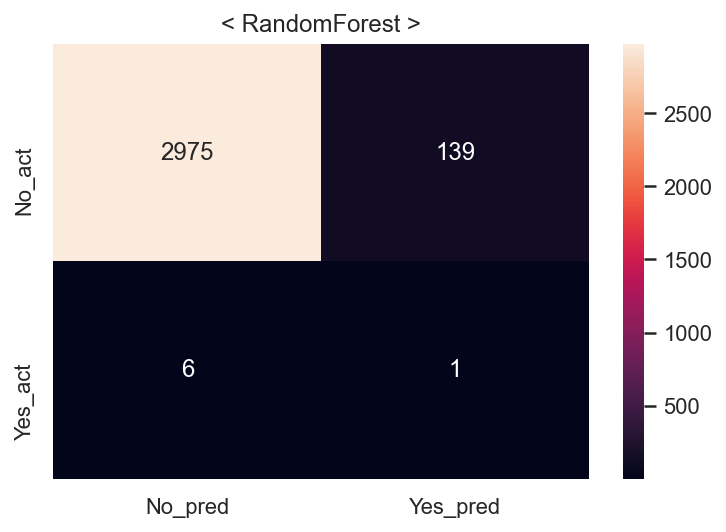

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


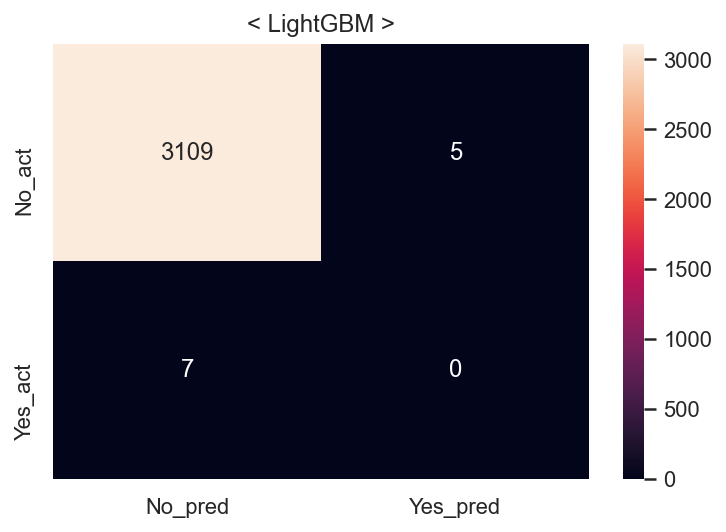

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


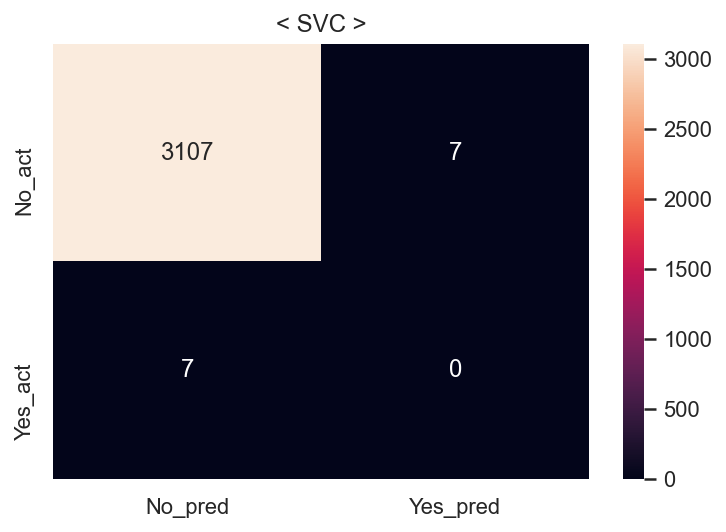

Fit time : 0.44 min


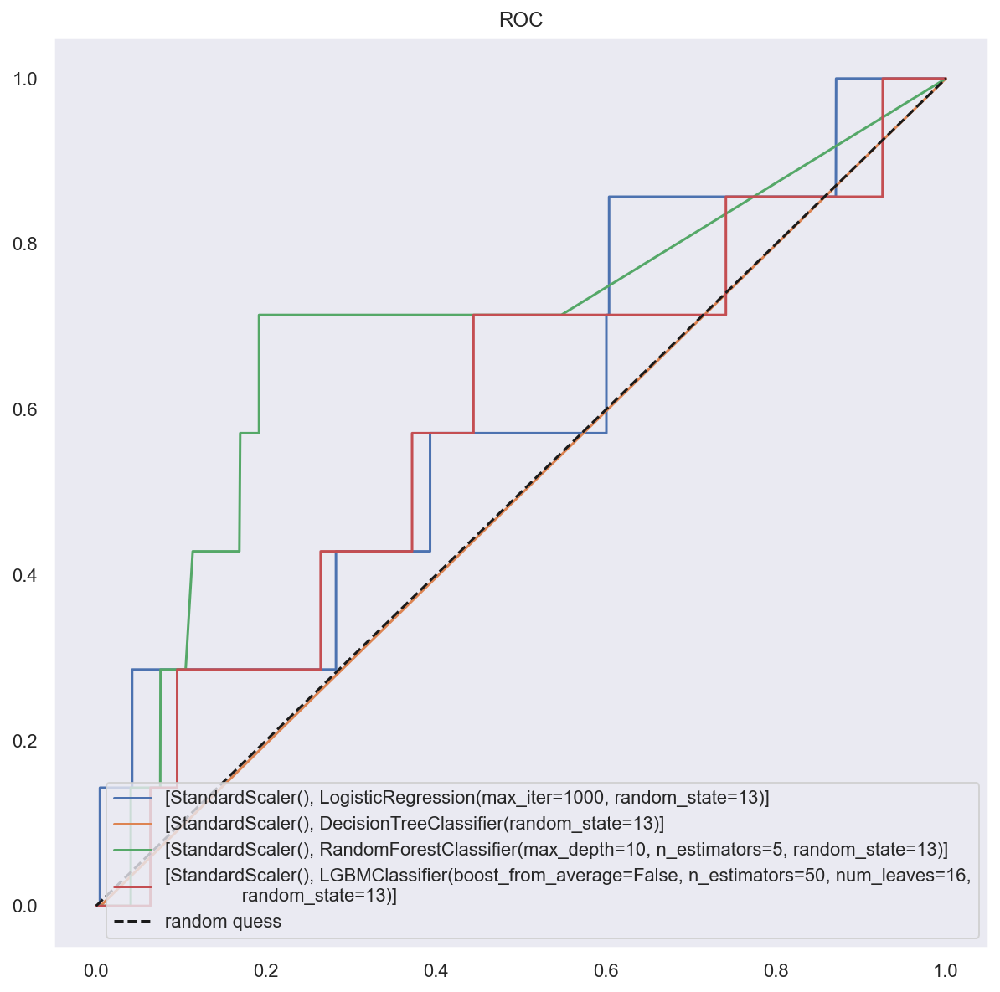

In [77]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list29, result_df29 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [113]:
result_df29["null_del"] = [1]  * len(result_df29)
result_df29["encoded"] = [1]  * len(result_df29)
result_df29["scaler"] = ["SD"]  * len(result_df29)
result_df29["sampler"] = ["SMOTE"]  * len(result_df29)
result_df29 = result_df29[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df29

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,SD,SMOTE,LogisticReg,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000
1,1,1,SD,SMOTE,DecisionTree,0.999883,1.000000,0.999766,0.999883,0.999883,0.992951,0.000000,0.000000,0.000000,0.497592
2,1,1,SD,SMOTE,RandomForest,0.980045,0.962386,0.999141,0.980419,0.980045,0.953541,0.007143,0.142857,0.013605,0.549110
3,1,1,SD,SMOTE,LightGBM,0.998477,0.999218,0.997735,0.998476,0.998477,0.996155,0.000000,0.000000,0.000000,0.499197
4,1,1,SD,SMOTE,SVC,0.999688,1.000000,0.999375,0.999687,0.999688,0.995514,0.000000,0.000000,0.000000,0.498876


## 서른번째
### (1) NULL값 삭제, (2)데이터 분리, (3) ADASYN, (4) Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12794]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


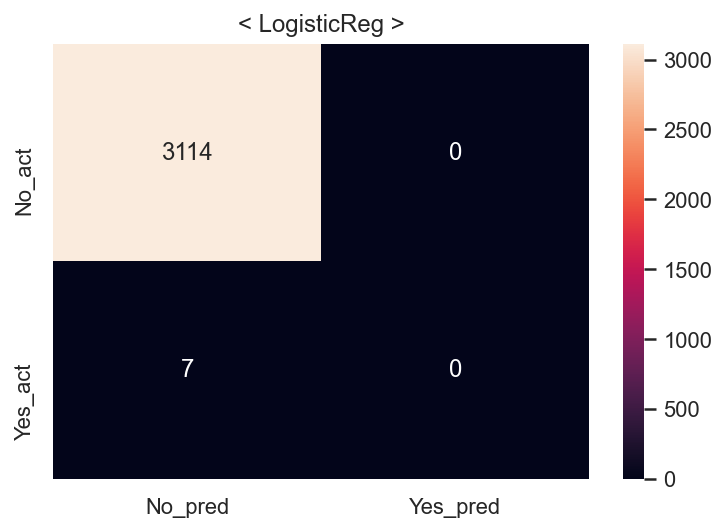

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


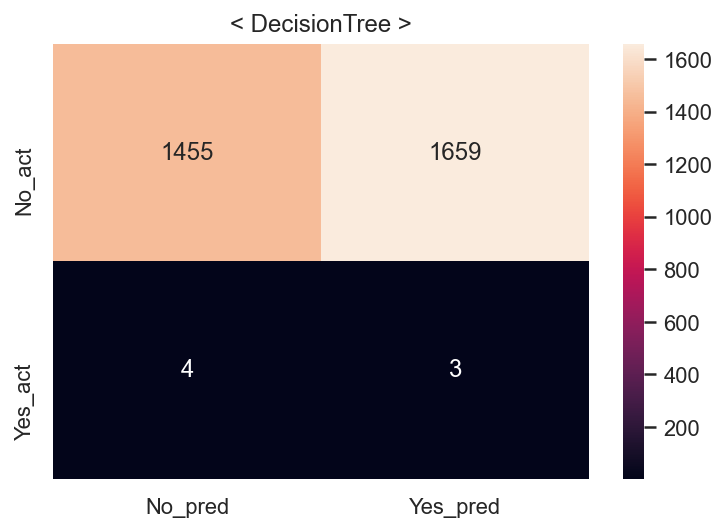

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


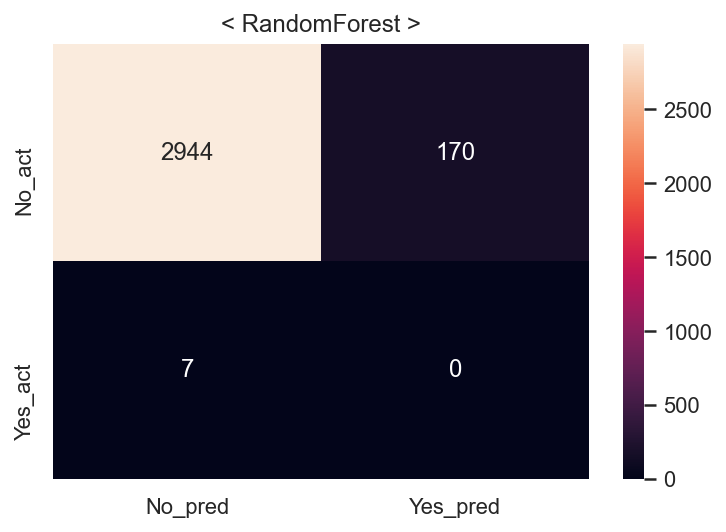

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


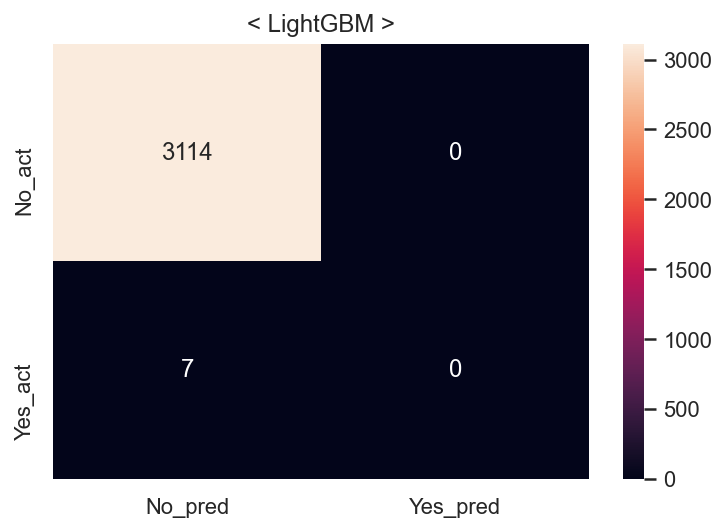

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


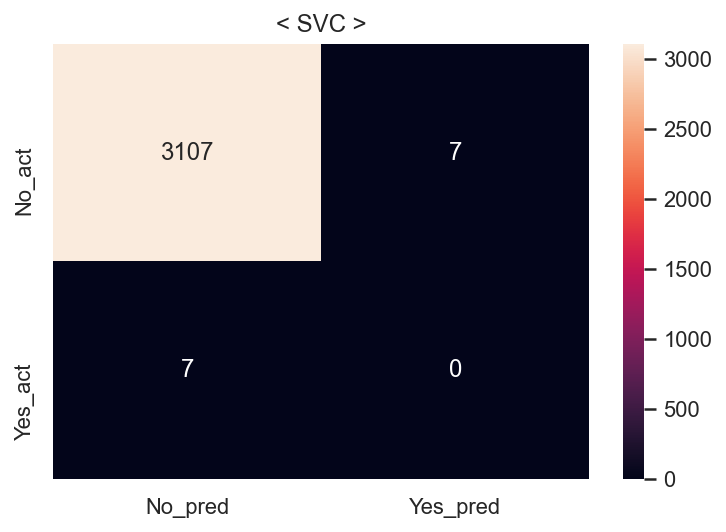

Fit time : 0.41 min


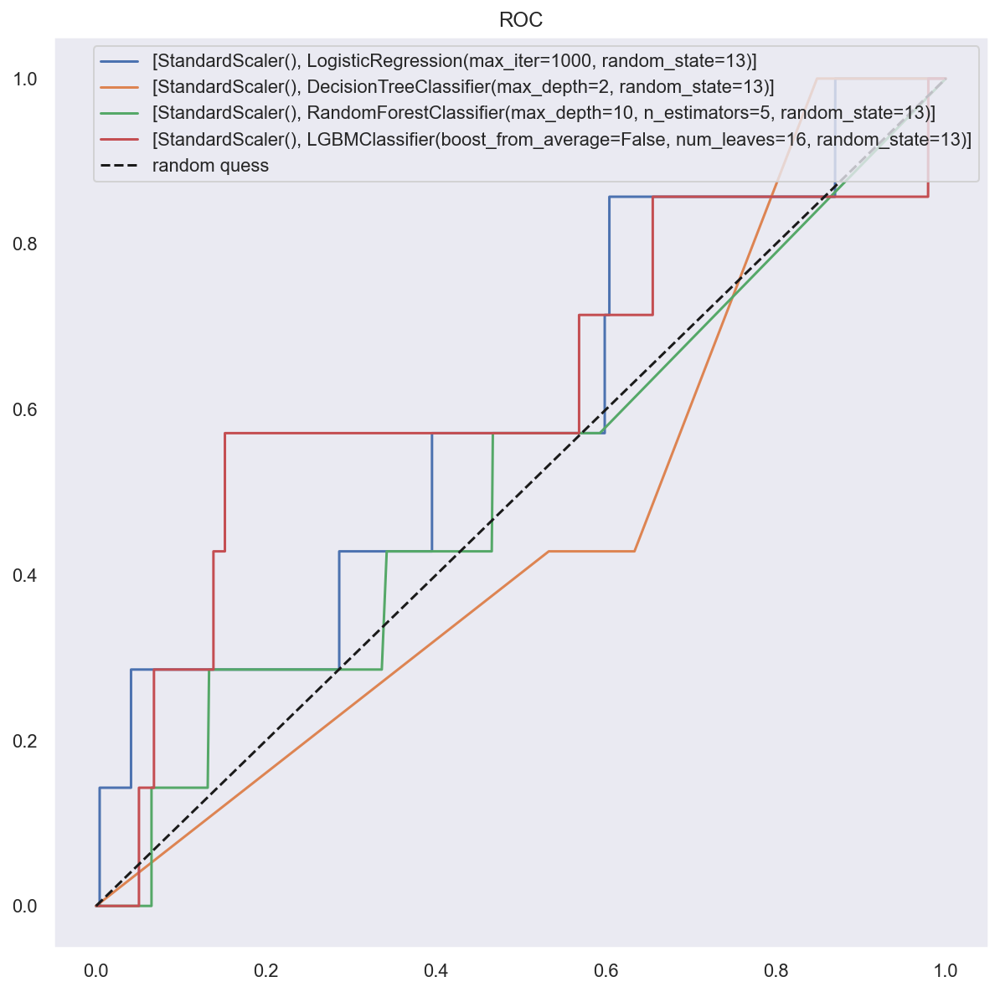

In [78]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list30, result_df30 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [114]:
result_df30["null_del"] = [1]  * len(result_df30)
result_df30["encoded"] = [1]  * len(result_df30)
result_df30["scaler"] = ["SD"]  * len(result_df30)
result_df30["sampler"] = ["ADASYN"]  * len(result_df30)
result_df30 = result_df30[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df30

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,SD,ADASYN,LogisticReg,0.998672,1.000000,0.997343,0.998669,0.998671,0.997757,0.000000,0.000000,0.000000,0.500000
1,1,1,SD,ADASYN,DecisionTree,0.766193,0.707985,0.905815,0.794774,0.766247,0.467158,0.001805,0.428571,0.003595,0.447908
2,1,1,SD,ADASYN,RandomForest,0.974256,0.952023,0.998828,0.974864,0.974265,0.943287,0.000000,0.000000,0.000000,0.472704
3,1,1,SD,ADASYN,LightGBM,0.998867,1.000000,0.997733,0.998865,0.998867,0.997757,0.000000,0.000000,0.000000,0.500000
4,1,1,SD,ADASYN,SVC,0.999687,1.000000,0.999375,0.999687,0.999687,0.995514,0.000000,0.000000,0.000000,0.498876


## 서른한번째
### (1) NULL값 삭제, (2)데이터 분리, (3) SMOTE, (4) Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.4s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


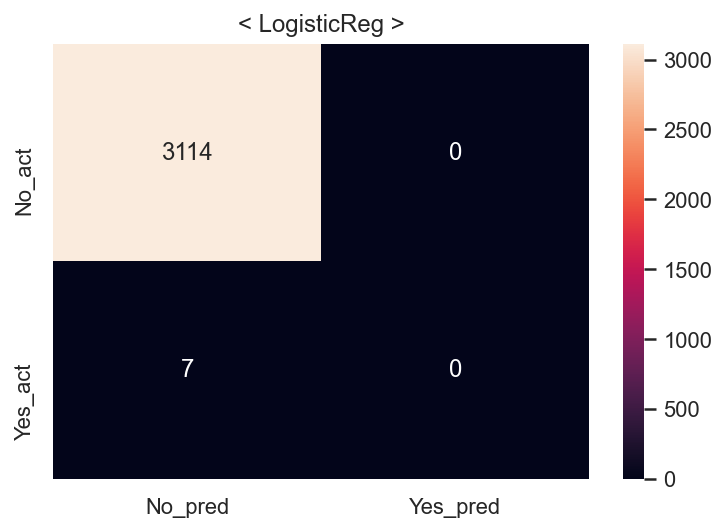

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


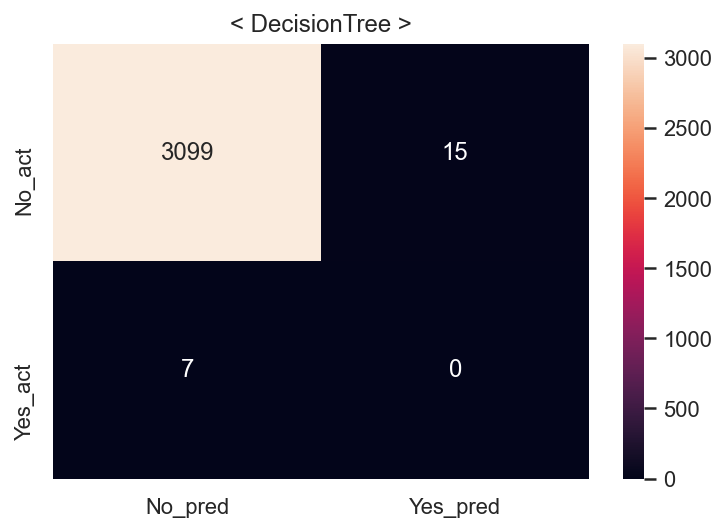

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


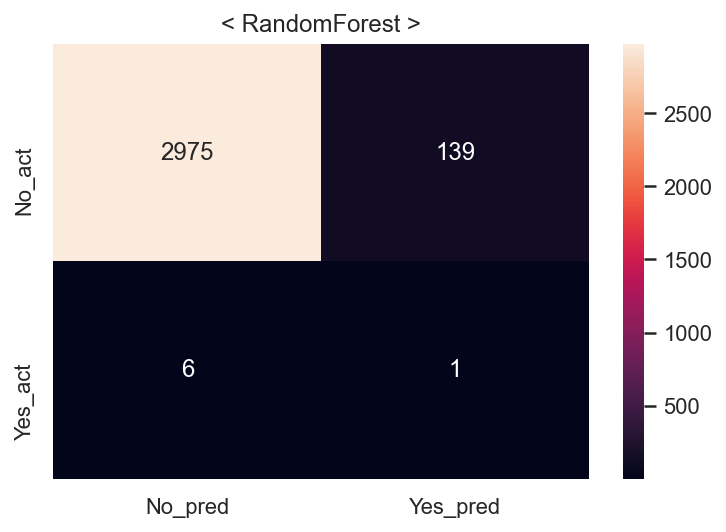

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


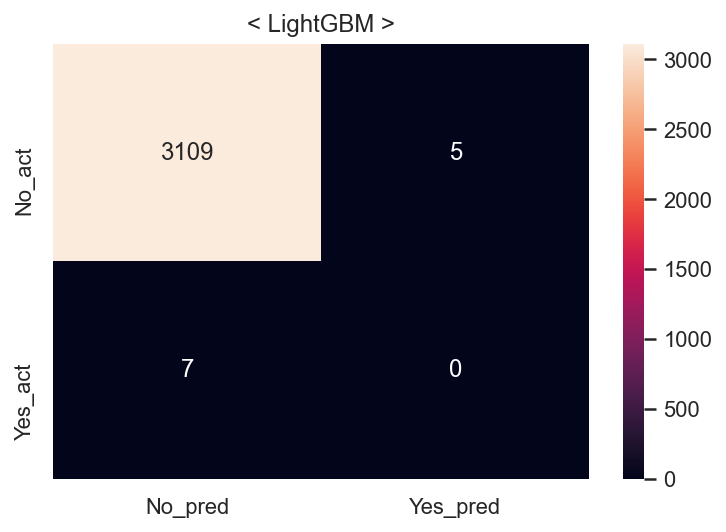

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


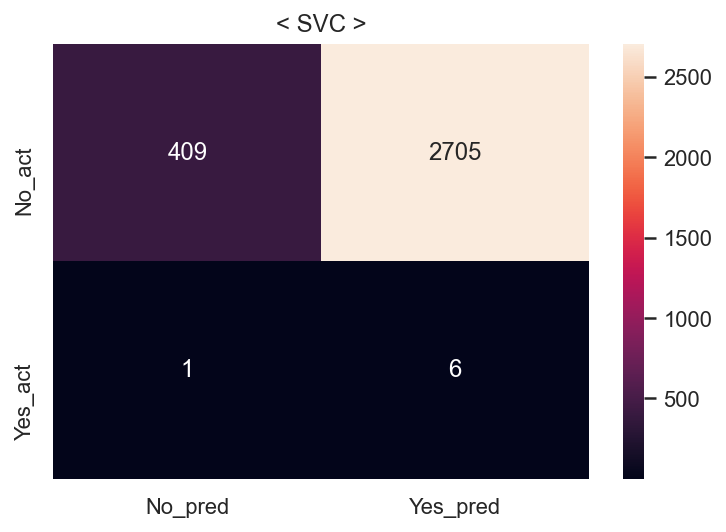

Fit time : 2.37 min


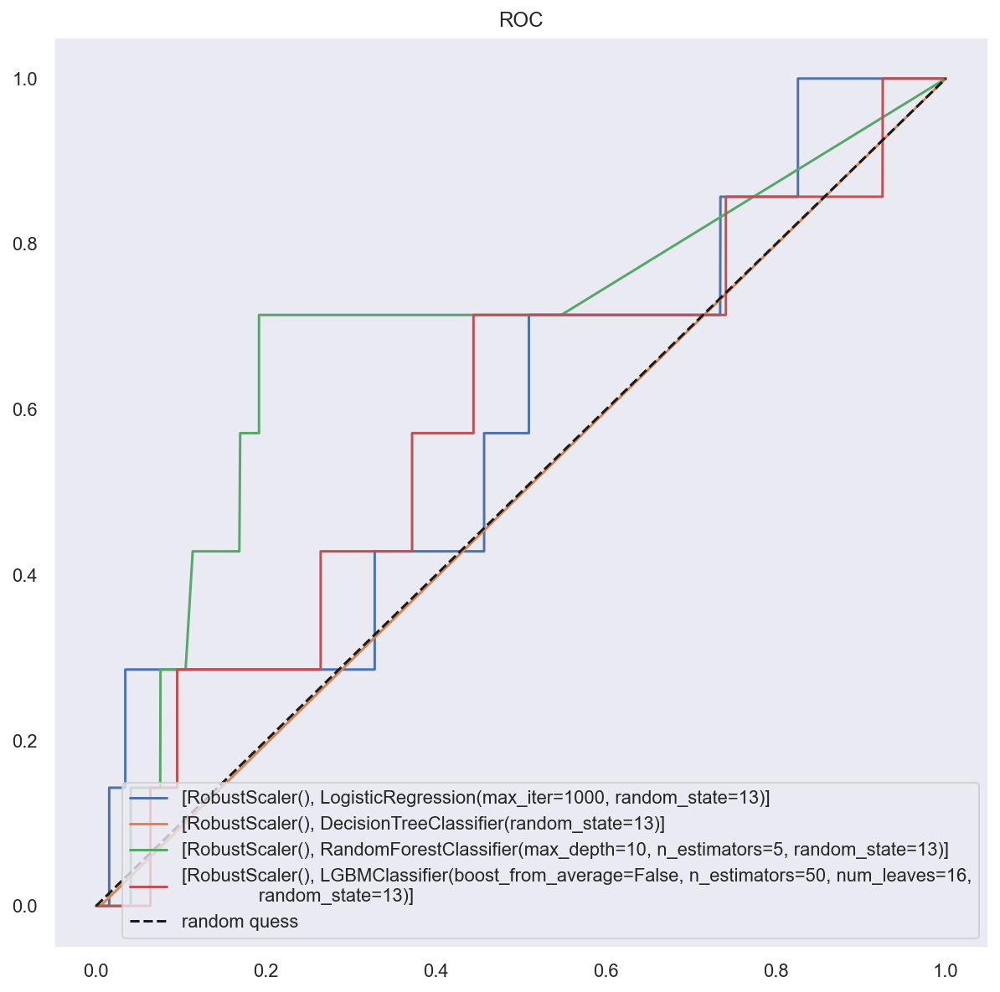

In [79]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)result_df30["null_del"] = [1]  * len(result_df30)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list31, result_df31 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [115]:
result_df31["null_del"] = [1]  * len(result_df31)
result_df31["encoded"] = [1]  * len(result_df31)
result_df31["scaler"] = ["RB"]  * len(result_df31)
result_df31["sampler"] = ["SMOTE"]  * len(result_df31)
result_df31 = result_df31[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df31

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,RB,SMOTE,LogisticReg,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000
1,1,1,RB,SMOTE,DecisionTree,0.999883,1.000000,0.999766,0.999883,0.999883,0.992951,0.000000,0.000000,0.000000,0.497592
2,1,1,RB,SMOTE,RandomForest,0.980045,0.962386,0.999141,0.980419,0.980045,0.953541,0.007143,0.142857,0.013605,0.549110
3,1,1,RB,SMOTE,LightGBM,0.998477,0.999218,0.997735,0.998476,0.998477,0.996155,0.000000,0.000000,0.000000,0.499197
4,1,1,RB,SMOTE,SVC,0.566815,0.535799,1.000000,0.697747,0.566815,0.132970,0.002213,0.857143,0.004415,0.494243


## 서른두번째
### (1) NULL값 삭제, (2)데이터 분리, (3) ADASYN, (4) Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12794]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


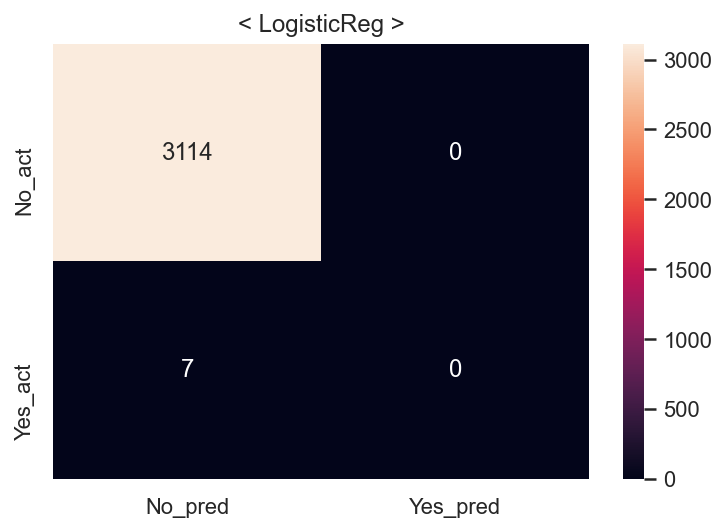

Fitting 5 folds for each of 4 candidates, totalling 20 fits
====Done Evaluation====
====Done Evaluation====


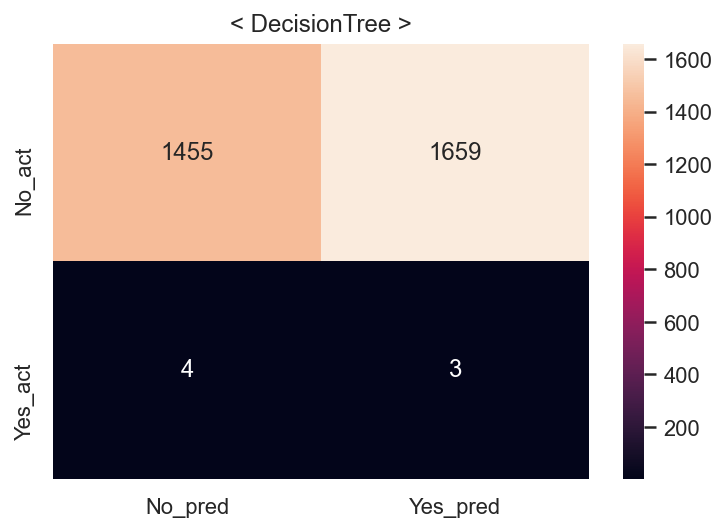

Fitting 5 folds for each of 28 candidates, totalling 140 fits
====Done Evaluation====
====Done Evaluation====


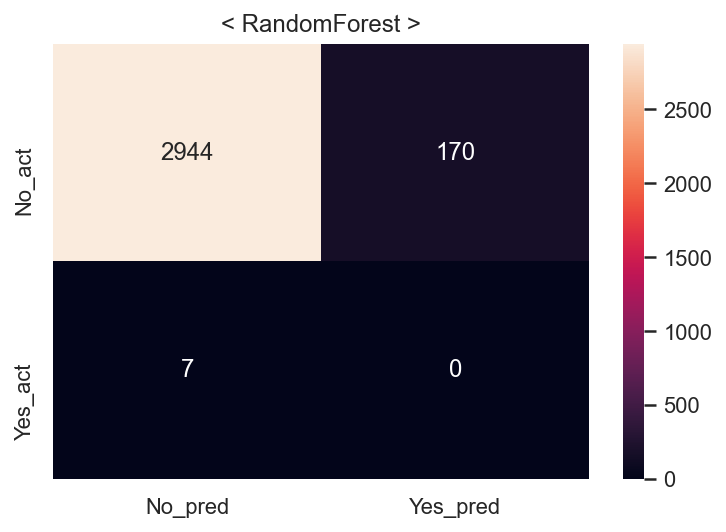

Fitting 5 folds for each of 12 candidates, totalling 60 fits
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


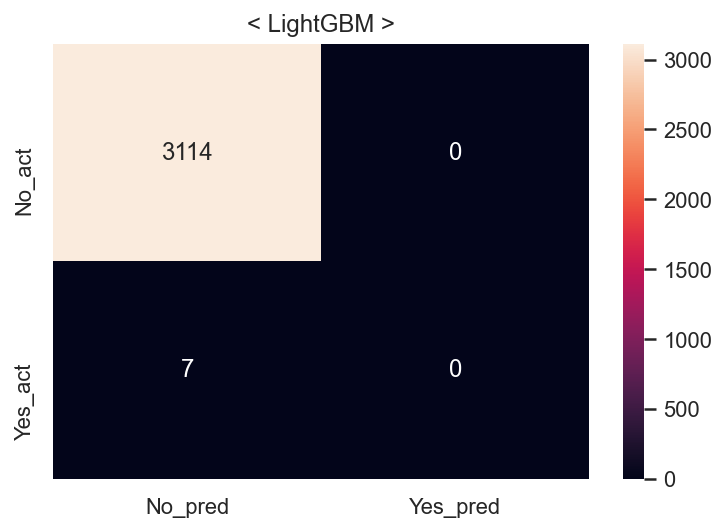

Fitting 5 folds for each of 1 candidates, totalling 5 fits
====Done Evaluation====
====Done Evaluation====


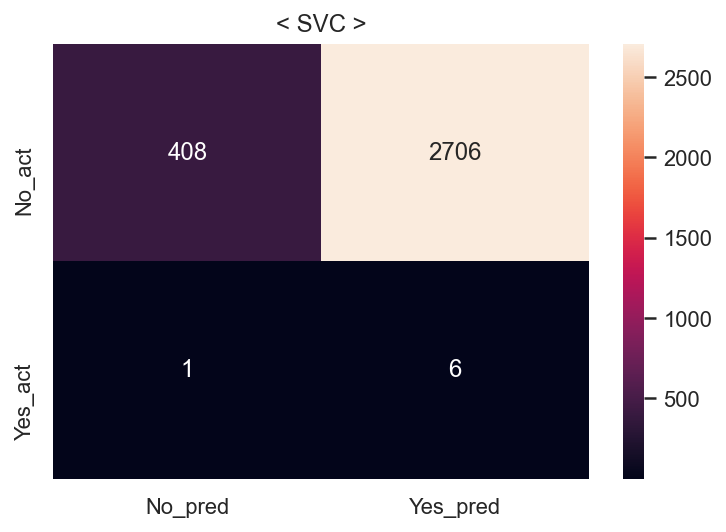

Fit time : 2.34 min


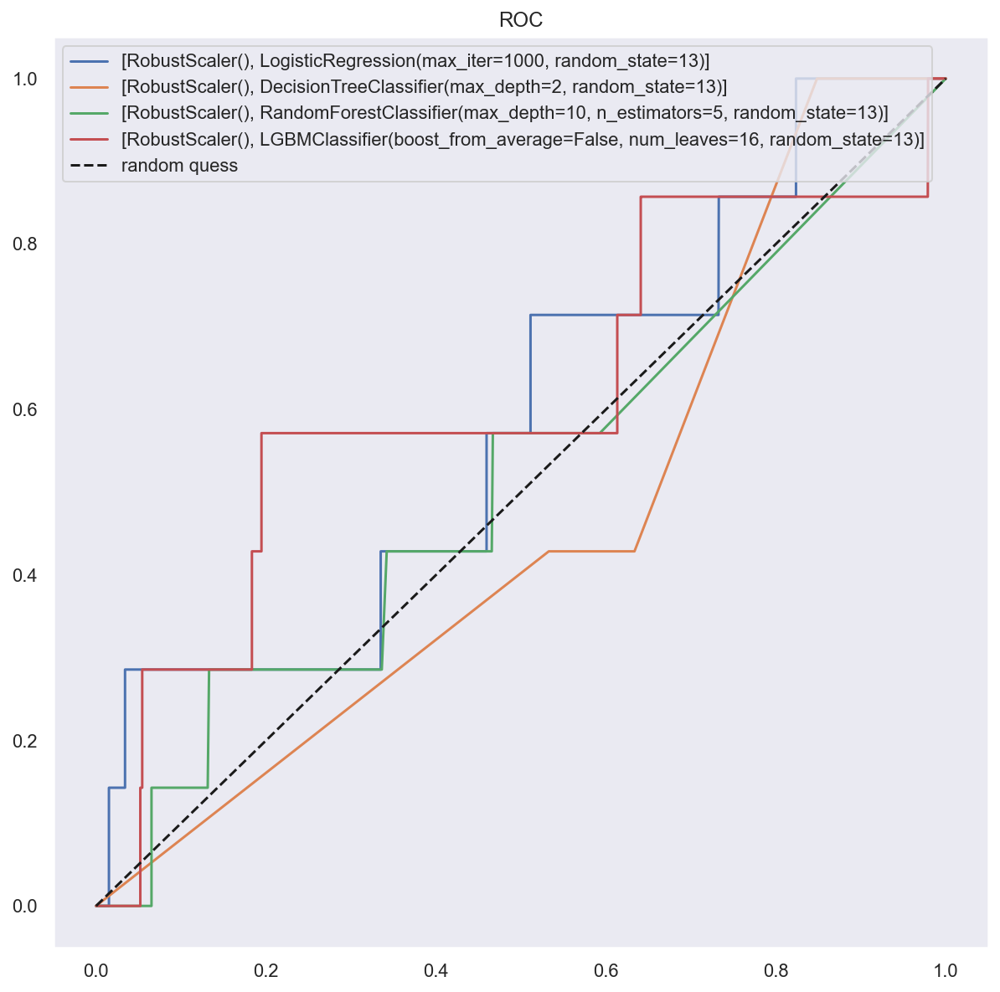

In [80]:
# null 삭제
socar_strange_delete = socar_strange_index.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list32, result_df32 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [116]:
result_df32["null_del"] = [1]  * len(result_df32)
result_df32["encoded"] = [1]  * len(result_df32)
result_df32["scaler"] = ["RB"]  * len(result_df32)
result_df32["sampler"] = ["ADASYN"]  * len(result_df32)
result_df32 = result_df32[['null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df32

,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,RB,ADASYN,LogisticReg,0.998672,1.000000,0.997343,0.998669,0.998671,0.997757,0.000000,0.000000,0.000000,0.500000
1,1,1,RB,ADASYN,DecisionTree,0.766193,0.707985,0.905815,0.794774,0.766247,0.467158,0.001805,0.428571,0.003595,0.447908
2,1,1,RB,ADASYN,RandomForest,0.974256,0.952023,0.998828,0.974864,0.974265,0.943287,0.000000,0.000000,0.000000,0.472704
3,1,1,RB,ADASYN,LightGBM,0.998828,1.000000,0.997655,0.998826,0.998828,0.997757,0.000000,0.000000,0.000000,0.500000
4,1,1,RB,ADASYN,SVC,0.566646,0.535605,1.000000,0.697582,0.566815,0.132650,0.002212,0.857143,0.004413,0.494082


In [118]:
# 끝
total = pd.concat([result_df, result_df2, result_df3, result_df4, 
                        result_df5, result_df6, result_df7, result_df8,
                        result_df9, result_df10, result_df11, result_df12,
                        result_df13, result_df14, result_df15, result_df16, 
                        result_df17, result_df18, result_df19, result_df20,
                        result_df21, result_df22, result_df23, result_df24,
                        result_df25, result_df26, result_df27, result_df28,
                        result_df29, result_df30, result_df31, result_df32], axis=0).reset_index(drop=True)
print(total.shape)
total

(160, 15)


,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,None,SMOTE,LogisticReg,0.536317,0.518843,1.000000,0.683208,0.536317,0.079462,0.002085,0.857143,0.004159,0.467428
1,0,0,None,SMOTE,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.986543,0.000000,0.000000,0.000000,0.494380
2,0,0,None,SMOTE,RandomForest,0.999844,1.000000,0.999688,0.999844,0.999844,0.996155,0.000000,0.000000,0.000000,0.499197
3,0,0,None,SMOTE,LightGBM,0.990394,0.982703,0.998360,0.990470,0.990394,0.977251,0.000000,0.000000,0.000000,0.489724
4,0,0,None,SMOTE,SVC,0.505037,0.502531,1.000000,0.668913,0.505037,0.016341,0.002275,1.000000,0.004540,0.507065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1,1,RB,ADASYN,LogisticReg,0.998672,1.000000,0.997343,0.998669,0.998671,0.997757,0.000000,0.000000,0.000000,0.500000
156,1,1,RB,ADASYN,DecisionTree,0.766193,0.707985,0.905815,0.794774,0.766247,0.467158,0.001805,0.428571,0.003595,0.447908
157,1,1,RB,ADASYN,RandomForest,0.974256,0.952023,0.998828,0.974864,0.974265,0.943287,0.000000,0.000000,0.000000,0.472704
158,1,1,RB,ADASYN,LightGBM,0.998828,1.000000,0.997655,0.998826,0.998828,0.997757,0.000000,0.000000,0.000000,0.500000
